---
# MUST RUN BEFORE TO MAKE TEXT IN SVG EDITABLE

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

plt.rcParams['svg.fonttype'] = 'none' # This setting prevents text from being converted to paths.
plt.rcParams['font.family'] = 'sans-serif' # This sets a generic, common font family

---
# Create Stimulation Timeline

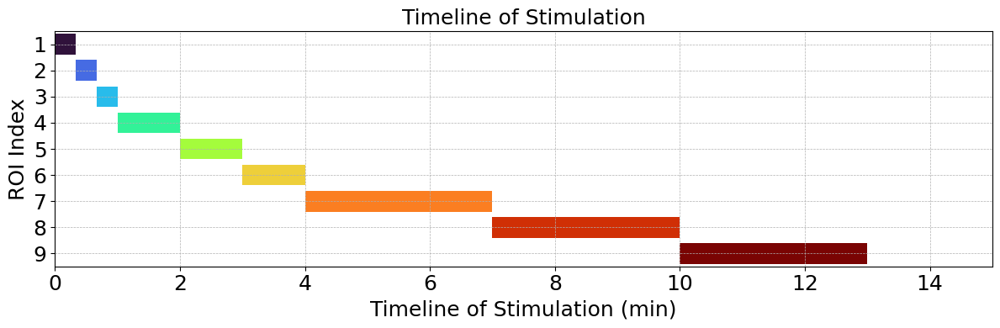

In [2]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data representing the start time, duration, and ROI index
# This data needs to be structured based on your experiment
# For example: (ROI_index, start_time, duration)
data = [
    (1, 0, 1/3),
    (2, 1/3, 1/3),
    (3, 2/3, 1/3),
    (4, 1, 1),
    (5, 2, 1),
    (6, 3, 1),
    (7, 4, 3),
    (8, 7, 3),
    (9, 10, 3)


]

# Unpack the data into separate lists for plotting
roi_indices = [d[0] for d in data]
start_times = [d[1] for d in data]
durations = [d[2] for d in data]

# Create a colormap
cmap = plt.get_cmap('turbo') # You can change this to any colormap you prefer, like 'viridis', 'plasma', etc.
colors = cmap(np.linspace(0, 1, len(roi_indices)))

# Create the figure and axes
fig, ax = plt.subplots(figsize=(12, 4))

# Plot the horizontal bars
ax.barh(roi_indices, durations, left=start_times, color=colors, height=0.8)

# Set the x and y axis labels and limits
ax.set_xlabel('Timeline of Stimulation (min)',  fontsize=18)
ax.set_ylabel('ROI Index',fontsize=18)
ax.set_ylim(0.5, 9.5) # Adjust based on your ROI indices
ax.set_xlim(0, 15)
ax.set_yticks(roi_indices)

# Add grid lines for better readability
ax.grid(True, which='both', linestyle='--', linewidth=0.5, zorder=0)

# Invert the y-axis to match the provided image, where 0 is at the top
ax.invert_yaxis()

ax.tick_params(axis='both', which='major', labelsize=18)


# Set the title
ax.set_title('Timeline of Stimulation',fontsize=18)
# ax.legend({"ROI index","ROI 2"})

# Show the plot
plt.tight_layout()

# save as SVG
# plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/Figure1A.svg", format="svg")
plt.show()

---
# Import ROIs & Create Succcesive ROI Boxes around max dwell time

## - ROIs from Stimulated Regions (Original reordering)

### -- Load in Original Tif Use For Stimulation

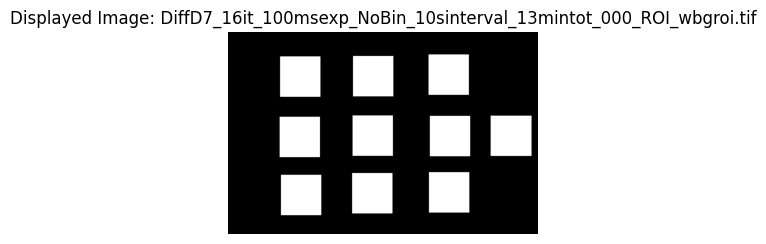

In [3]:
# Display tiff for ROIs
import cv2
import matplotlib.pyplot as plt

# The file path to your TIFF image
file_path = '/Users/kos-mos/Documents/DiffD7_16it_100msexp_NoBin_10sinterval_13mintot_000_ROI_wbgroi.tif'

try:
    # Read the TIFF image in grayscale
    # cv2.IMREAD_GRAYSCALE ensures it's read as a single channel image
    image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)

    # Check if the image was loaded successfully
    if image is None:
        print(f"Error: Could not load image from {file_path}. Please check the path and file integrity.")
    else:
        # Display the image using matplotlib
        plt.figure(figsize=(4, 4)) # Optional: Adjust figure size
        plt.imshow(image, cmap='gray') # Use 'gray' colormap for grayscale images
        plt.title(f"Displayed Image: {file_path.split('/')[-1]}") # Set title to filename
        plt.axis('off') # Hide axes for a cleaner view
        plt.show()

except Exception as e:
    print(f"An error occurred: {e}")

### -- Reorder Indices Based on Wanted Index Number Stimulation 

Image loaded successfully from 'DiffD7_16it_100msexp_NoBin_10sinterval_13mintot_000_ROI_wbgroi.tif'. Original dimensions: 2840x1848 (WxH).
Found 10 contiguous regions (ROIs) on the processed image.
Applied reordering: {1: 3, 2: 2, 3: 1, 4: 5, 5: 10, 6: 6, 7: 4, 8: 9, 9: 8, 10: 7}


/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/4210155062.py:79: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  custom_cmap = plt.cm.get_cmap('turbo')


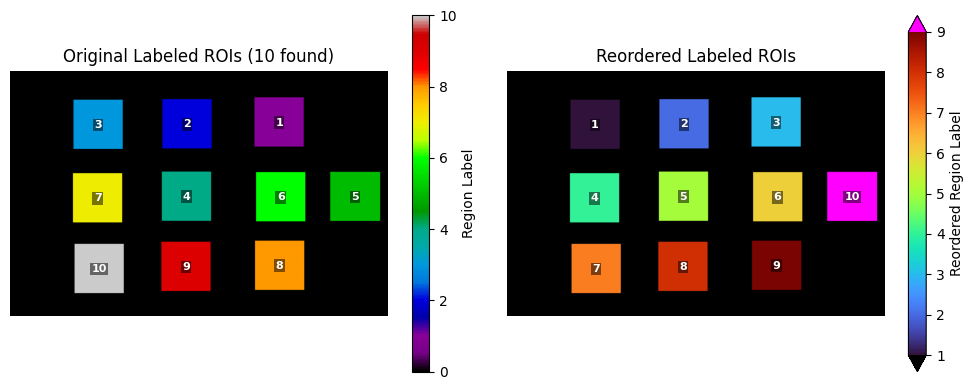

In [4]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.ndimage import label, find_objects
from matplotlib.colors import ListedColormap

# --- NEW: IMAGE RESIZING FLAG AND DIMENSIONS ---
RESIZE_IMAGE = False      # Set to True to enable resizing
TARGET_WIDTH = 2840        # Desired width in pixels (X dimension)
TARGET_HEIGHT = 1848       # Desired height in pixels (Y dimension)
# Choose interpolation method:
# cv2.INTER_AREA: good for shrinking
# cv2.INTER_LINEAR: good for general purpose, default
# cv2.INTER_CUBIC: good for enlarging, slower
RESIZE_INTERPOLATION = cv2.INTER_LINEAR 
# -----------------------------------------------


try:
    # Read the TIFF image in grayscale
    image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)

    if image is None:
        print(f"Error: Could not load image from {file_path}. Please check the path and file integrity.")
    else:
        original_height, original_width = image.shape
        print(f"Image loaded successfully from '{file_path.split('/')[-1]}'. Original dimensions: {original_width}x{original_height} (WxH).")

        # --- Apply Resizing if Enabled ---
        if RESIZE_IMAGE:
            if TARGET_WIDTH <= 0 or TARGET_HEIGHT <= 0:
                print("[Warning] TARGET_WIDTH and TARGET_HEIGHT must be positive. Skipping resize.")
            else:
                if original_width != TARGET_WIDTH or original_height != TARGET_HEIGHT:
                    image = cv2.resize(image, (TARGET_WIDTH, TARGET_HEIGHT), interpolation=RESIZE_INTERPOLATION)
                    print(f"Image resized to {image.shape[1]}x{image.shape[0]} (WxH).")
                else:
                    print("Image already has target dimensions. No resizing performed.")
        # ---------------------------------

        # --- Binarize, Label, and Find Objects (AFTER potential resizing) ---
        binary_mask = image > 0 
        labeled_mask, num_features = label(binary_mask)
        objects = find_objects(labeled_mask) 
        print(f"Found {num_features} contiguous regions (ROIs) on the processed image.")

        # --- USER-SPECIFIED REORDERING MAP (EDIT THIS DICTIONARY DIRECTLY IN THE CODE) ---
        reorder_map = {
            1: 3,
            2: 2,
            3: 1,  # Original ROI 3 becomes reordered label 1
            4: 5,
            5: 10, # Original ROI 5 becomes reordered label 10
            6: 6,
            7: 4,
            8: 9,
            9: 8,
            10: 7
        }
        # ---------------------------------------------------------------------------------

        if reorder_map: 
            # Apply the reordering
            reordered_labeled_mask = np.zeros_like(labeled_mask, dtype=labeled_mask.dtype)
            
            for old_label in range(1, num_features + 1):
                if old_label not in reorder_map:
                    reordered_labeled_mask[labeled_mask == old_label] = old_label

            for old_label, new_label in reorder_map.items():
                if 1 <= old_label <= num_features: 
                    reordered_labeled_mask[labeled_mask == old_label] = new_label
                else:
                    print(f"[Warning] Old label {old_label} specified in reorder_map was not found. Skipping.")

            print(f"Applied reordering: {reorder_map}")

            # --- Configure the Colormap ---
            custom_cmap = plt.cm.get_cmap('turbo')
            custom_cmap.set_under('black')
            custom_cmap.set_over('magenta') 

            # --- Display both images side-by-side using subplots ---
            fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4)) 

            # Display the original labeled mask on the first subplot
            img1 = ax1.imshow(labeled_mask, cmap='nipy_spectral')
            ax1.set_title(f"Original Labeled ROIs ({num_features} found)")
            ax1.axis('off')
            plt.colorbar(img1, ax=ax1, label="Region Label")

            # Add numerical labels to the original ROIs
            if num_features > 0:
                for i, bbox in enumerate(objects):
                    if bbox is not None:
                        centroid_y = (bbox[0].start + bbox[0].stop) / 2
                        centroid_x = (bbox[1].start + bbox[1].stop) / 2
                        ax1.text(centroid_x, centroid_y, str(i + 1),
                                 color='white', ha='center', va='center',
                                 fontsize=8, fontweight='bold',
                                 bbox=dict(facecolor='black', alpha=0.5, edgecolor='none', pad=1))

            # Display the reordered labeled mask on the second subplot
            img2 = ax2.imshow(reordered_labeled_mask, cmap=custom_cmap, vmin=1, vmax=9)
            ax2.set_title("Reordered Labeled ROIs")
            ax2.axis('off')
            plt.colorbar(img2, ax=ax2, label="Reordered Region Label", extend='both')

            # Add numerical labels to the reordered ROIs
            for old_idx, bbox in enumerate(objects): 
                if bbox is not None:
                    centroid_y = (bbox[0].start + bbox[0].stop) / 2
                    centroid_x = (bbox[1].start + bbox[1].stop) / 2
                    
                    new_label_val_at_centroid = reordered_labeled_mask[int(centroid_y), int(centroid_x)]
                    
                    if new_label_val_at_centroid != 0: 
                        ax2.text(centroid_x, centroid_y, str(new_label_val_at_centroid),
                                 color='white', ha='center', va='center',
                                 fontsize=8, fontweight='bold',
                                 bbox=dict(facecolor='black', alpha=0.5, edgecolor='none', pad=1))
            
            plt.tight_layout() # Adjusts subplot params for tight layout
            plt.show()

        else:
            print("The 'reorder_map' is empty. No reordering will be applied or a reordered display shown.")
            print("Please edit the 'reorder_map' dictionary in the code if you wish to reorder.")

except Exception as e:
    print(f"An error occurred: {e}")

### -- Display Reordered Stim Regions On FOV (selected ND2 file)

2025-09-12 14:16:59.670 python[45975:27921776] The class 'NSOpenPanel' overrides the method identifier.  This method is implemented by class 'NSWindow'


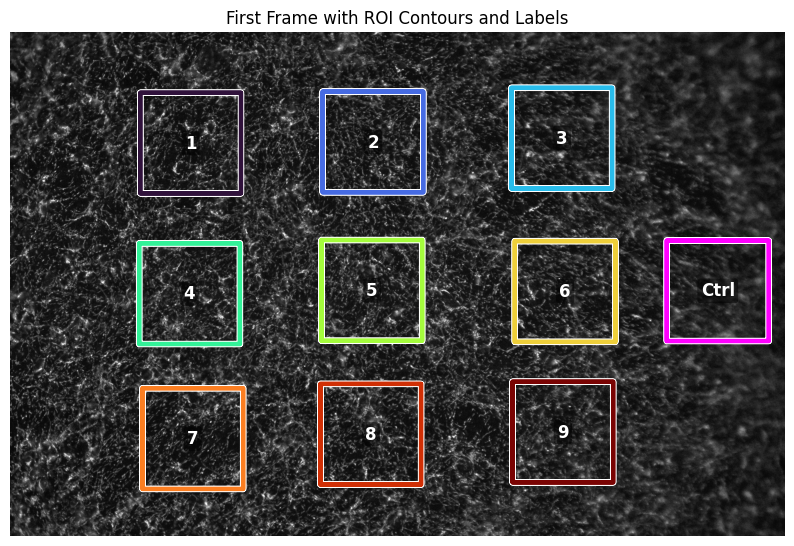

In [ ]:
import nd2
import numpy as np
import matplotlib.pyplot as plt
import tkinter as tk
from tkinter import filedialog, messagebox
from skimage.segmentation import find_boundaries

# --- File Selection Function ---
def select_nd2_file():
    """Opens a file dialog to select a single ND2 file."""
    root = tk.Tk()
    root.withdraw()
    file_path = filedialog.askopenfilenames(
        title="Select an ND2 Movie File",
        filetypes=[("ND2 files", "*.nd2")]
    )
    root.destroy()
    return list(file_path)[0] if file_path else None

# --- Main Display Function ---
def display_first_frame_with_rois(roi_matrix, outline_alpha, outline_linewidth):
    """
    Displays the first frame of a selected ND2 file with contours and labels from a given ROI matrix.
    """
    file_path_nd2 = select_nd2_file()
    if not file_path_nd2:
        messagebox.showinfo("Cancelled", "No ND2 file selected. Operation cancelled.")
        return

    try:
        with nd2.ND2File(file_path_nd2) as nd2_file:
            if 'T' not in nd2_file.sizes or nd2_file.sizes['T'] == 0:
                messagebox.showerror("Error", "The selected ND2 file has no frames or is corrupted.")
                return

            first_frame = nd2_file.read_frame(0)
            if first_frame.ndim > 2:
                first_frame = first_frame[0]

            if roi_matrix.shape != (nd2_file.sizes['Y'], nd2_file.sizes['X']):
                messagebox.showerror("Error", "ROI matrix dimensions do not match image dimensions.")
                return

            fig, ax = plt.subplots(figsize=(10, 10))
            ax.imshow(first_frame ,cmap='gray',vmax=np.percentile(first_frame.flatten(),99.95))
            ax.set_title("First Frame with ROI Contours and Labels")
            ax.axis('off')

            # Use a colormap for ROIs 1-9
            roi_colormap = plt.get_cmap('turbo', 9)

            # --- Loop through each ROI (1 to 9) and draw contours and labels ---
            for roi_index in range(1, 10):
                mask = (roi_matrix == roi_index)
                if mask.any():
                    # Get the color for the current ROI
                    roi_color = roi_colormap(roi_index - 1)
                    
                    # Find and draw the boundaries
                    outline = find_boundaries(mask, mode='inner')
                    ax.contour(outline, levels=[0.5], colors="white", linestyles='solid', alpha=outline_alpha, linewidths=outline_linewidth+1.5)
                    ax.contour(outline, levels=[0.5], colors=[roi_color], linestyles='solid', alpha=outline_alpha, linewidths=outline_linewidth)


                    # Find the center of the ROI and place the index number
                    rows, cols = np.where(mask)
                    center_y, center_x = np.mean(rows), np.mean(cols)
                    ax.text(center_x, center_y, str(roi_index), color='white', ha='center', va='center', fontsize=12, fontweight='bold', bbox=dict(facecolor='black', alpha=0.5, edgecolor='none', boxstyle='round,pad=0.2'))
            
            # --- Check for and draw ROI 10 contour and "Ctrl" label ---
            mask_10 = (roi_matrix == 10)
            if mask_10.any():
                outline_10 = find_boundaries(mask_10, mode='inner')
                ax.contour(outline_10, levels=[0.5], colors="white", linestyles='solid', alpha=outline_alpha, linewidths=outline_linewidth+1.5)
                ax.contour(outline_10, levels=[0.5], colors=['magenta'], linestyles='solid', alpha=outline_alpha, linewidths=outline_linewidth)

                # Find the center of the control ROI and place the "Ctrl" label
                rows, cols = np.where(mask_10)
                center_y, center_x = np.mean(rows), np.mean(cols)
                ax.text(center_x, center_y, "Ctrl", color='white', ha='center', va='center', fontsize=12, fontweight='bold', bbox=dict(facecolor='black', alpha=0.5, edgecolor='none', boxstyle='round,pad=0.2'))

            plt.savefig('/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/First_Frame_With_Rois.svg', format='svg')
            plt.show()

    except Exception as e:
        messagebox.showerror("Processing Error", f"An error occurred: {e}")

if __name__ == "__main__":
    my_roi_matrix = reordered_labeled_mask # Your actual matrix variable

    # --- Define your desired outline properties here ---
    outline_alpha = 1
    outline_linewidth = 3

    # Pass variables to the function
    display_first_frame_with_rois(my_roi_matrix, outline_alpha=outline_alpha, outline_linewidth=outline_linewidth)

## - Create Successive ROIs

### -- Create Succesive ROI

Generating successive borders for ROI 8 with specified thicknesses...


/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_37367/3809276710.py:112: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  base_cmap = plt.cm.get_cmap('jet', num_colors) # Get a base colormap with enough distinct colors


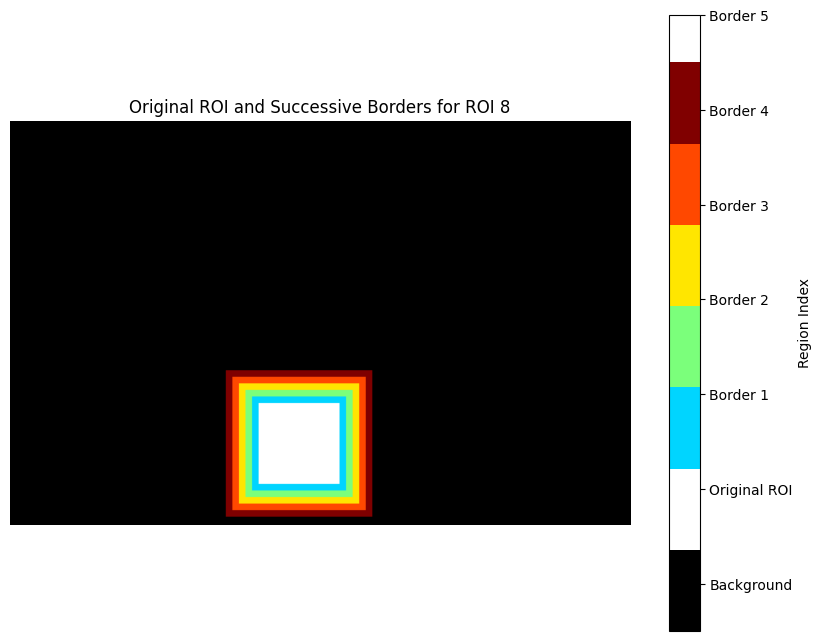

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import binary_dilation # For morphological operations
from matplotlib.colors import ListedColormap # For custom colormap

# --- IMPORTANT ASSUMPTION ---
# This code block assumes that 'reordered_labeled_mask' and 'objects'
# have already been defined and are available in your environment
# from running the first part of your script.
# ----------------------------

# --- USER-SPECIFIED ROI FOR BORDER ANALYSIS (EDIT THIS NUMBER) ---
ROI_NUMBER_TO_ANALYZE = 8 # <--- CHANGE THIS TO THE REORDERED ROI NUMBER YOU WANT TO ANALYZE
# ----------------------------------------------------------------

# --- NEW: USER-SPECIFIED RING THICKNESSES (EDIT THIS LIST) ---
# Each number in this list represents the pixel thickness of a successive ring.
# The number of entries in the list determines the number of rings generated.
#
# Example:
#   [1, 1, 1, 1, 1]  would generate 5 rings, each 1 pixel thick.
#   [2, 3, 2]        would generate 3 rings:
#                      - 1st ring: 2 pixels thick (outer edge is 2px from original ROI)
#                      - 2nd ring: 3 pixels thick (outer edge is 5px from original ROI)
#                      - 3rd ring: 2 pixels thick (outer edge is 7px from original ROI)
thc = int(10 * 3.0769)
RING_THICKNESSES_PIXELS_LIST = [thc, thc, thc, thc, thc] # <--- CHANGE THESE VALUES FOR CUSTOM THICKNESSES
# -----------------------------------------------------------------

if 'reordered_labeled_mask' in locals() and 'objects' in locals():
    unique_reordered_labels = np.unique(reordered_labeled_mask)
    if len(unique_reordered_labels) <= 1 and 0 in unique_reordered_labels:
        print("No reordered ROIs found in the mask to analyze for borders.")
    else:
        selected_roi_label = ROI_NUMBER_TO_ANALYZE
        
        if selected_roi_label not in unique_reordered_labels:
            print(f"Error: The specified ROI number {selected_roi_label} (from ROI_NUMBER_TO_ANALYZE) was not found in the reordered mask.")
            print(f"Available reordered ROI labels: {unique_reordered_labels[unique_reordered_labels != 0]}")
        else:
            selected_roi_mask = (reordered_labeled_mask == selected_roi_label)
            
            # --- Display only the selected ROI ---
            # plt.figure(figsize=(8, 8))
            # plt.imshow(selected_roi_mask, cmap='gray')
            # plt.title(f"Selected ROI: {selected_roi_label}")
            # plt.axis('off')
            # plt.show(block=True)

            # --- Create a map with successive borders based on specified thicknesses ---
            border_map = np.zeros_like(reordered_labeled_mask, dtype=np.uint8) 
            
            # NEW: Assign the original selected ROI to the border_map with index 1
            # This makes the original ROI visible and distinct from the background (0)
            # and the subsequent borders (starting from 2).
            border_map[selected_roi_mask] = 1
            
            s = np.ones((3,3), dtype=bool) # 3x3 structuring element for dilation
            
            print(f"Generating successive borders for ROI {selected_roi_label} with specified thicknesses...")
            
            current_total_dilation_radius = 0 # Tracks the cumulative dilation radius from the original ROI
            num_borders_generated = 0 # This counts the *additional* rings, not including the original ROI

            for i, thickness in enumerate(RING_THICKNESSES_PIXELS_LIST): # i will be 0, 1, 2... for the list
                if thickness <= 0:
                    print(f"Skipping border {i+1}: thickness must be positive. Please provide positive thicknesses.")
                    continue

                # Define the inner boundary radius for the current border
                # This is the outer radius of the previous border/original ROI
                inner_radius_for_current_border = current_total_dilation_radius 
                
                # Update the total dilation radius to define the outer boundary of the current border
                current_total_dilation_radius += thickness 

                # Dilate the ORIGINAL ROI mask to define the outer boundary of the current border
                outer_boundary_mask = binary_dilation(selected_roi_mask, structure=s, iterations=current_total_dilation_radius)
                
                # Dilate the ORIGINAL ROI mask to define the inner boundary of the current border
                if inner_radius_for_current_border == 0:
                    # The inner boundary for the first actual border (i=0) is the original selected_roi_mask
                    inner_boundary_mask = selected_roi_mask 
                else:
                    inner_boundary_mask = binary_dilation(selected_roi_mask, structure=s, iterations=inner_radius_for_current_border)
                
                # Calculate the current border ring: pixels in outer_boundary_mask but not in inner_boundary_mask
                current_border_ring = (outer_boundary_mask.astype(int) - inner_boundary_mask.astype(int))
                
                # Assign this border ring its corresponding number (starting from 2, since original ROI is 1)
                if np.any(current_border_ring > 0): # Check if the border actually generated new pixels
                    border_map[current_border_ring > 0] = i + 2 # Assign border number (2, 3, 4...)
                    num_borders_generated += 1
                else:
                    print(f"Border {i+1} (thickness {thickness}px) did not generate new pixels or reached image boundary. Stopping further border generation.")
                    break # Stop if a border cannot expand further

                # Optional: Check if the dilation has filled the entire image area
                if np.all(outer_boundary_mask):
                    print(f"Stopped at border {i+1}: ROI filled image area.")
                    break
            
            # --- Display the border map ---
            if not np.any(border_map): # If border_map is entirely empty (no original ROI, no borders)
                print("No original ROI pixels or borders generated for the selected ROI. It might be too small.")
            else:
                # --- Custom Colormap for the border map ---
                # Max value in border_map could be 1 (original ROI only) or higher (original + borders)
                max_val_in_map = np.max(border_map)
                num_colors = max_val_in_map + 1 # Need colors for 0 (background) up to max_val_in_map

                base_cmap = plt.cm.get_cmap('jet', num_colors) # Get a base colormap with enough distinct colors
                colors_list = base_cmap(np.arange(num_colors))
                
                # Set specific colors for known labels:
                colors_list[0, :] = [0, 0, 0, 1] # Background (value 0) is black
                colors_list[1, :] = [1, 1, 1, 1] # Original ROI (value 1) is white
                # Colors for borders (2, 3, ...) will come from 'jet' colormap
                
                custom_border_cmap = ListedColormap(colors_list)
                # -------------------------------------------

                plt.figure(figsize=(10, 8))
                plt.imshow(border_map, cmap=custom_border_cmap, vmin=0, vmax=max_val_in_map) 
                plt.title(f"Original ROI and Successive Borders for ROI {selected_roi_label}")
                
                # Create custom colorbar ticks and labels for clarity
                cbar = plt.colorbar(label="Region Index")
                
                # Define tick labels: 0=Background, 1=Original ROI, then Border 1, Border 2, ...
                tick_labels = ['Background', 'Original ROI']
                for k in range(1, num_borders_generated + 1): # For Border 1, Border 2, ...
                    tick_labels.append(f'Border {k}')
                
                # Set tick locations to align with integer values (e.g., center of each discrete color bin)
                # For values 0, 1, 2, ..., N, the ticks should be at 0.5, 1.5, 2.5, ..., N+0.5
                cbar.set_ticks(np.arange(len(tick_labels)) + 0.5) 
                cbar.set_ticklabels(tick_labels)
                
                plt.axis('off')
                plt.show(block=True)
else:
    print("Error: 'reordered_labeled_mask' or 'objects' not found. Please run the main image processing script first to define these variables.")

Generating successive borders for ROI 8 with specified thicknesses...


/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_37367/2489919666.py:86: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  base_cmap = plt.cm.get_cmap(COLORMAP_NAME, num_colors_for_regions)


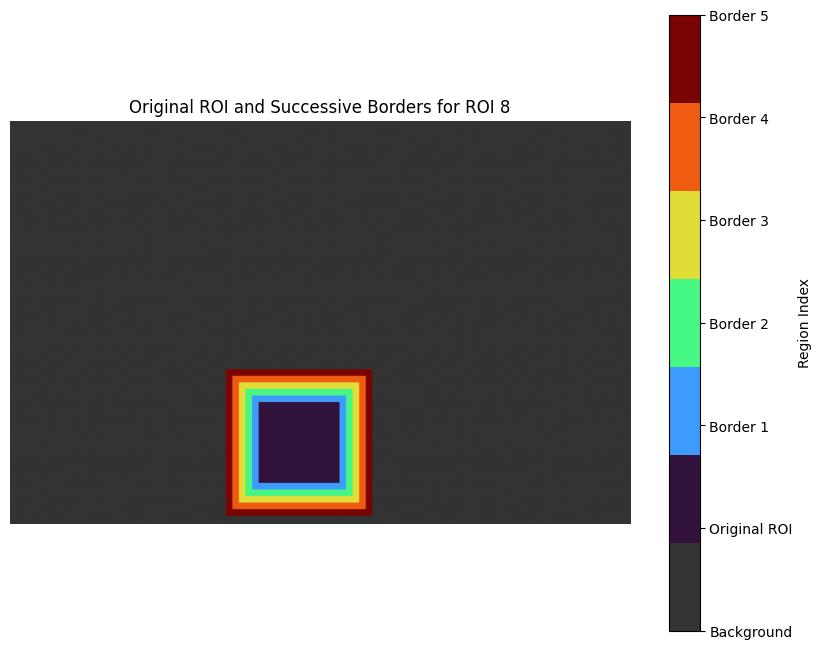

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import binary_dilation
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm

# --- IMPORTANT ASSUMPTION ---
# This code block assumes that 'reordered_labeled_mask' and 'objects'
# have already been defined and are available in your environment
# from running the first part of your script.
# ----------------------------

# --- USER-SPECIFIED ROI FOR BORDER ANALYSIS (EDIT THIS NUMBER) ---
ROI_NUMBER_TO_ANALYZE = 8
# ----------------------------------------------------------------

# --- NEW: USER-SPECIFIED RING THICKNESSES (EDIT THIS LIST) ---
thc = int(10 * 3.0769)
RING_THICKNESSES_PIXELS_LIST = [thc, thc, thc, thc, thc]
# -----------------------------------------------------------------

# --- NEW: USER-SPECIFIED COLORMAP (EDIT THIS STRING) ---
COLORMAP_NAME = 'turbo'
# --------------------------------------------------------

if 'reordered_labeled_mask' in locals() and 'objects' in locals():
    unique_reordered_labels = np.unique(reordered_labeled_mask)
    if len(unique_reordered_labels) <= 1 and 0 in unique_reordered_labels:
        print("No reordered ROIs found in the mask to analyze for borders.")
    else:
        selected_roi_label = ROI_NUMBER_TO_ANALYZE
        
        if selected_roi_label not in unique_reordered_labels:
            print(f"Error: The specified ROI number {selected_roi_label} (from ROI_NUMBER_TO_ANALYZE) was not found in the reordered mask.")
            print(f"Available reordered ROI labels: {unique_reordered_labels[unique_reordered_labels != 0]}")
        else:
            selected_roi_mask = (reordered_labeled_mask == selected_roi_label)
            border_map = np.zeros_like(reordered_labeled_mask, dtype=np.uint8) 
            border_map[selected_roi_mask] = 1
            
            s = np.ones((3,3), dtype=bool)
            
            print(f"Generating successive borders for ROI {selected_roi_label} with specified thicknesses...")
            
            current_total_dilation_radius = 0
            num_borders_generated = 0

            for i, thickness in enumerate(RING_THICKNESSES_PIXELS_LIST):
                if thickness <= 0:
                    print(f"Skipping border {i+1}: thickness must be positive. Please provide positive thicknesses.")
                    continue

                inner_radius_for_current_border = current_total_dilation_radius 
                current_total_dilation_radius += thickness 

                outer_boundary_mask = binary_dilation(selected_roi_mask, structure=s, iterations=current_total_dilation_radius)
                
                if inner_radius_for_current_border == 0:
                    inner_boundary_mask = selected_roi_mask 
                else:
                    inner_boundary_mask = binary_dilation(selected_roi_mask, structure=s, iterations=inner_radius_for_current_border)
                
                current_border_ring = (outer_boundary_mask.astype(int) - inner_boundary_mask.astype(int))
                
                if np.any(current_border_ring > 0):
                    border_map[current_border_ring > 0] = i + 2
                    num_borders_generated += 1
                else:
                    print(f"Border {i+1} (thickness {thickness}px) did not generate new pixels or reached image boundary. Stopping further border generation.")
                    break

                if np.all(outer_boundary_mask):
                    print(f"Stopped at border {i+1}: ROI filled image area.")
                    break
            
            if not np.any(border_map):
                print("No original ROI pixels or borders generated for the selected ROI. It might be too small.")
            else:
                # --- Custom Colormap for the border map ---
                max_val_in_map = np.max(border_map)
                
                # We need one color for each label from 1 to max_val_in_map
                num_colors_for_regions = max_val_in_map
                
                # Get the 'turbo' colormap. We need 'num_colors_for_regions' distinct colors.
                base_cmap = plt.cm.get_cmap(COLORMAP_NAME, num_colors_for_regions)
                
                # Create a custom colormap list. Start with a color for the background (0).
                # Set background color to dark gray.
                colors_list = [[0.2, 0.2, 0.2, 1]] # This will be for border_map value 0
                
                # Add the colors from the turbo colormap.
                # These will be used for border_map values 1, 2, 3...
                colors_list.extend(base_cmap(np.arange(num_colors_for_regions)))
                
                # Create the final custom colormap from the list
                custom_border_cmap = ListedColormap(colors_list)
                # -------------------------------------------

                plt.figure(figsize=(10, 8))
                # Set vmin to 0 so the background color is used.
                plt.imshow(border_map, cmap=custom_border_cmap, vmin=0, vmax=max_val_in_map)
                plt.title(f"Original ROI and Successive Borders for ROI {selected_roi_label}")
                
                cbar = plt.colorbar(label="Region Index")
                
                # Tick labels are now: Background (0), Original ROI (1), Border 1 (2), etc.
                tick_labels = ['Background', 'Original ROI']
                for k in range(1, num_borders_generated + 1):
                    tick_labels.append(f'Border {k}')
                
                # The ticks need to be at the integer values, from 0 to len(tick_labels)-1.
                cbar.set_ticks(np.arange(len(tick_labels)))
                cbar.set_ticklabels(tick_labels)
                
                plt.axis('off')
                plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/Figure2A.svg", format="svg")
                plt.show(block=True)
else:
    print("Error: 'reordered_labeled_mask' or 'objects' not found. Please run the main image processing script first to define these variables.")

In [25]:
# Function to create ROI borders around selected stimROI

import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import binary_dilation
from matplotlib.colors import ListedColormap

def generate_roi_borders(reordered_labeled_mask: np.ndarray, 
                         roi_number_to_analyze: int, 
                         thickness_pixels: float, 
                         num_rings: int = 5) -> np.ndarray:
    """
    Generates a map of a selected ROI and its successive borders with specified thicknesses.

    Args:
        reordered_labeled_mask (np.ndarray): The 2D NumPy array (image) containing 
                                             reordered labeled ROIs (e.g., from a TIFF mask).
        roi_number_to_analyze (int): The specific reordered ROI label number to analyze and
                                     generate borders for.
        thickness_pixels (float): The base thickness in pixels for each successive border ring.
                                  This value will be used for all 'num_rings'.
        num_rings (int, optional): The number of successive border rings to generate. Defaults to 5.

    Returns:
        np.ndarray: A 2D NumPy array (border_map) where:
                    - 0 represents the background.
                    - 1 represents the original selected ROI.
                    - 2, 3, ... represent the successive border rings.
                    Returns an empty array of the same shape as input if the ROI is not found
                    or no borders can be generated.
    """
    if not isinstance(reordered_labeled_mask, np.ndarray) or reordered_labeled_mask.ndim != 2:
        print("Error: 'reordered_labeled_mask' must be a 2D NumPy array.")
        return np.array([]) # Return an empty array indicating error

    # Construct RING_THICKNESSES_PIXELS_LIST based on thickness_pixels and num_rings
    if num_rings <= 0:
        print("Warning: 'num_rings' must be a positive integer. No borders will be generated.")
        return np.zeros_like(reordered_labeled_mask, dtype=np.uint8)

    # Ensure thickness_pixels is an integer for iterations, round if float was passed.
    # The original code uses int(10 * 3.0769), so direct integer conversion is expected.
    ring_thickness_int = int(thickness_pixels) 
    if ring_thickness_int <= 0:
        print("Error: Calculated ring thickness must be a positive integer. No borders will be generated.")
        return np.zeros_like(reordered_labeled_mask, dtype=np.uint8)

    RING_THICKNESSES_PIXELS_LIST = [ring_thickness_int] * num_rings
    
    unique_reordered_labels = np.unique(reordered_labeled_mask)
    
    if roi_number_to_analyze not in unique_reordered_labels:
        print(f"Error: The specified ROI number {roi_number_to_analyze} was not found in the reordered mask.")
        print(f"Available reordered ROI labels: {unique_reordered_labels[unique_reordered_labels != 0]}")
        return np.zeros_like(reordered_labeled_mask, dtype=np.uint8)

    selected_roi_mask = (reordered_labeled_mask == roi_number_to_analyze)
    
    # Initialize border_map with the same shape as the input mask
    border_map = np.zeros_like(reordered_labeled_mask, dtype=np.uint8) 
    
    # Assign the original selected ROI to the border_map with index 1
    border_map[selected_roi_mask] = 1
    
    s = np.ones((3,3), dtype=bool) # 3x3 structuring element for dilation
    
    print(f"Generating successive borders for ROI {roi_number_to_analyze} with specified thicknesses...")
    
    current_total_dilation_radius = 0 # Tracks the cumulative dilation radius from the original ROI
    num_actual_borders_generated = 0 # This counts the *additional* rings that successfully added pixels

    for i, thickness in enumerate(RING_THICKNESSES_PIXELS_LIST): # i will be 0, 1, 2... for the list
        # No need to check thickness <= 0 here because we already checked ring_thickness_int
        # and all elements in RING_THICKNESSES_PIXELS_LIST are the same positive value.

        inner_radius_for_current_border = current_total_dilation_radius 
        current_total_dilation_radius += thickness 

        outer_boundary_mask = binary_dilation(selected_roi_mask, structure=s, iterations=current_total_dilation_radius)
        
        if inner_radius_for_current_border == 0:
            inner_boundary_mask = selected_roi_mask 
        else:
            inner_boundary_mask = binary_dilation(selected_roi_mask, structure=s, iterations=inner_radius_for_current_border)
        
        current_border_ring = (outer_boundary_mask.astype(int) - inner_boundary_mask.astype(int))
        
        if np.any(current_border_ring > 0): # Check if the border actually generated new pixels
            border_map[current_border_ring > 0] = i + 2 # Assign border number (2, 3, 4...)
            num_actual_borders_generated += 1
        else:
            print(f"Border {i+1} (thickness {thickness}px) did not generate new pixels or reached image boundary. Stopping further border generation.")
            break # Stop if a border cannot expand further

        if np.all(outer_boundary_mask):
            print(f"Stopped at border {i+1}: ROI filled image area.")
            break
    
    if not np.any(border_map): # If border_map is entirely empty (no original ROI, no borders)
        print("No original ROI pixels or borders generated for the selected ROI. It might be too small or non-existent.")
        return np.zeros_like(reordered_labeled_mask, dtype=np.uint8) # Return empty mask if nothing was found
    else:
        print(f"Generated {num_actual_borders_generated} successive borders (plus original ROI) for ROI {roi_number_to_analyze}.")
        return border_map


In [ ]:
# Generate Masks for 3min for 33, 66, and 99% intensity

px_per_micron =  3.0769
thickness_pixels= px_per_micron * 10
num_rings=5

result_border_map_33 = generate_roi_borders(
        reordered_labeled_mask=reordered_labeled_mask,
        roi_number_to_analyze=7,
        thickness_pixels= thickness_pixels,
        num_rings=num_rings
    )

result_border_map_66 = generate_roi_borders(
        reordered_labeled_mask=reordered_labeled_mask,
        roi_number_to_analyze=8,
        thickness_pixels= thickness_pixels,
        num_rings=num_rings
    )

result_border_map_99 = generate_roi_borders(
        reordered_labeled_mask=reordered_labeled_mask,
        roi_number_to_analyze=9,
        thickness_pixels= thickness_pixels,
        num_rings=num_rings
    )

Generating successive borders for ROI 7 with specified thicknesses...
Generated 5 successive borders (plus original ROI) for ROI 7.
Generating successive borders for ROI 8 with specified thicknesses...
Generated 5 successive borders (plus original ROI) for ROI 8.
Generating successive borders for ROI 9 with specified thicknesses...
Generated 5 successive borders (plus original ROI) for ROI 9.


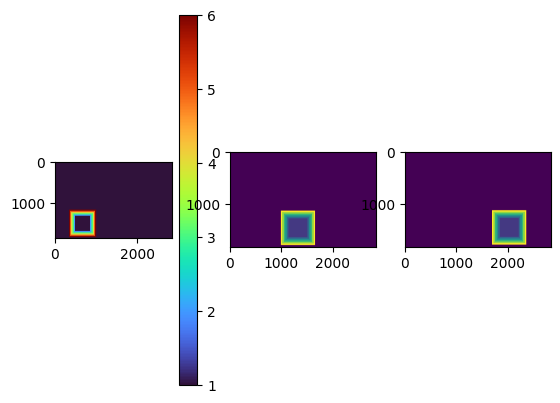

In [27]:
plt.subplot(131); plt.imshow(result_border_map_33, cmap='turbo', vmin=1); plt.colorbar()
plt.subplot(132); plt.imshow(result_border_map_66)
plt.subplot(133); plt.imshow(result_border_map_99)

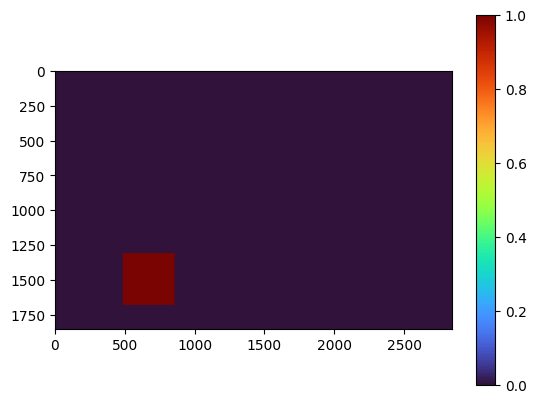

In [28]:
plt.imshow(result_border_map_33==1, cmap='turbo'); plt.colorbar()

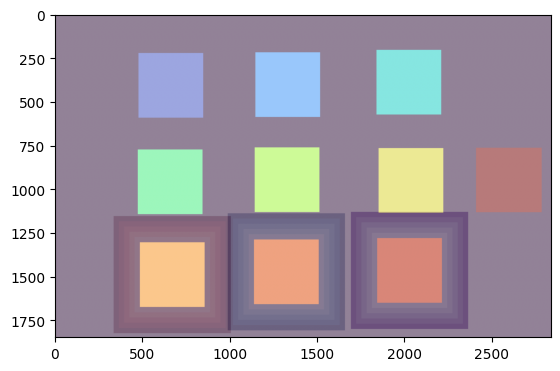

In [29]:
plt.imshow(reordered_labeled_mask, cmap='turbo', alpha=1)
plt.imshow(result_border_map_33, cmap='Reds', alpha=0.2)
plt.imshow(result_border_map_66, cmap='Blues', alpha=0.2)
plt.imshow(result_border_map_99, cmap='Purples', alpha=0.2)




---
# Create Zoom In of Individual ROIs and Difference Image 

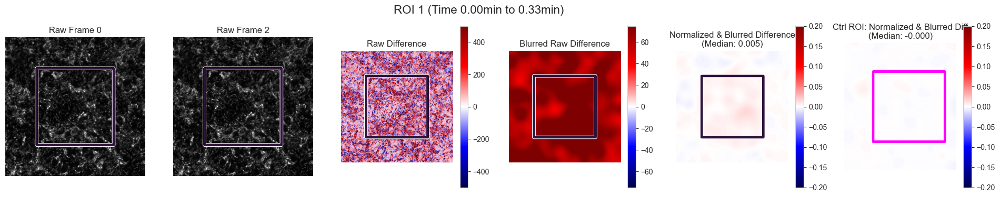

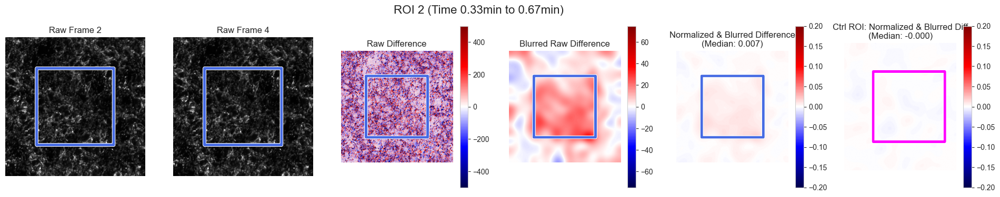

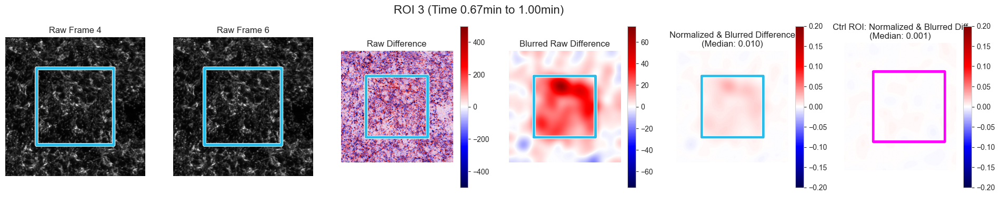

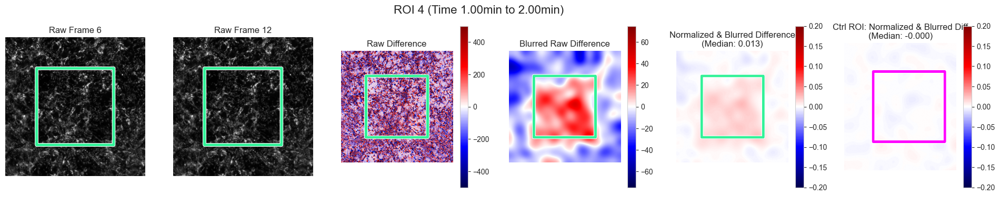

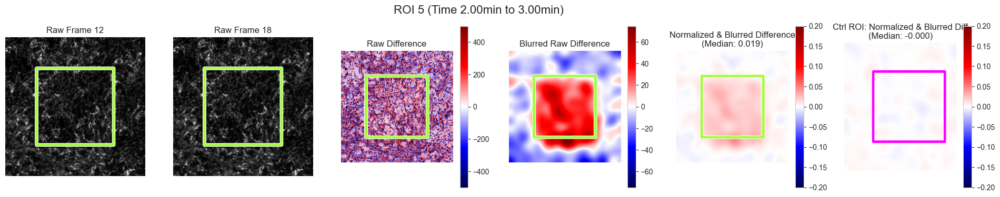

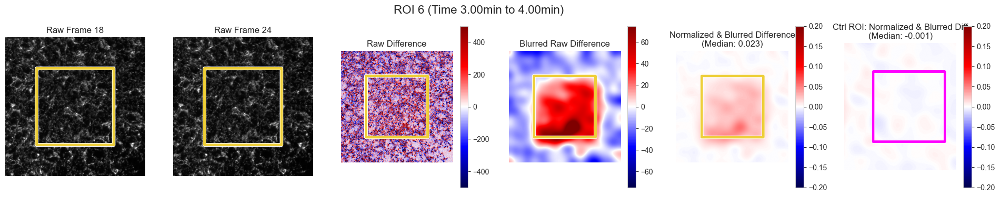

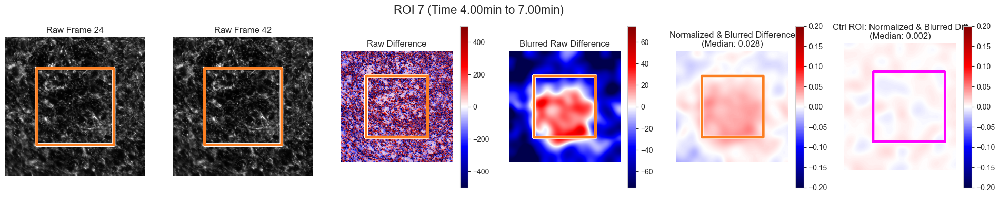

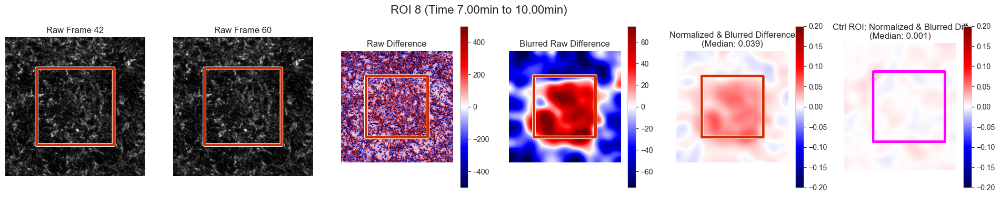

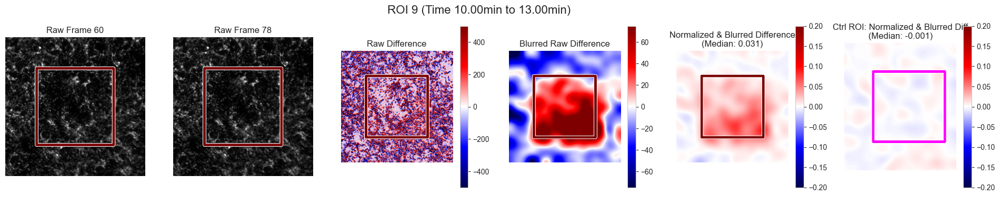

In [ ]:
import nd2
import os
import numpy as np
import matplotlib.pyplot as plt
import tkinter as tk
from tkinter import filedialog, messagebox
from scipy.ndimage import gaussian_filter, binary_dilation
from skimage.segmentation import find_boundaries
import subprocess 

# Set Matplotlib SVG font type for editable text in Inkscape
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['font.family'] = 'sans-serif' # Or choose a specific font like 'Arial' if you prefer

# --- File Selection Function ---
# def select_nd2_file():
#     """Opens a file dialog to select a single ND2 file."""
#     root = tk.Tk()
#     root.withdraw()
#     file_path = filedialog.askopenfilenames(
#         title="Select an ND2 Movie File",
#         filetypes=[("ND2 files", "*.nd2")]
#     )
#     root.destroy()
#     return list(file_path)[0] if file_path else None

def select_nd2_file():
    """Opens a file dialog to select a single ND2 file using subprocess."""
    result = subprocess.run(
        ["python", "file_dialog_helper.py"],  # or full path if needed
        capture_output=True, text=True
    )
    files = [line.strip() for line in result.stdout.splitlines() if line.strip()]
    if not files:
        return None  # user cancelled
    return files[0]  # return only the first selected file

# --- Main Processing Function ---
def process_nd2_file_with_rois(roi_matrix, raw_diff_vabs, raw_diff_multiplier, norm_vabs, outline_alpha, outline_linewidth):
    """Processes an ND2 file with an ROI matrix and manual settings."""
    file_path_nd2 = select_nd2_file()
    if not file_path_nd2:
        messagebox.showinfo("Cancelled", "No ND2 file selected. Operation cancelled.")
        return

    try:
        # Define processing parameters
        imaging_frequency_hz = 0.1
        time_points_seconds = [0, 20, 40, 60, 120, 180, 240, 420, 600, 780]
        gaussian_blur_radius = 30 # =======================================================
        n_pixels_border = 150

        # Calculate the potential frame indices and times in minutes
        potential_frame_indices = [int(t * imaging_frequency_hz) for t in time_points_seconds]
        time_points_minutes = [t / 60 for t in time_points_seconds]

        # Use a colormap for the ROI outlines
        roi_colormap = plt.get_cmap('turbo', 9)

        with nd2.ND2File(file_path_nd2) as nd2_file:
            total_frames = nd2_file.sizes.get('T', 0)

            valid_frame_indices = [idx for idx in potential_frame_indices if idx < total_frames]
            
            if len(valid_frame_indices) < 2:
                messagebox.showerror("Error", "The selected file is too short.")
                return

            if roi_matrix.shape != (nd2_file.sizes['Y'], nd2_file.sizes['X']):
                messagebox.showerror("Error", "ROI matrix dimensions do not match image dimensions.")
                return
            
            # --- Check for the existence of ROI 10 once ---
            is_roi_10_valid = (roi_matrix == 10).any()
            if not is_roi_10_valid:
                print("Warning: ROI 10 not found in the ROI matrix. Skipping ROI 10 plot.")

            # --- Loop through each ROI (from 1 to 9) ---
            for roi_index in range(1, 10):
                if roi_index >= len(valid_frame_indices):
                    break
                
                # Get color for the current ROI from the colormap
                roi_color = roi_colormap((roi_index-1))

                # Create and expand the mask for the current ROI
                mask = (roi_matrix == roi_index)
                expanded_mask = binary_dilation(mask, iterations=n_pixels_border)

                # Find the bounding box of the expanded mask
                rows, cols = np.where(expanded_mask)
                if not rows.any() or not cols.any():
                    print(f"Skipping ROI {roi_index}: no pixels found in this region.")
                    continue

                min_row, max_row = rows.min(), rows.max()
                min_col, max_col = cols.min(), cols.max()

                # Get the corresponding frame pair and times for this ROI
                frame1_index = valid_frame_indices[roi_index - 1]
                frame2_index = valid_frame_indices[roi_index]
                
                time1_min = time_points_minutes[roi_index - 1]
                time2_min = time_points_minutes[roi_index]

                # Lazily load the full frames (These frames will be used for both current ROI and ROI 10)
                frame1 = nd2_file.read_frame(frame1_index)
                frame2 = nd2_file.read_frame(frame2_index)

                if frame1.ndim > 2: frame1 = frame1[0]
                if frame2.ndim > 2: frame2 = frame2[0]

                # --- Perform processing for the current ROI ---
                normalized_frame1 = (frame1.astype(np.float32) - np.mean(frame1)) / np.std(frame1)
                normalized_frame2 = (frame2.astype(np.float32) - np.mean(frame2)) / np.std(frame2)
                blurred_frame1 = gaussian_filter(normalized_frame1, sigma=gaussian_blur_radius)
                blurred_frame2 = gaussian_filter(normalized_frame2, sigma=gaussian_blur_radius)
                cropped_frame1 = frame1[min_row:max_row+1, min_col:max_col+1]
                cropped_frame2 = frame2[min_row:max_row+1, min_col:max_col+1]
                raw_difference = cropped_frame2.astype(np.float32) - cropped_frame1.astype(np.float32)
                blurred_raw_difference = gaussian_filter(raw_difference, sigma=gaussian_blur_radius)
                processed_difference = blurred_frame2[min_row:max_row+1, min_col:max_col+1] - blurred_frame1[min_row:max_row+1, min_col:max_col+1]
                original_mask = (roi_matrix == roi_index)
                outline = find_boundaries(original_mask, mode='inner')
                cropped_outline = outline[min_row:max_row+1, min_col:max_col+1]

                # --- Calculate median of the normalized difference for the current ROI ---
                median_rel_diff_roi = np.median(processed_difference[original_mask[min_row:max_row+1, min_col:max_col+1]])
                
                # --- Perform processing for ROI 10 using the same frames ---
                if is_roi_10_valid:
                    mask_10 = (roi_matrix == 10)
                    expanded_mask_10 = binary_dilation(mask_10, iterations=n_pixels_border)
                    rows_10, cols_10 = np.where(expanded_mask_10)

                    min_row_10, max_row_10 = rows_10.min(), rows_10.max()
                    min_col_10, max_col_10 = cols_10.min(), cols_10.max()
                    
                    processed_difference_10 = blurred_frame2[min_row_10:max_row_10+1, min_col_10:max_col_10+1] - blurred_frame1[min_row_10:max_row_10+1, min_col_10:max_col_10+1]
                    original_outline_10 = find_boundaries(mask_10, mode='inner')
                    cropped_outline_10 = original_outline_10[min_row_10:max_row_10+1, min_col_10:max_col_10+1]
                    
                    # --- Calculate median of the normalized difference for the control ROI ---
                    median_rel_diff_ctrl = np.median(processed_difference_10[mask_10[min_row_10:max_row_10+1, min_col_10:max_col_10+1]])


                # --- Plotting the 6 subplots for the current ROI ---
                fig, axes = plt.subplots(1, 6, figsize=(24, 4))
                fig.suptitle(f'ROI {roi_index} (Time {time1_min:.2f}min to {time2_min:.2f}min)', fontsize=16)

                # Define a slightly thicker white linewidth for the border
                white_border_linewidth = outline_linewidth + 1.5 # Adjust as needed for desired thickness

                # Plot 1: Cropped Raw Frame 1
                ax_raw1 = axes[0]
                ax_raw1.imshow(cropped_frame1, cmap='gray',vmax=np.percentile(cropped_frame1.flatten(),99.95))
                # White border
                ax_raw1.contour(cropped_outline, levels=[0.5], colors=['white'], linestyles='solid', alpha=outline_alpha, linewidths=white_border_linewidth)
                # Colored contour
                ax_raw1.contour(cropped_outline, levels=[0.5], colors=[roi_color], linestyles='solid', alpha=outline_alpha, linewidths=outline_linewidth)
                ax_raw1.set_title(f'Raw Frame {frame1_index}')
                ax_raw1.axis('off')

                # Plot 2: Cropped Raw Frame 2
                ax_raw2 = axes[1]
                ax_raw2.imshow(cropped_frame2, cmap='gray', vmax=np.percentile(cropped_frame2.flatten(),99.95))
                # White border
                ax_raw2.contour(cropped_outline, levels=[0.5], colors=['white'], linestyles='solid', alpha=outline_alpha, linewidths=white_border_linewidth)
                # Colored contour
                ax_raw2.contour(cropped_outline, levels=[0.5], colors=[roi_color], linestyles='solid', alpha=outline_alpha, linewidths=outline_linewidth)
                ax_raw2.set_title(f'Raw Frame {frame2_index}')
                ax_raw2.axis('off')
                
                # Plot 3: Raw Difference
                ax_diff_raw = axes[2]
                im_diff_raw = ax_diff_raw.imshow(raw_difference, cmap='seismic', vmin=-raw_diff_vabs, vmax=raw_diff_vabs)
                # White border
                ax_diff_raw.contour(cropped_outline, levels=[0.5], colors=['white'], linestyles='solid', alpha=outline_alpha, linewidths=white_border_linewidth)
                # Colored contour
                ax_diff_raw.contour(cropped_outline, levels=[0.5], colors=[roi_color], linestyles='solid', alpha=outline_alpha, linewidths=outline_linewidth)
                ax_diff_raw.set_title('Raw Difference')
                ax_diff_raw.axis('off')
                fig.colorbar(im_diff_raw, ax=ax_diff_raw)

                # Plot 4: Blurred Raw Difference
                ax_blurred_raw_diff = axes[3]
                im_blurred_raw_diff = ax_blurred_raw_diff.imshow(blurred_raw_difference, cmap='seismic', vmin=-(raw_diff_vabs * raw_diff_multiplier), vmax=(raw_diff_vabs * raw_diff_multiplier))
                # White border
                ax_blurred_raw_diff.contour(cropped_outline, levels=[0.5], colors=['white'], linestyles='solid', alpha=outline_alpha, linewidths=white_border_linewidth)
                # Colored contour
                ax_blurred_raw_diff.contour(cropped_outline, levels=[0.5], colors=[roi_color], linestyles='solid', alpha=outline_alpha, linewidths=outline_linewidth)
                ax_blurred_raw_diff.set_title('Blurred Raw Difference')
                ax_blurred_raw_diff.axis('off')
                fig.colorbar(im_blurred_raw_diff, ax=ax_blurred_raw_diff)
                
                # Plot 5: Normalized & Blurred Difference
                ax_diff_processed = axes[4]
                im_diff_processed = ax_diff_processed.imshow(processed_difference, cmap='seismic', vmin=-norm_vabs, vmax=norm_vabs)
                # White border
                ax_diff_processed.contour(cropped_outline, levels=[0.5], colors=['white'], linestyles='solid', alpha=outline_alpha, linewidths=white_border_linewidth)
                # Colored contour
                ax_diff_processed.contour(cropped_outline, levels=[0.5], colors=[roi_color], linestyles='solid', alpha=outline_alpha, linewidths=outline_linewidth)
                ax_diff_processed.set_title(f'Normalized & Blurred Difference\n(Median: {median_rel_diff_roi:.3f})')
                ax_diff_processed.axis('off')
                fig.colorbar(im_diff_processed, ax=ax_diff_processed)

                # Plot 6: ROI 10 Normalized & Blurred Difference
                ax_diff_processed_10 = axes[5]
                if is_roi_10_valid:
                    im_diff_processed_10 = ax_diff_processed_10.imshow(processed_difference_10, cmap='seismic', vmin=-norm_vabs, vmax=norm_vabs)
                    # White border for ROI 10
                    ax_diff_processed_10.contour(cropped_outline_10, levels=[0.5], colors=['white'], linestyles='solid', alpha=outline_alpha, linewidths=white_border_linewidth)
                    # Magenta contour for ROI 10
                    ax_diff_processed_10.contour(cropped_outline_10, levels=[0.5], colors=['magenta'], linestyles='solid', alpha=outline_alpha, linewidths=outline_linewidth)
                    ax_diff_processed_10.set_title(f'Ctrl ROI: Normalized & Blurred Diff\n(Median: {median_rel_diff_ctrl:.3f})')
                    fig.colorbar(im_diff_processed_10, ax=ax_diff_processed_10)
                else:
                    ax_diff_processed_10.set_title('Ctrl ROI: N/A')
                    ax_diff_processed_10.text(0.5, 0.5, 'Data Unavailable', ha='center', va='center')
                ax_diff_processed_10.axis('off')
                
                # --- Save the figure as an SVG file ---
                # output_directory = '/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG'
                # os.makedirs(output_directory, exist_ok=True)
                # output_filename = f'Figure1_ZoomIn_ROI_{roi_index}_Difference_plot.svg'
                # full_output_path = os.path.join(output_directory, output_filename)
                # plt.savefig(full_output_path, format='svg')
                # plt.close(fig) # Close the figure to free up memory

    except Exception as e:
        messagebox.showerror("Processing Error", f"An error occurred: {e}")

if __name__ == "__main__":xq
    my_roi_matrix = reordered_labeled_mask # Your actual matrix variable

    # --- Define your desired absolute values, multiplier, and outline properties here ---
    raw_vabs = 500
    raw_diff_multiplier = 0.15
    norm_vabs = 0.2
    outline_alpha = 1
    outline_linewidth = 3

    # Pass all variables to the function
    process_nd2_file_with_rois(my_roi_matrix, raw_diff_vabs=raw_vabs, raw_diff_multiplier=raw_diff_multiplier, norm_vabs=norm_vabs, outline_alpha=outline_alpha, outline_linewidth=outline_linewidth)
    # plt.close('all')

---
# Extract from raw

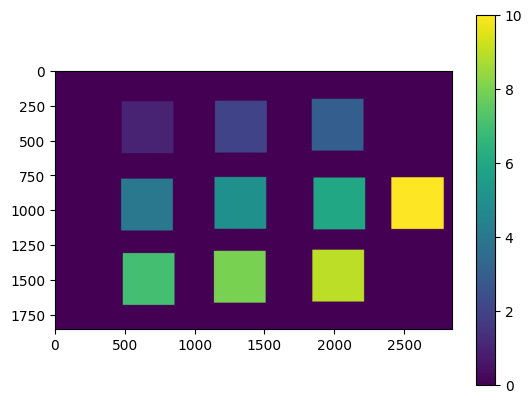

In [6]:
plt.imshow(reordered_labeled_mask)
plt.colorbar()

In [30]:
import tkinter as tk
from tkinter import filedialog, messagebox
import numpy as np
import cv2
import nd2
from scipy.ndimage import label # Keep label if it's used elsewhere for original mask analysis, but not for ROI ordering now
from tqdm.auto import tqdm
import os
import subprocess # Added for select_nd2_file

# --- Helper function for mask preparation (moved and modified) ---
def _prepare_masks_for_processing(mask_matrices_inputs: list, 
                                  first_nd2_file_path: str):
    """
    Pre-processes all input mask matrices by identifying unique ROIs and
    resizing their individual binary masks to match the first ND2 file's dimensions.

    Args:
        mask_matrices_inputs (list): A list of 2D NumPy arrays, each representing a mask.
        first_nd2_file_path (str): Path to the first ND2 file to determine frame dimensions.

    Returns:
        tuple: (nd2_frame_height, nd2_frame_width, list_of_prepared_mask_data)
               where list_of_prepared_mask_data is a list of tuples:
               (original_roi_labels_sorted_for_this_mask, list_of_resized_boolean_masks_for_this_mask).
               Returns (None, None, None) on error.
    """
    if not mask_matrices_inputs:
        messagebox.showerror("Error", "No mask matrices provided for preparation.")
        return None, None, None

    try:
        # Get frame dimensions from the first ND2 file (assuming all ND2s have same frame size)
        with nd2.ND2File(first_nd2_file_path) as f:
            first_frame_data = f.read_frame(0)
            if first_frame_data.ndim == 3:
                nd2_frame_height, nd2_frame_width = first_frame_data.shape[-2], first_frame_data.shape[-1]
            elif first_frame_data.ndim == 2:
                nd2_frame_height, nd2_frame_width = first_frame_data.shape[0], first_frame_data.shape[1]
            else:
                messagebox.showerror("Error", f"Unexpected dimensions for first ND2 frame: {first_frame_data.ndim}. Expected 2 or 3.")
                return None, None, None
        # print(f"Reference ND2 frame dimensions: {nd2_frame_width}x{nd2_frame_height} (WxH).") # Removed print

        list_of_prepared_mask_data = [] # To store (sorted_labels, list_of_resized_boolean_masks) for each input mask

        for idx, mask_array in enumerate(mask_matrices_inputs):
            if not isinstance(mask_array, np.ndarray) or mask_array.ndim != 2:
                # print(f"Warning: Mask {idx+1} is not a valid 2D NumPy array. Skipping.") # Removed print
                continue

            original_roi_labels_sorted = np.unique(mask_array[mask_array > 0])
            if original_roi_labels_sorted.size == 0:
                # print(f"Warning: Mask {idx+1} has no non-zero ROI labels. Skipping.") # Removed print
                continue
            original_roi_labels_sorted.sort() 
            
            resized_roi_boolean_masks_for_this_mask = []
            for roi_label_val in original_roi_labels_sorted:
                individual_roi_mask_orig_size = (mask_array == roi_label_val).astype(np.uint8) * 255
                
                if individual_roi_mask_orig_size.shape[0] != nd2_frame_height or \
                   individual_roi_mask_orig_size.shape[1] != nd2_frame_width:
                    resized_individual_roi_mask_uint8 = cv2.resize(
                        individual_roi_mask_orig_size, 
                        (nd2_frame_width, nd2_frame_height), 
                        interpolation=cv2.INTER_LANCZOS4
                    )
                else:
                    resized_individual_roi_mask_uint8 = individual_roi_mask_orig_size
                
                resized_roi_boolean_masks_for_this_mask.append(resized_individual_roi_mask_uint8 > 0)
            
            list_of_prepared_mask_data.append(
                (original_roi_labels_sorted, resized_roi_boolean_masks_for_this_mask)
            )
            # print(f"Mask {idx+1} prepared with {len(original_roi_labels_sorted)} ROIs.") # Removed print
        
        if not list_of_prepared_mask_data:
            messagebox.showerror("Error", "No valid masks could be prepared from the inputs.")
            return None, None, None

        return nd2_frame_height, nd2_frame_width, list_of_prepared_mask_data

    except Exception as e:
        messagebox.showerror("Error", f"An error occurred during mask preparation: {e}")
        return None, None, None

# --- Helper function to extract intensities from a single frame using multiple masks ---
def _extract_intensities_from_single_frame(current_frame: np.ndarray, 
                                            list_of_prepared_mask_data: list) -> np.ndarray:
    """
    Extracts mean intensities from a single image frame for all ROIs across all prepared masks.

    Args:
        current_frame (np.ndarray): The 2D NumPy array of the current image frame.
        list_of_prepared_mask_data (list): Output from _prepare_masks_for_processing.
                                           Each element is (sorted_labels, list_of_resized_boolean_masks).

    Returns:
        np.ndarray: A 1D NumPy array containing the mean intensities for all ROIs
                    (concatenated from all masks) for the current frame.
    """
    frame_all_rois_intensities = []
    
    for original_roi_labels_sorted, resized_roi_boolean_masks_for_this_mask in list_of_prepared_mask_data:
        for roi_boolean_mask in resized_roi_boolean_masks_for_this_mask:
            intensities = current_frame[roi_boolean_mask]
            if intensities.size > 0:
                frame_all_rois_intensities.append(np.mean(intensities))
            else:
                frame_all_rois_intensities.append(0.0) # Append 0.0 if ROI is empty

    return np.array(frame_all_rois_intensities)

# --- Function to select ND2 files (assuming it's defined elsewhere or handled by GUI) ---
# Placeholder: You should replace this with your actual file selection logic.

# def select_nd2_files():
#     """Opens a file dialog to select multiple ND2 files."""
#     root = tk.Tk()
#     root.withdraw() # Hide the main window
#     file_paths = filedialog.askopenfilenames(
#         title="Select ND2 Movie Files",
#         filetypes=[("ND2 files", "*.nd2")]
#     )
#     root.destroy()
#     return list(file_paths)

def select_nd2_files():
    """
    Opens a file dialog (via subprocess to an external script) 
    to select MULTIPLE ND2 files and returns a list of paths.
    """
    try:
        # Assumes 'file_dialog_helper.py' uses tkinter's askopenfilenames 
        # to select multiple files and prints each path on a new line to stdout.
        result = subprocess.run(
            ["python", "file_dialog_helper.py"],  # or full path if needed
            capture_output=True, 
            text=True,
            check=True # Raise an exception for non-zero exit codes
        )
        
        # Split the output (paths) by newline, strip whitespace, and filter out empty lines
        files = [line.strip() for line in result.stdout.splitlines() if line.strip()]
        
        if not files:
            messagebox.showinfo("Cancelled", "No file(s) selected.")
            return []  # Return an empty list if cancelled
            
        return files  # Return the full list of selected file paths

    except subprocess.CalledProcessError as e:
        messagebox.showerror("File Dialog Error", f"File selection process failed. Error:\n{e.stderr}")
        return []
    except FileNotFoundError:
        messagebox.showerror("Error", "The 'file_dialog_helper.py' script was not found.")
        return []
    except Exception as e:
        messagebox.showerror("Error", f"An unexpected error occurred: {e}")
        return []


# --- Main function: Refactored to process movie by movie, then all masks ---
def main(mask_matrices_inputs: list):
    """
    Main function to run the ND2 processing. It processes all masks for a single movie
    before moving to the next movie.

    Args:
        mask_matrices_inputs (list): A list of 2D NumPy arrays, where each array
                                     represents a mask with labeled ROIs.

    Returns:
        np.ndarray: The final concatenated intensity data matrix of shape
                    (Time, All_ROIs_from_all_masks, ND2_Files), or None if processing fails.
    """
    nd2_files = select_nd2_files()
    
    if not nd2_files:
        messagebox.showerror("Error", "No ND2 files selected. Cannot proceed with processing.")
        return None

    if not mask_matrices_inputs:
        messagebox.showerror("Error", "No mask matrices provided. Please provide at least one mask.")
        return None

    # Step 1: Prepare all masks once based on the first ND2 file's dimensions
    nd2_height, nd2_width, prepared_mask_data_for_all_masks = _prepare_masks_for_processing(
        mask_matrices_inputs, nd2_files[0]
    )

    if prepared_mask_data_for_all_masks is None: # Error during mask preparation
        return None

    all_nd2_final_intensity_data = [] # To store (Time, All_ROIs) matrices for each ND2 file

    # Calculate total number of frames across all selected ND2 files for the single progress bar
    total_frames_to_process = 0
    nd2_file_frame_counts = []
    for nd2_file_path in nd2_files:
        try:
            with nd2.ND2File(nd2_file_path) as f:
                num_timepoints = f.sizes.get('T', 1)
                total_frames_to_process += num_timepoints
                nd2_file_frame_counts.append(num_timepoints)
        except Exception as e:
            messagebox.showerror("Error", f"Could not read frame count for '{os.path.basename(nd2_file_path)}': {e}")
            return None # Stop if we can't even get frame counts

    # Step 2: Loop through each ND2 movie file with a single tqdm progress bar
    frame_counter = 0 # To keep track of frames processed for the overall progress bar
    with tqdm(total=total_frames_to_process, desc="Processing All ND2 Movies") as pbar:
        for i, nd2_file_path in enumerate(nd2_files):
            # print(f"\n--- Processing ND2 File {i+1}/{len(nd2_files)}: {os.path.basename(nd2_file_path)} ---") # Removed
            
            current_movie_all_rois_intensity_rows = [] # Stores rows for this specific movie (Time, All_ROIs)

            try:
                with nd2.ND2File(nd2_file_path) as f:
                    num_timepoints = nd2_file_frame_counts[i] # Use pre-calculated frame count
                    
                    # Loop through all frames of the current movie
                    for frame_idx in range(num_timepoints): # Use normal range, tqdm is handled by outer loop
                        current_frame_raw = f.read_frame(frame_idx) 

                        # Adjust current_frame_raw dimensions to get a 2D (Y, X) frame
                        if current_frame_raw.ndim == 3: 
                            current_frame = current_frame_raw[0, :, :] if current_frame_raw.shape[0] < current_frame_raw.shape[2] else current_frame_raw[:, :, 0]
                        elif current_frame_raw.ndim == 2: 
                            current_frame = current_frame_raw
                        else:
                            messagebox.showerror("Error", f"Unsupported frame dimension for frame {frame_idx} in '{os.path.basename(nd2_file_path)}': {current_frame_raw.ndim}. Expected 2 or 3.")
                            return None 

                        current_frame = current_frame.astype(np.float32) 

                        # Extract intensities for ALL masks from the current frame
                        frame_intensities_across_all_masks = _extract_intensities_from_single_frame(
                            current_frame, prepared_mask_data_for_all_masks
                        )
                        current_movie_all_rois_intensity_rows.append(frame_intensities_across_all_masks)
                        
                        # Update the single tqdm progress bar
                        pbar.update(1)
                    
                    # Convert list of rows to a NumPy array for this movie
                    intensity_matrix_current_nd2 = np.array(current_movie_all_rois_intensity_rows)
                    all_nd2_final_intensity_data.append(intensity_matrix_current_nd2)

            except Exception as e:
                messagebox.showerror("Error", f"An error occurred while processing ND2 file '{os.path.basename(nd2_file_path)}': {e}")
                return None 

    if not all_nd2_final_intensity_data:
        messagebox.showerror("Error", "No intensity data could be extracted from any ND2 file.")
        return None

    # Step 3: Stack all (Time, All_ROIs) matrices along a new (3rd) dimension
    # The result will be (Time, All_ROIs, ND2_Files)
    final_result_matrix = np.stack(all_nd2_final_intensity_data, axis=2)
    # print(f"\nFinal combined intensity data shape: {final_result_matrix.shape} (Time, All_ROIs, ND2_Files)") # Removed
    
    return final_result_matrix

In [31]:
rawROI_intensity_data_Brep1 = main( [reordered_labeled_mask, result_border_map_33, result_border_map_66, result_border_map_99]) #rep2
rawROI_intensity_data_Brep2 = main( [reordered_labeled_mask, result_border_map_33, result_border_map_66, result_border_map_99]) #rep3
rawROI_intensity_data_Brep3 = main( [reordered_labeled_mask, result_border_map_33, result_border_map_66, result_border_map_99]) #rep4

Processing All ND2 Movies:   0%|          | 0/630 [00:00<?, ?it/s]

Processing All ND2 Movies:   0%|          | 0/810 [00:00<?, ?it/s]

Processing All ND2 Movies:   0%|          | 0/90 [00:00<?, ?it/s]

In [33]:
np.shape(rawROI_intensity_data_Brep1)

(90, 28, 7)

In [34]:
# Define function to normalize raw data (via subtracting first frame from each ROI, then subtracting dynamic background from background ROI, then normalize per replicate at specific frame)
import numpy as np

def normalize_roi_data(raw_data, background_roi_index=9, norm_frame=78):
    """
    Normalize raw ROI intensity data.

    Parameters:
    -----------
    raw_data : np.ndarray
        3D array of shape (time, rois, replicates)
    background_roi_index : int
        Index of the ROI to use as dynamic background (default: 9 → ROI 10)
    norm_frame : int
        Frame index to use for final normalization (default: 78)

    Returns:
    --------
    norm_data : np.ndarray
        Normalized data array of same shape as input
    """
    # Step 1: Normalize each ROI by its own first frame
    step1 = raw_data / raw_data[0, :, :]  # shape: [T, R, N]

    # Step 2: Subtract dynamic background
    background = step1[:, background_roi_index, :][:, np.newaxis, :]  # shape: [T, 1, N]
    step2 = step1 - background

    # Step 3: Normalize per replicate so that max across ROIs at norm_frame == 1
    max_vals = np.max(step2[norm_frame, :, :], axis=0)  # shape: [N]
    max_vals[max_vals == 0] = 1  # prevent divide-by-zero
    norm_data = step2 / max_vals[np.newaxis, np.newaxis, :]

    return norm_data

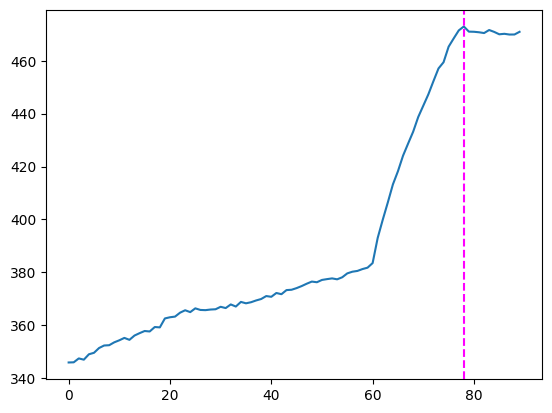

In [35]:
# Normalize Data 

frame_to_norm1_to = 78

normROI_intensity_data_Brep1 = normalize_roi_data(rawROI_intensity_data_Brep1, background_roi_index=9, norm_frame=frame_to_norm1_to)
normROI_intensity_data_Brep2 = normalize_roi_data(rawROI_intensity_data_Brep2, background_roi_index=9, norm_frame=frame_to_norm1_to)
normROI_intensity_data_Brep3 = normalize_roi_data(rawROI_intensity_data_Brep3, background_roi_index=9, norm_frame=frame_to_norm1_to)

# Plot of the chosen frame to normalize
plt.plot(rawROI_intensity_data_Brep1[:,8,1])
plt.axvline(x=frame_to_norm1_to, color='magenta', linestyle='--', linewidth=1.5, label='Event 1')



Generating plots for ROIs 1-9...


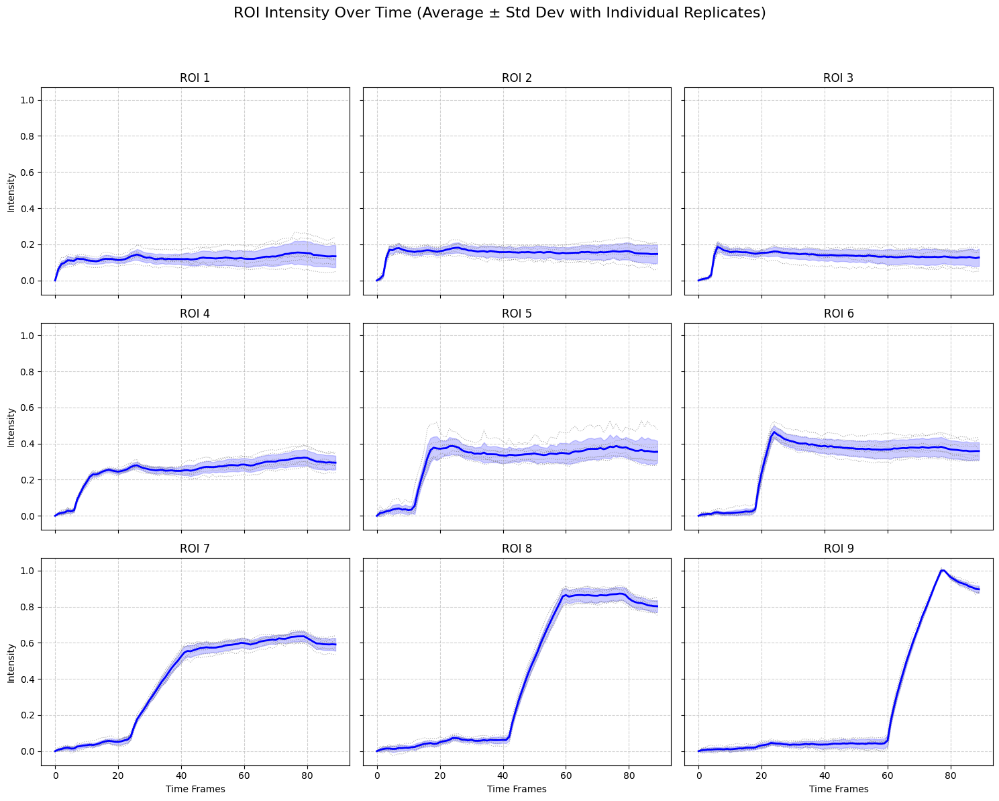


Plotting complete.


In [36]:
# Intensity over time for 9 main ROIs

import numpy as np
import matplotlib.pyplot as plt

# Assume rawROI_intensity_data_Brep1 is already defined as (90, 28, 7)
# For demonstration purposes, let's create a dummy array matching the description
# (Time frames, ROIs, Technical replicates)


data = normROI_intensity_data_Brep1[:,:,[0,1,2,3,4,5,6]]
# data = normROI_intensity_data_Brep2[:,:,[4,5,7]]
# data = normROI_intensity_data_Brep3[:,:,[0, 4, 5, 6, 7]]

num_time_frames = np.shape (data)[0]
num_total_rois = np.shape (data)[1]
num_tech_replicates = np.shape (data)[2]

# Define the ROIs to plot (1-9 correspond to indices 0-8)
rois_to_plot_indices = range(0, 9) 
num_plots = len(rois_to_plot_indices)

# Set up the 3x3 figure and subplots
fig, axes = plt.subplots(3, 3, figsize=(15, 12), sharex=True, sharey=True) # Share axes for consistent scaling
axes = axes.flatten() # Flatten the 3x3 array of axes for easy iteration

print("\nGenerating plots for ROIs 1-9...")
for i, roi_index in enumerate(rois_to_plot_indices):
    ax = axes[i] # Get the current subplot axis
    
    # Extract data for the current ROI across all technical replicates
    roi_data = data[:, roi_index, :] # Shape: (time_frames, tech_replicates)

    # Calculate mean and standard deviation across technical replicates
    mean_intensity = np.mean(roi_data, axis=1) # Mean over replicates for each time point
    std_intensity = np.std(roi_data, axis=1)   # Standard deviation over replicates for each time point

    # Plot individual technical replicates in dotted gray
    for rep_idx in range(num_tech_replicates):
        ax.plot(roi_data[:, rep_idx], color='gray', linestyle=':', linewidth=0.8, alpha=0.7, label=f'Replicate {rep_idx+1}' if i == 0 and rep_idx == 0 else "") # Label once

    # Plot the average intensity
    ax.plot(mean_intensity, color='blue', linewidth=2, label='Average')

    # Plot the shaded error (standard deviation)
    ax.fill_between(range(num_time_frames), 
                    mean_intensity - std_intensity, 
                    mean_intensity + std_intensity, 
                    color='blue', alpha=0.2, label='Std Dev' if i == 0 else "") # Label once


    # Set title for the subplot
    ax.set_title(f"ROI {roi_index + 1}", fontsize=12)

    # Set labels for axes (only on bottom and left plots to avoid clutter)
    if i % 3 == 0: # Left-most column
        ax.set_ylabel("Intensity", fontsize=10)
    if i >= 6: # Bottom row
        ax.set_xlabel("Time Frames", fontsize=10)
        
    ax.grid(True, linestyle='--', alpha=0.6)
    # ax.set_ylim(y_min * 0.95, y_max * 1.05) # Optional: set consistent Y-limits manually


# Add a super title for the entire figure
fig.suptitle("ROI Intensity Over Time (Average ± Std Dev with Individual Replicates)", fontsize=16, y=1.02)

# Adjust layout to prevent overlapping titles/labels
plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust rect to make space for suptitle

plt.show()
print("\nPlotting complete.")

In [37]:
# Store Average of Biological Replicates in List

# indeces chosen are those for good technical replicates
avgROI_intensity_data_Brep1 = np.mean (normROI_intensity_data_Brep1[:,:,[0,1,2,3,4,5,6]], axis=2)
avgROI_intensity_data_Brep2 = np.mean (normROI_intensity_data_Brep2[:,:,[4,5,7]], axis=2)
avgROI_intensity_data_Brep3 = np.mean (normROI_intensity_data_Brep3[:,:,[0, 4, 5, 6, 7]], axis=2)

biological_replicates_list = [
    avgROI_intensity_data_Brep1,
    avgROI_intensity_data_Brep2,
    avgROI_intensity_data_Brep3
]



---
# Save or Load Data

In [ ]:
# Define function to save or load data 
import pickle
import numpy as np
import tkinter as tk
from tkinter import filedialog, messagebox
import os

def save_or_load_biological_replicates_list(data_to_save=None):
    """
    Presents options to the user to either save a list of biological replicates
    to a pickle file or load it from a pickle file.

    Args:
        data_to_save (list): The list of NumPy arrays (biological_replicates_list)
                             to be saved. If loading, this can be None.

    Returns:
        list or None: The loaded list of biological replicates if loading successful,
                      otherwise returns None.
    """
    root = tk.Tk()
    root.withdraw() # Hide the main window

    # Ask the user whether they want to save or load
    choice = messagebox.askyesno(
        "Save or Load Data",
        "Do you want to SAVE the biological replicates list to a file?\n"
        "(Click 'No' to LOAD from a file, 'Cancel' to exit)"
    )

    if choice is True: # User chose to SAVE
        if data_to_save is None:
            messagebox.showinfo("Information", "No data provided to save. Exiting save operation.")
            root.destroy()
            return None

        file_path = filedialog.asksaveasfilename(
            defaultextension=".pkl",
            filetypes=[("Pickle files", "*.pkl"), ("All files", "*.*")],
            title="Save Biological Replicates List As..."
        )
        
        if not file_path:
            messagebox.showinfo("Information", "Save operation cancelled.")
            root.destroy()
            return None

        try:
            with open(file_path, 'wb') as f:
                pickle.dump(data_to_save, f)
            messagebox.showinfo("Success", f"Data successfully saved to:\n{file_path}")
        except Exception as e:
            messagebox.showerror("Error", f"Failed to save data to {file_path}:\n{e}")
        finally:
            root.destroy()
            return None # Return None as we just saved, not loaded
            
    elif choice is False: # User chose to LOAD
        file_path = filedialog.askopenfilename(
            defaultextension=".pkl",
            filetypes=[("Pickle files", "*.pkl"), ("All files", "*.*")],
            title="Load Biological Replicates List From..."
        )

        if not file_path:
            messagebox.showinfo("Information", "Load operation cancelled.")
            root.destroy()
            return None

        if not os.path.exists(file_path):
            messagebox.showerror("Error", f"File not found:\n{file_path}")
            root.destroy()
            return None

        try:
            with open(file_path, 'rb') as f:
                loaded_data = pickle.load(f)
            messagebox.showinfo("Success", f"Data successfully loaded from:\n{file_path}")
            root.destroy()
            return loaded_data # Return the loaded data
        except Exception as e:
            messagebox.showerror("Error", f"Failed to load data from {file_path}:\n{e}")
            root.destroy()
            return None
    else: # User clicked Cancel
        messagebox.showinfo("Information", "Operation cancelled by user.")
        root.destroy()
        return None



In [ ]:
# Save data
# Scenario 1: You have data and want to SAVE it.

# Call the function, passing your biological_replicates_list
print("\nAttempting to save simulated data...")
save_or_load_biological_replicates_list(data_to_save=biological_replicates_list)



In [54]:
# Load data

# Scenario 2: You want to LOAD data (e.g., in a new script or later session)
    # Call the function without 'data_to_save' argument.
print("\nAttempting to load data...")
biological_replicates_list = save_or_load_biological_replicates_list()

if biological_replicates_list is not None:
    print("\nSuccessfully loaded data!")
    print(f"Type of loaded data: {type(biological_replicates_list)}")
    print(f"Number of items in loaded list: {len(biological_replicates_list)}")
    if isinstance(biological_replicates_list, list) and len(biological_replicates_list) > 0 and isinstance(biological_replicates_list[0], np.ndarray):
        print(f"Shape of first loaded array: {biological_replicates_list[0].shape}")
        # You can now use loaded_data, e.g., for further analysis
        # first_replicate = loaded_data[0]
        # print("First 5x5 block of the first loaded replicate:\n", first_replicate[:5, :5])
else:
    print("\nNo data was loaded or an error occurred.")


Attempting to load data...

Successfully loaded data!
Type of loaded data: <class 'list'>
Number of items in loaded list: 3
Shape of first loaded array: (90, 28)


In [124]:
np.shape(biological_replicates_list)

(3, 90, 28)

---
# Intesity over Time for Biolocial Replicates


Shape of stacked data for plotting: (90, 28, 3)

Generating plots for ROIs 1-9 (Grand Average ± Std Dev Across Biological Replicates)...


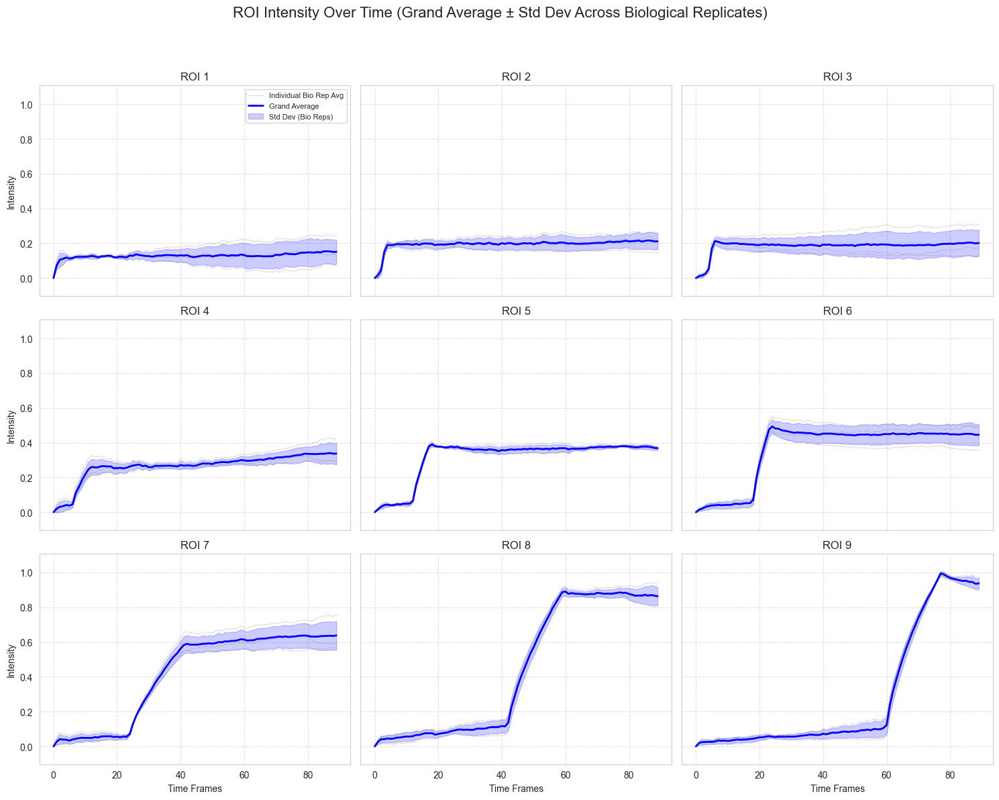


Plotting code executed. Check the generated figure.


In [55]:
# 9ROI plots Across biological replicates

import matplotlib.pyplot as plt
num_time_frames = np.shape(biological_replicates_list)[1]


# --- PLOTTING LOGIC STARTS HERE ---

# First, stack the biological_replicates_list to create a 3D array
# with shape (Time frames, ROIs, Biological Replicates)
# This is necessary for consistent calculation of grand mean and std dev across replicates.
all_biological_replicates_avg_data = np.stack(biological_replicates_list, axis=2)

print(f"\nShape of stacked data for plotting: {all_biological_replicates_avg_data.shape}")

# Define the ROIs to plot (1-9 correspond to Python indices 0-8)
rois_to_plot_indices = range(0, 9)

# Set up the 3x3 figure and subplots
fig, axes = plt.subplots(3, 3, figsize=(15, 12), sharex=True, sharey=True)
axes = axes.flatten() # Flatten the 3x3 array of axes for easy iteration

print("\nGenerating plots for ROIs 1-9 (Grand Average ± Std Dev Across Biological Replicates)...")

# Determine global Y-axis limits based on all data being plotted for consistent scaling
y_min_global = np.min(all_biological_replicates_avg_data[:, rois_to_plot_indices, :])
y_max_global = np.max(all_biological_replicates_avg_data[:, rois_to_plot_indices, :])
y_range_buffer = (y_max_global - y_min_global) * 0.1
y_lower_limit = y_min_global - y_range_buffer
y_upper_limit = y_max_global + y_range_buffer


for i, roi_index in enumerate(rois_to_plot_indices):
    ax = axes[i] # Get the current subplot axis
    
    # Extract data for the current ROI across all biological replicates
    # Shape: (num_time_frames, num_biological_replicates)
    roi_biological_reps_data = all_biological_replicates_avg_data[:, roi_index, :] 

    # Calculate the 'grand' mean intensity across biological replicates for each time point
    grand_mean_intensity = np.mean(roi_biological_reps_data, axis=1) 
    
    # Calculate the standard deviation across biological replicates for each time point
    std_of_biological_reps = np.std(roi_biological_reps_data, axis=1)   

    # Plot individual biological replicate average lines in dotted gray
    for bio_rep_idx in range(all_biological_replicates_avg_data.shape[2]): # Use actual count of bio reps
        ax.plot(roi_biological_reps_data[:, bio_rep_idx], 
                color='gray', linestyle=':', linewidth=0.8, alpha=0.7, 
                label='Individual Bio Rep Avg' if i == 0 and bio_rep_idx == 0 else "")

    # Plot the 'grand' average intensity (average of the biological replicates)
    ax.plot(grand_mean_intensity, color='blue', linewidth=2, label='Grand Average' if i == 0 else "")

    # Plot the shaded error (standard deviation across biological replicates)
    ax.fill_between(range(num_time_frames), 
                    grand_mean_intensity - std_of_biological_reps, 
                    grand_mean_intensity + std_of_biological_reps, 
                    color='blue', alpha=0.2, 
                    label='Std Dev (Bio Reps)' if i == 0 else "")

    # Set subplot title (ROI number is 1-based for display)
    ax.set_title(f"ROI {roi_index + 1}", fontsize=12)

    # Set common Y-axis limits for all plots for consistency
    ax.set_ylim(y_lower_limit, y_upper_limit)

    # Add axis labels, but only to the bottom row for X-axis and left-most column for Y-axis
    if i % 3 == 0: # Left-most column
        ax.set_ylabel("Intensity", fontsize=10)
    if i >= 6: # Bottom row (indices 6, 7, 8)
        ax.set_xlabel("Time Frames", fontsize=10)
        
    ax.grid(True, linestyle='--', alpha=0.6) # Add a subtle grid

# Add a single legend to the first plot
if all_biological_replicates_avg_data.shape[2] > 0:
    axes[0].legend(loc='upper right', fontsize=8)


# Add a super title for the entire figure
fig.suptitle("ROI Intensity Over Time (Grand Average ± Std Dev Across Biological Replicates)", fontsize=16, y=1.02)

# Adjust layout to prevent overlapping titles/labels, leaving space for the suptitle
plt.tight_layout(rect=[0, 0.03, 1, 0.98])

# Display the plot
plt.show()

print("\nPlotting code executed. Check the generated figure.")

Time axis created. Range: 0.00 to 14.83 minutes.

Shape of stacked data for analysis: (90, 28, 3)

Plotting selected ROIs ([1, 2, 3, 4, 5, 6, 7, 8, 9]) on a single plot...


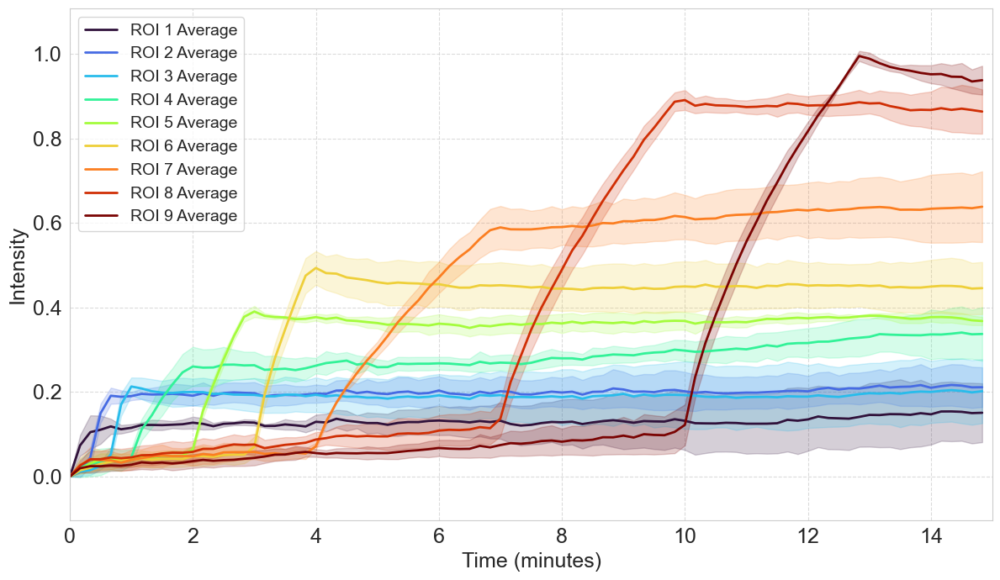


Plotting code executed. Check the generated figure with time in minutes.


In [90]:
# Plot all Biological Replicates on single graph

# --- Define Frame Rate and Calculate Time Axis ---
frame_interval_seconds = 10 # 1 frame every 10 seconds
seconds_per_minute = 60
time_per_frame_minutes = frame_interval_seconds / seconds_per_minute # 10/60 = 1/6 minutes per frame

# Create the x-axis representing time in minutes
time_in_minutes = np.arange(num_time_frames) * time_per_frame_minutes

print(f"Time axis created. Range: {time_in_minutes[0]:.2f} to {time_in_minutes[-1]:.2f} minutes.")


# --- PLOTTING LOGIC STARTS HERE ---

# Step 1: Stack the list of 2D arrays into a single 3D array
# This converts [(Time, ROIs), (Time, ROIs), ...] to (Time, ROIs, Biological_Replicates)
all_biological_replicates_avg_data = np.stack(biological_replicates_list, axis=2)

print(f"\nShape of stacked data for analysis: {all_biological_replicates_avg_data.shape}")

# Define the ROIs you want to plot on the SAME SINGLE PLOT.
# These are 0-based indices. For ROIs 1, 5, and 10, you'd use [0, 4, 9].
selected_rois_to_plot_indices = [0, 1, 2, 3,4,5,6,7,8] # Example: Plot ROI 1, 2, 3, and 4
# Change this list to any ROIs you want to visualize


# Create a list of distinct colors for each selected ROI
colors = plt.cm.turbo(np.linspace(0, 1, len(selected_rois_to_plot_indices)))


# Create a single figure and a single subplot (axis)
fig, ax = plt.subplots(figsize=(12, 7))

print(f"\nPlotting selected ROIs ({[idx + 1 for idx in selected_rois_to_plot_indices]}) on a single plot...")

# Determine global Y-axis limits based on all data being plotted for consistency
y_min_global = np.min(all_biological_replicates_avg_data[:, selected_rois_to_plot_indices, :])
y_max_global = np.max(all_biological_replicates_avg_data[:, selected_rois_to_plot_indices, :])
y_range_buffer = (y_max_global - y_min_global) * 0.1
ax.set_ylim(y_min_global - y_range_buffer, y_max_global + y_range_buffer)


# Loop through each selected ROI to plot its grand average and error
for i, roi_index in enumerate(selected_rois_to_plot_indices):
    color = colors[i] # Get a unique color for this ROI
    
    # Extract data for the current ROI across all biological replicates
    # Shape: (num_time_frames, num_biological_replicates)
    roi_biological_reps_data = all_biological_replicates_avg_data[:, roi_index, :] 

    # Calculate the 'grand' mean intensity across biological replicates for each time point
    grand_mean_intensity = np.mean(roi_biological_reps_data, axis=1) 
    
    # Calculate the standard deviation across biological replicates for each time point
    std_of_biological_reps = np.std(roi_biological_reps_data, axis=1)   

    # Plot the 'grand' average intensity as a solid line
    # IMPORTANT: Use 'time_in_minutes' for the x-axis
    ax.plot(time_in_minutes, grand_mean_intensity, color=color, linewidth=2, label=f'ROI {roi_index + 1} Average')

    # Plot the shaded error (standard deviation across biological replicates)
    # IMPORTANT: Use 'time_in_minutes' for the x-axis
    ax.fill_between(time_in_minutes, 
                    grand_mean_intensity - std_of_biological_reps, 
                    grand_mean_intensity + std_of_biological_reps, 
                    color=color, alpha=0.2,)# label=f'ROI {roi_index + 1} Std Dev')

    # --- Optional: Plot individual biological replicate averages in dotted lines ---
    # Be cautious with this if plotting many ROIs, as it can make the plot very cluttered.
    # Uncomment the following block if you want to see individual biological replicate traces.
    """
    for bio_rep_idx in range(all_biological_replicates_avg_data.shape[2]):
        ax.plot(time_in_minutes, roi_biological_reps_data[:, bio_rep_idx],
                color=color, linestyle=':', linewidth=0.8, alpha=0.4) # Slightly transparent dotted
    """


# Set labels and title for the single plot
# IMPORTANT: Updated x-axis label
ax.set_xlabel("Time (minutes)", fontsize=18)
ax.set_ylabel("Intensity", fontsize=18)
# ax.set_title("Average Intensity Over Time for Selected ROIs (Across Biological Replicates)", fontsize=14)

ax.grid(True, linestyle='--', alpha=0.7) # Add a subtle grid
ax.legend(loc='best', fontsize=14) # Add a legend to distinguish ROIs
ax.tick_params(axis='both', which='major', labelsize=18)



# ax.axvline(x=1/3, color='magenta', linestyle='--', linewidth=1.5, label='Event 1')
# ax.axvline(x=2/3, color='magenta', linestyle='--', linewidth=1.5, label='Event 1')
# ax.axvline(x=1, color='magenta', linestyle='--', linewidth=1.5, label='Event 1')


# ax.axvline(x=2, color='magenta', linestyle='--', linewidth=1.5, label='Event 1')
# ax.axvline(x=3, color='magenta', linestyle='--', linewidth=1.5, label='Event 1')
# ax.axvline(x=4, color='magenta', linestyle='--', linewidth=1.5, label='Event 1')

# ax.axvline(x=7, color='magenta', linestyle='--', linewidth=1.5, label='Event 1')
# ax.axvline(x=10, color='magenta', linestyle='--', linewidth=1.5, label='Event 1')
# ax.axvline(x=13, color='magenta', linestyle='--', linewidth=1.5, label='Event 1')


# Adjust layout to ensure everything fits
plt.tight_layout()
plt.xlim(0,15)
# save as SVG
plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/Figure1B.svg", format="svg")

# Display the plot
plt.show()

print("\nPlotting code executed. Check the generated figure with time in minutes.")




Calculated changes for 27 total data points (9 ROIs * 3 reps).
Generating dot plot...


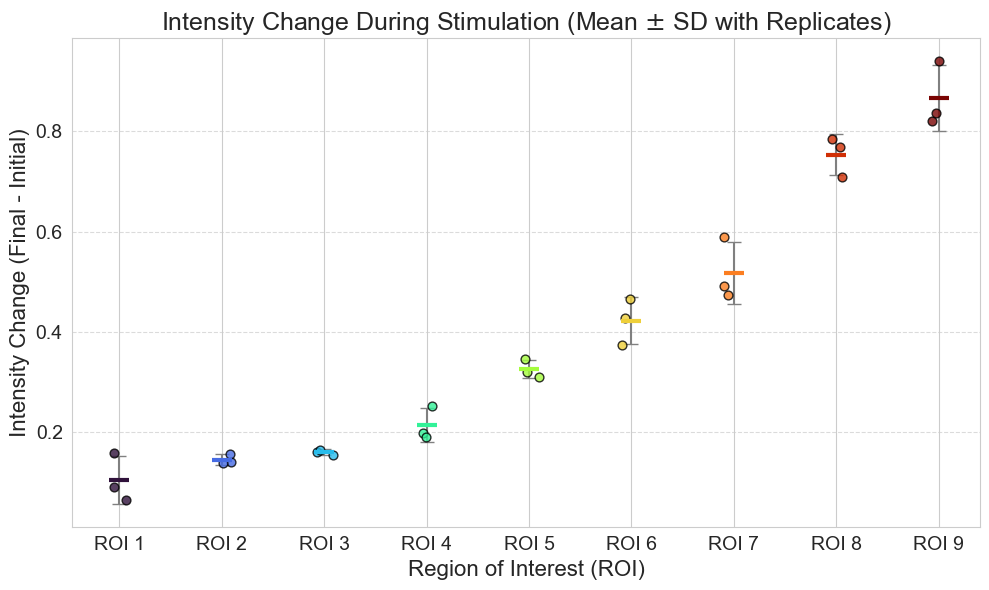


Intensity Change Dot Plot generated successfully.


In [ ]:
# Plot Change in Intensity (End - Start) for each ROI as Dot Plot with SD Error Bars

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import colormaps

# --- REQUIRED ASSUMPTIONS ---
# The following variables must be defined from the preceding code block's scope:
# - all_biological_replicates_avg_data (Time x ROIs x Replicates: e.g., 90 x 9 x 3)
# - frame_interval_seconds (e.g., 10)
# - selected_rois_to_plot_indices (e.g., [0, 1, ..., 8])
# - colors (the turbo colormap list for the ROIs)
num_time_frames = all_biological_replicates_avg_data.shape[0] if 'all_biological_replicates_avg_data' in locals() else 90 
num_biological_replicates = all_biological_replicates_avg_data.shape[2] if 'all_biological_replicates_avg_data' in locals() else 3


# --- 1. Define Stimulation Timings (in seconds) ---
# NOTE: The stimulation times are based on the full movie timeline, not just the stim duration.
# Frame interval is 10s.
# Times in seconds: 1min=60s, 2min=120s, 3min=180s, 4min=240s, 7min=420s, 10min=600s

stim_timings = {
    # ROI Index: (Stim Start Time (s), Total Stim Duration (s))
    0: (0, 20),
    1: (20, 20),
    2: (40, 20),
    3: (60, 60),    # 1min start, 1min duration -> End at 120s
    4: (120, 60),   # 2min start, 1min duration -> End at 180s
    5: (180, 60),   # 3min start, 1min duration -> End at 240s
    6: (240, 180),  # 4min start, 3min duration -> End at 420s
    7: (420, 180),  # 7min start, 3min duration -> End at 600s
    8: (600, 180)   # 10min start, 3min duration -> End at 780s
}

# --- 2. Calculate Intensity Change (End - Start) ---

# DataFrame to hold all results for easy plotting
results_list = []

for roi_index in selected_rois_to_plot_indices:
    
    start_time, stim_duration = stim_timings[roi_index]
    
    # Calculate end time and convert times to frame indices
    end_time = start_time + stim_duration
    start_frame = int(np.round(start_time / frame_interval_seconds))
    end_frame = int(np.round(end_time / frame_interval_seconds))
    
    # Ensure end frame does not exceed data length
    if end_frame >= num_time_frames:
        end_frame = num_time_frames - 1
        print(f"[Warning] ROI {roi_index + 1}: End frame adjusted to {end_frame} (max frame).")

    # Extract start and end intensities for all biological replicates
    # Shape: (num_biological_replicates,)
    initial_intensities = all_biological_replicates_avg_data[start_frame, roi_index, :]
    final_intensities = all_biological_replicates_avg_data[end_frame, roi_index, :]
    
    # Calculate the change for each replicate
    changes_replicates = final_intensities - initial_intensities
    
    # Calculate mean and standard deviation (SD)
    mean_change = np.mean(changes_replicates)
    # Using ddof=1 for sample standard deviation
    sd_change = np.std(changes_replicates, ddof=1)
    
    # Store results
    for rep_idx, change in enumerate(changes_replicates):
        results_list.append({
            'ROI_Index': roi_index,
            'ROI_Label': f'ROI {roi_index + 1}',
            'Replicate_Change': change,
            'Mean_Change': mean_change,
            'SD_Change': sd_change,
            'Color': colors[roi_index]
        })

df_changes = pd.DataFrame(results_list)
print(f"\nCalculated changes for {len(df_changes)} total data points (9 ROIs * {num_biological_replicates} reps).")


# --- 3. Plotting: Dot Plot with SD Error Bars ---

fig_dot, ax_dot = plt.subplots(figsize=(10, 6))

# Define the x-axis positions for the ROIs
x_pos = np.arange(len(selected_rois_to_plot_indices))

print("Generating dot plot...")

# Loop through each ROI to plot the mean, error bar, and individual replicates
for i, roi_index in enumerate(selected_rois_to_plot_indices):
    
    roi_label = f'ROI {roi_index + 1}'
    roi_data = df_changes[df_changes['ROI_Index'] == roi_index]
    color = colors[i]
    
    # A. Plot the Mean Change (Horizontal Line)
    # Use a slightly larger, different marker for the mean
    mean_change = roi_data['Mean_Change'].iloc[0]
    sd_change = roi_data['SD_Change'].iloc[0]
    
    ax_dot.scatter(x_pos[i], mean_change,
                   s=200, marker='_', linewidths=3, 
                   color=color, zorder=5, 
                   label=f'{roi_label} Mean')
    
    # B. Plot the SD Error Bar (Standard Deviation)
    ax_dot.errorbar(x_pos[i], mean_change, 
                    yerr=sd_change, # Error is +/- SD
                    fmt='none', capsize=5, 
                    color='gray', zorder=2, # Use a neutral color for the error bar
                    linewidth=1.5)

    # C. Plot Individual Replicate Points (Scatter)
    # Add a small random jitter (spread) to the x-position for visibility
    jitter = np.random.uniform(-0.1, 0.1, num_biological_replicates)
    
    ax_dot.scatter(x_pos[i] + jitter, roi_data['Replicate_Change'],
                   s=40, marker='o', 
                   facecolors=color, 
                   edgecolors='black', 
                   linewidths=1,
                   alpha=0.8, zorder=4, label=None)

# Set labels and title
ax_dot.set_xticks(x_pos)
ax_dot.set_xticklabels([f'ROI {i+1}' for i in selected_rois_to_plot_indices], fontsize=14)
ax_dot.set_xlabel("Region of Interest (ROI)", fontsize=16)
ax_dot.set_ylabel("Intensity Change (Stim Final - Initial)", fontsize=16) 
ax_dot.set_title("Intensity Change During Stimulation (Mean $\\pm$ SD with Replicates)", fontsize=18)
ax_dot.grid(axis='y', linestyle='--', alpha=0.7) # Only show horizontal grid lines
ax_dot.tick_params(axis='both', which='major', labelsize=14)

plt.tight_layout()
plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/ROI_IntensityChange_During_Stim.svg", format="svg")
plt.show()

print("\nIntensity Change Dot Plot generated successfully.")

--- One-Way ANOVA Test (Effect of ROI on Intensity Change) ---
                 sum_sq          df            F     PR(>F)
C(ROI_Label) 1.81364378  8.00000000 129.08523333 0.00000000
Residual     0.03161243 18.00000000          NaN        NaN

ANOVA P-value: 0.0000
**ANOVA is Significant (P < 0.05). Proceeding with Tukey's HSD.**

--- Tukey's HSD Post-Hoc Test ---
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
 ROI 1  ROI 2   0.0409 0.9472  -0.079 0.1608  False
 ROI 1  ROI 3   0.0556 0.7803 -0.0643 0.1755  False
 ROI 1  ROI 4   0.1093 0.0905 -0.0106 0.2292  False
 ROI 1  ROI 5   0.2208 0.0001   0.101 0.3407   True
 ROI 1  ROI 6   0.3178    0.0  0.1979 0.4377   True
 ROI 1  ROI 7   0.4128    0.0  0.2929 0.5327   True
 ROI 1  ROI 8   0.6485    0.0  0.5286 0.7683   True
 ROI 1  ROI 9   0.7611    0.0  0.6412 0.8809   True
 ROI 2  ROI 3   0.0147 0.9999 -0.1052 0.1345  False
 ROI 2  R

/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/2092500263.py:135: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)


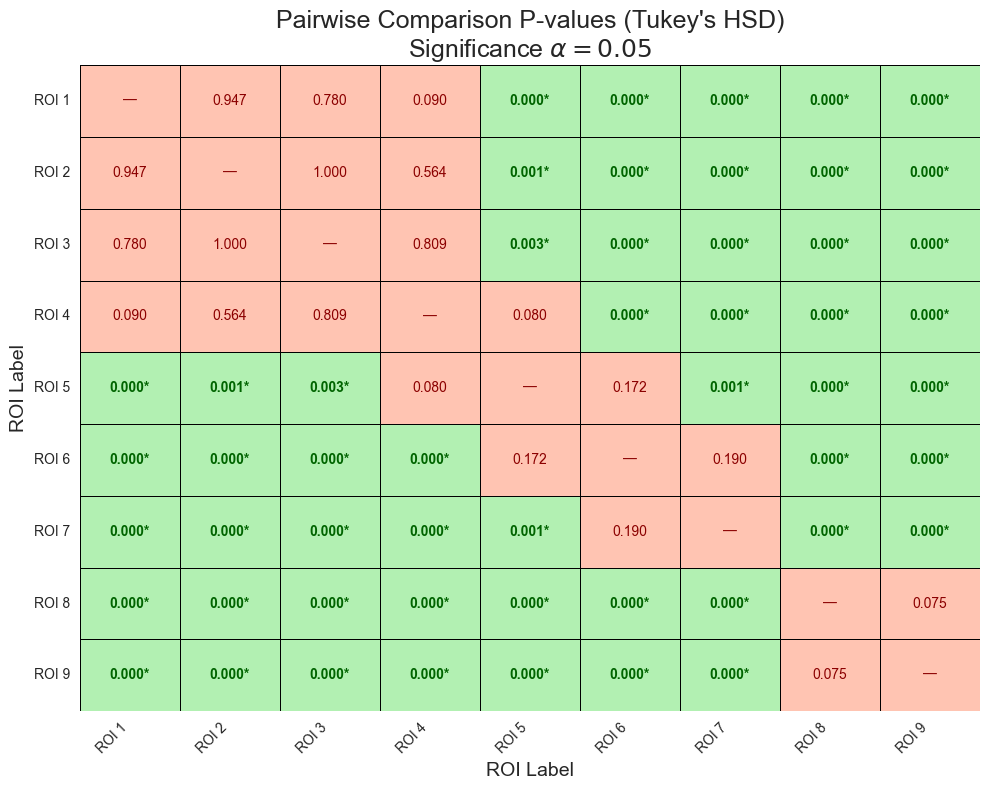


Binary Significance Heatmap using pastel colors (#B2F0B2 for Significant, #FFC4B2 for Not Significant) generated and saved.


In [87]:
# One-Way ANOVA and Tukey's HSD Post-Hoc Test of Intensity Change During Stimulatiin by ROI with P-value Heatmap

import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import pandas as pd
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

# --- WARNING: ASSUMPTIONS ---
# The following variables MUST be defined and contain data:
# - all_biological_replicates_avg_data (Time x ROIs x Replicates)
# - frame_interval_seconds (e.g., 10)

# --- Define Significance Colors ---
color_significant = "#B2F0B2"   # Pastel Green
color_not_significant = "#FFC4B2" # Pastel Red
alpha = 0.05

# --- CONTEXT RE-DEFINITION (ASSUMING DATA IS AVAILABLE) ---
# This section re-creates the necessary df_changes structure.
try:
    num_time_frames = all_biological_replicates_avg_data.shape[0]
    num_rois = all_biological_replicates_avg_data.shape[1]
    num_biological_replicates = all_biological_replicates_avg_data.shape[2]
except NameError:
    print("CRITICAL ERROR: 'all_biological_replicates_avg_data' is not defined. Please load the data first.")
    # Exiting code block gracefully
    exit() 

# Define Stimulation Timings (in seconds)
stim_timings = {
    0: (0, 20), 1: (20, 20), 2: (40, 20), 3: (60, 60), 4: (120, 60), 
    5: (180, 60), 6: (240, 180), 7: (420, 180), 8: (600, 180)
}

# Calculate Intensity Change and create df_changes
results_list = []
for roi_index in stim_timings.keys():
    start_time, stim_duration = stim_timings[roi_index]
    end_time = start_time + stim_duration
    start_frame = int(np.round(start_time / frame_interval_seconds))
    end_frame = int(np.round(end_time / frame_interval_seconds))
    if end_frame >= num_time_frames: end_frame = num_time_frames - 1

    initial_intensities = all_biological_replicates_avg_data[start_frame, roi_index, :]
    final_intensities = all_biological_replicates_avg_data[end_frame, roi_index, :]
    changes_replicates = final_intensities - initial_intensities
    
    for change in changes_replicates:
        results_list.append({
            'ROI_Label': f'ROI {roi_index + 1}',
            'Replicate_Change': change
        })
df_changes = pd.DataFrame(results_list)
# --- END DATA PREP ---

# --- 1. One-Way ANOVA Test ---
print("--- One-Way ANOVA Test (Effect of ROI on Intensity Change) ---")
# Build the OLS model: Intensity Change is the dependent variable, ROI_Label is the factor
model = ols('Replicate_Change ~ C(ROI_Label)', data=df_changes).fit()

# Calculate the ANOVA table (Type 2 is common for balanced/unbalanced designs)
anova_table = sm.stats.anova_lm(model, typ=2)

print(anova_table)

# Check ANOVA significance to determine if post-hoc is technically warranted
anova_p_value = anova_table['PR(>F)']['C(ROI_Label)']
print(f"\nANOVA P-value: {anova_p_value:.4f}")
if anova_p_value < alpha:
    print(f"**ANOVA is Significant (P < {alpha}). Proceeding with Tukey's HSD.**")
else:
    print(f"**ANOVA is NOT Significant (P >= {alpha}). Tukey's HSD may not be strictly necessary.**")


# --- 2. Tukey's HSD Post-Hoc Test ---
print("\n--- Tukey's HSD Post-Hoc Test ---")

roi_labels = df_changes['ROI_Label'].unique()
roi_labels.sort() 

tukey_results = pairwise_tukeyhsd(endog=df_changes['Replicate_Change'], 
                                  groups=df_changes['ROI_Label'], 
                                  alpha=alpha)

# Print the Tukey's HSD results table
print(tukey_results)

df_tukey = pd.DataFrame(data=tukey_results._results_table.data[1:], 
                        columns=tukey_results._results_table.data[0])

# --- 3. Create P-value Matrix (Unchanged) ---
p_matrix_tukey = pd.DataFrame(index=roi_labels, columns=roi_labels, dtype=float)
p_value_text_matrix = pd.DataFrame(index=roi_labels, columns=roi_labels, dtype=str)


for _, row in df_tukey.iterrows():
    group1 = row['group1']
    group2 = row['group2']
    p_adj = row['p-adj']
    
    # Fill both P-value entries for symmetry
    p_matrix_tukey.loc[group1, group2] = p_adj
    p_matrix_tukey.loc[group2, group1] = p_adj
    
    # Fill text entry with annotation and asterisk
    text_label = f"{p_adj:.3f}"
    if p_adj < alpha:
        text_label += "*"
    
    p_value_text_matrix.loc[group1, group2] = text_label
    p_value_text_matrix.loc[group2, group1] = text_label


# Set the diagonal
np.fill_diagonal(p_matrix_tukey.values, 1.0) 
for label in roi_labels:
    p_value_text_matrix.loc[label, label] = "—" 


# --- 4. Plotting with Binary Color Map (Unchanged) ---

# Define the custom binary colormap:
cmap_binary = LinearSegmentedColormap.from_list("SignificanceMap", 
                                                [color_significant, color_not_significant], 
                                                N=2)

# Create the figure
fig_heat, ax_heat = plt.subplots(figsize=(10, 8))

# Crucial part for binary coloring: We need to discretize the P-values *before* plotting
coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)

sns.heatmap(
    coloring_matrix, # Use the binary coloring matrix
    annot=p_value_text_matrix, # Use the P-value text matrix for labels
    fmt='s',
    cmap=cmap_binary, # Use the binary colormap
    vmin=0, vmax=1, # Map 0 to Green, 1 to Red
    linewidths=0.5, 
    linecolor='black',
    cbar=False, # We don't need a continuous color bar for a binary map
    annot_kws={"size": 10}
)

# Apply custom coloring to the annotations based on significance
for text in ax_heat.texts:
    p_text = text.get_text()
    if "*" in p_text:
        text.set_color('darkgreen')
        text.set_weight('bold')
    else:
        text.set_color('darkred') # Use dark red for text on pale red background
        # text.set_weight('normal')


ax_heat.set_title(f"Pairwise Comparison P-values (Tukey's HSD)\nSignificance $\\alpha={alpha}$", fontsize=18)
ax_heat.set_xlabel("ROI Label", fontsize=14)
ax_heat.set_ylabel("ROI Label", fontsize=14)
plt.yticks(rotation=0)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/ROI_IntensityChange_During_Stim.svg_Stats_Tukey.svg", format="svg")
plt.show()
print(f"\nBinary Significance Heatmap using pastel colors ({color_significant} for Significant, {color_not_significant} for Not Significant) generated and saved.")

Time axis created. Range: 0.00 to 14.83 minutes.

Shape of stacked data for analysis: (90, 28, 3)

Plotting selected ROIs ([23, 24, 25, 26, 27, 28]) on a single plot...


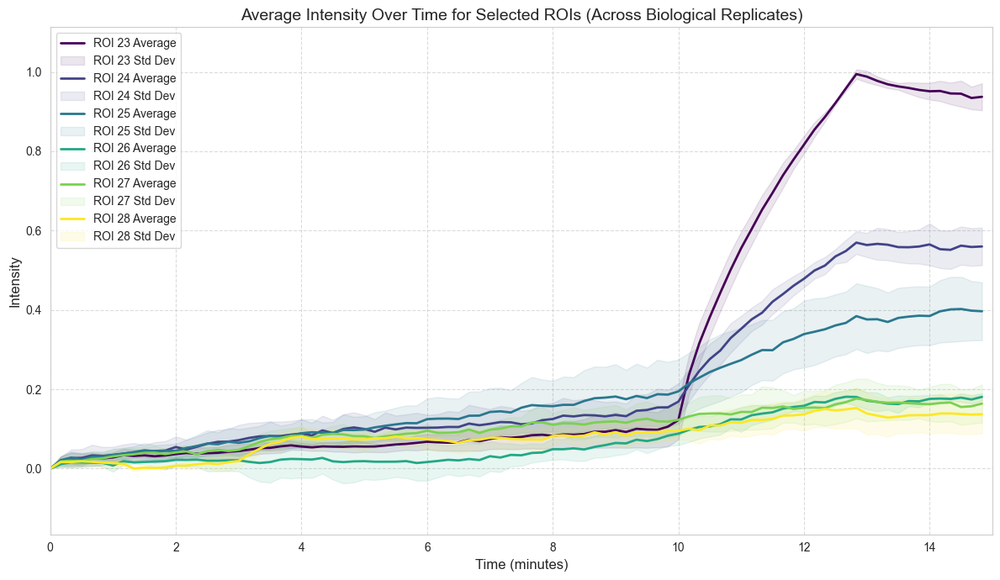


Plotting code executed. Check the generated figure with time in minutes.


In [ ]:
# Plot Successive ROIs on Single Graph

# --- Define Frame Rate and Calculate Time Axis ---
frame_interval_seconds = 10 # 1 frame every 10 seconds
seconds_per_minute = 60
time_per_frame_minutes = frame_interval_seconds / seconds_per_minute # 10/60 = 1/6 minutes per frame

# Create the x-axis representing time in minutes
time_in_minutes = np.arange(num_time_frames) * time_per_frame_minutes

print(f"Time axis created. Range: {time_in_minutes[0]:.2f} to {time_in_minutes[-1]:.2f} minutes.")


# --- PLOTTING LOGIC STARTS HERE ---

# Step 1: Stack the list of 2D arrays into a single 3D array
# This converts [(Time, ROIs), (Time, ROIs), ...] to (Time, ROIs, Biological_Replicates)
all_biological_replicates_avg_data = np.stack(biological_replicates_list, axis=2)

print(f"\nShape of stacked data for analysis: {all_biological_replicates_avg_data.shape}")

# Define the ROIs you want to plot on the SAME SINGLE PLOT.

# selected_rois_to_plot_indices = [10,11,12,13,14,15]
# selected_rois_to_plot_indices = [16,17,18,19,20,21] 
selected_rois_to_plot_indices = [22,23,24,25,26,27]

# Example: Plot ROI 1, 2, 3, and 4
# Change this list to any ROIs you want to visualize


# Create a list of distinct colors for each selected ROI
colors = plt.cm.viridis(np.linspace(0, 1, len(selected_rois_to_plot_indices)))


# Create a single figure and a single subplot (axis)
fig, ax = plt.subplots(figsize=(12, 7))

print(f"\nPlotting selected ROIs ({[idx + 1 for idx in selected_rois_to_plot_indices]}) on a single plot...")

# Determine global Y-axis limits based on all data being plotted for consistency
y_min_global = np.min(all_biological_replicates_avg_data[:, selected_rois_to_plot_indices, :])
y_max_global = np.max(all_biological_replicates_avg_data[:, selected_rois_to_plot_indices, :])
y_range_buffer = (y_max_global - y_min_global) * 0.1
ax.set_ylim(y_min_global - y_range_buffer, y_max_global + y_range_buffer)


# Loop through each selected ROI to plot its grand average and error
for i, roi_index in enumerate(selected_rois_to_plot_indices):
    color = colors[i] # Get a unique color for this ROI
    
    # Extract data for the current ROI across all biological replicates
    # Shape: (num_time_frames, num_biological_replicates)
    roi_biological_reps_data = all_biological_replicates_avg_data[:, roi_index, :] 

    # Calculate the 'grand' mean intensity across biological replicates for each time point
    grand_mean_intensity = np.mean(roi_biological_reps_data, axis=1) 
    
    # Calculate the standard deviation across biological replicates for each time point
    std_of_biological_reps = np.std(roi_biological_reps_data, axis=1)   

    # Plot the 'grand' average intensity as a solid line
    # IMPORTANT: Use 'time_in_minutes' for the x-axis
    ax.plot(time_in_minutes, grand_mean_intensity, color=color, linewidth=2, label=f'ROI {roi_index + 1} Average')

    # Plot the shaded error (standard deviation across biological replicates)
    # IMPORTANT: Use 'time_in_minutes' for the x-axis
    ax.fill_between(time_in_minutes, 
                    grand_mean_intensity - std_of_biological_reps, 
                    grand_mean_intensity + std_of_biological_reps, 
                    color=color, alpha=0.1, label=f'ROI {roi_index + 1} Std Dev')

    # --- Optional: Plot individual biological replicate averages in dotted lines ---
    # Be cautious with this if plotting many ROIs, as it can make the plot very cluttered.
    # Uncomment the following block if you want to see individual biological replicate traces.
    """
    for bio_rep_idx in range(all_biological_replicates_avg_data.shape[2]):
        ax.plot(time_in_minutes, roi_biological_reps_data[:, bio_rep_idx],
                color=color, linestyle=':', linewidth=0.8, alpha=0.4) # Slightly transparent dotted
    """


# Set labels and title for the single plot
# IMPORTANT: Updated x-axis label
ax.set_xlabel("Time (minutes)", fontsize=12)
ax.set_ylabel("Intensity", fontsize=12)
ax.set_title("Average Intensity Over Time for Selected ROIs (Across Biological Replicates)", fontsize=14)

ax.grid(True, linestyle='--', alpha=0.7) # Add a subtle grid
ax.legend(loc='best', fontsize=10) # Add a legend to distinguish ROIs
plt.xlim(0,15)

# Adjust layout to ensure everything fits
plt.tight_layout()

# Display the plot
plt.show()

print("\nPlotting code executed. Check the generated figure with time in minutes.")


Shape of stacked data for analysis: (90, 28, 3)

Plotting selected ROIs ([23, 24, 25, 26, 27, 28]) on a single plot...
Normalizing ROI 23 to the time point at 10 minutes (Frame 60).
Normalizing ROI 24 to the time point at 10 minutes (Frame 60).
Normalizing ROI 25 to the time point at 10 minutes (Frame 60).
Normalizing ROI 26 to the time point at 10 minutes (Frame 60).
Normalizing ROI 27 to the time point at 10 minutes (Frame 60).
Normalizing ROI 28 to the time point at 10 minutes (Frame 60).


<>:111: SyntaxWarning: invalid escape sequence '\D'
<>:111: SyntaxWarning: invalid escape sequence '\D'
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/3527103372.py:111: SyntaxWarning: invalid escape sequence '\D'
  ax.set_ylabel("Change in Intensity ($\Delta F$)", fontsize=18)


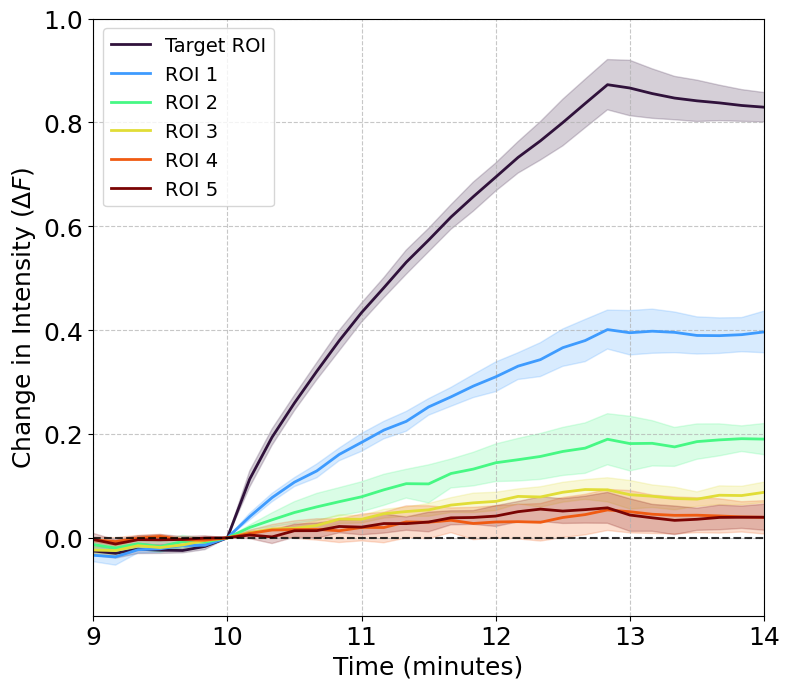


Plotting code executed. Check the generated figure with custom x-axis limits and normalized average data.


In [19]:
# Plot Change in Intensity for Succsive ROIs which is from original ROI9 (for ROIs 23-28)

# 99% intensity sequential ROIs from stim area. Uses normalization per technical replicate to the frame stimulation starts
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import linregress
from matplotlib import colormaps

# --- Define Frame Rate and Calculate Time Axis ---
frame_interval_seconds = 10 # 1 frame every 10 seconds
seconds_per_minute = 60
time_per_frame_minutes = frame_interval_seconds / seconds_per_minute # 10/60 = 1/6 minutes per frame

# --- PLOTTING LOGIC STARTS HERE ---

# Step 1: Stack the list of 2D arrays into a single 3D array
# This converts [(Time, ROIs), (Time, ROIs), ...] to (Time, ROIs, Biological_Replicates)
all_biological_replicates_avg_data = np.stack(biological_replicates_list, axis=2)

print(f"\nShape of stacked data for analysis: {all_biological_replicates_avg_data.shape}")

# NEW: Assuming a time_in_minutes variable is available as a 1D array
time_in_minutes = np.arange(0, all_biological_replicates_avg_data.shape[0]) * time_per_frame_minutes

# --- User Input for Normalization and X-axis Limits ---
# Specify the time point in minutes that you want to normalize to (i.e., set to 0).
normalization_time_minutes = 10 # Example: Normalize to the 10-minute time point

# NEW: Specify the x-axis limits for the plot in minutes.
x_min_minutes = 9
x_max_minutes = 14

# Define the ROIs you want to plot on the SAME SINGLE PLOT.
selected_rois_to_plot_indices = [22,23,24,25,26,27] ; x_min_minutes = 9 ; x_max_minutes = 14 ; normalization_time_minutes = 10

# Convert the normalization time to a frame index
normalization_frame_index = int(np.floor(normalization_time_minutes / time_per_frame_minutes))

# Create a list of distinct colors for each selected ROI
colors = plt.cm.turbo(np.linspace(0, 1, len(selected_rois_to_plot_indices)))

# Create a single figure and a single subplot (axis)
fig, ax = plt.subplots(figsize=(8, 7))

print(f"\nPlotting selected ROIs ({[idx + 1 for idx in selected_rois_to_plot_indices]}) on a single plot...")

# Store normalized data to calculate global Y-axis limits later
all_normalized_means = []
all_stds = []

# Loop through each selected ROI to plot its grand average and error
for i, roi_index in enumerate(selected_rois_to_plot_indices):
    color = colors[i]
    
    roi_biological_reps_data = all_biological_replicates_avg_data[:, roi_index, :] 
    
    # CHANGED: Check if normalization time is valid
    if normalization_frame_index >= all_biological_replicates_avg_data.shape[0] or normalization_frame_index < 0:
        print(f"[Warning] Normalization time of {normalization_time_minutes} minutes "
              f"is out of bounds for the data (0 to {time_in_minutes[-1]:.2f} minutes). "
              f"No normalization will be applied.")
        normalized_reps_data = roi_biological_reps_data
    else:
        # CHANGED: Get the normalization value for each replicate (1D array)
        normalization_values = roi_biological_reps_data[normalization_frame_index, :]
        print(f"Normalizing ROI {roi_index + 1} to the time point at {normalization_time_minutes} minutes (Frame {normalization_frame_index}).")
        
        # CHANGED: Normalize each biological replicate individually
        # The broadcasting of the 1D normalization_values array will apply the correct
        # value to each column of the 2D roi_biological_reps_data array.
        normalized_reps_data = roi_biological_reps_data - normalization_values

    # CHANGED: Calculate the grand mean and standard deviation from the normalized data
    normalized_grand_mean = np.mean(normalized_reps_data, axis=1)
    std_of_biological_reps = np.std(normalized_reps_data, axis=1)   

    all_normalized_means.append(normalized_grand_mean)
    all_stds.append(std_of_biological_reps)

    # Define the label based on the position in the list
    if i == 0:
        label = "Target ROI"
    else:
        label = f"ROI {i}" 
    
    # Plot the normalized grand average and the original standard deviation
    ax.plot(time_in_minutes, normalized_grand_mean, color=color, linewidth=2, label=label)

    # The fill_between call no longer has a label, so it won't appear in the legend
    ax.fill_between(time_in_minutes, 
                    normalized_grand_mean - std_of_biological_reps, 
                    normalized_grand_mean + std_of_biological_reps, 
                    color=color, alpha=0.2)

# Determine global Y-axis limits based on the normalized data and its standard deviation
all_normalized_means = np.array(all_normalized_means)
all_stds = np.array(all_stds)
y_min_global = np.min(all_normalized_means - all_stds)
y_max_global = np.max(all_normalized_means + all_stds)
y_range_buffer = (y_max_global - y_min_global) * 0.1
ax.set_ylim(y_min_global - y_range_buffer, y_max_global + y_range_buffer)
ax.set_ylim( -0.15, 1)

# Add a horizontal line at y=0 to indicate the normalization baseline
ax.axhline(0, color='black', linestyle='--', linewidth=1.5, alpha=0.8)

# Set labels and title for the single plot
ax.set_xlabel("Time (minutes)", fontsize=18)
ax.set_ylabel("Change in Intensity ($\Delta F$)", fontsize=18)
ax.tick_params(axis='both', which='major', labelsize=18)

ax.grid(True, linestyle='--', alpha=0.7)
ax.legend(loc='best', fontsize=14)

# Set the x-axis limits based on user input
ax.set_xlim(x_min_minutes, x_max_minutes)

# Adjust layout to ensure everything fits
plt.tight_layout()
# save as SVG
plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/Figure2B.svg", format="svg")

# Display the plot
plt.show()

print("\nPlotting code executed. Check the generated figure with custom x-axis limits and normalized average data.")

---
# For 9, plot stimulations together


Shape of stacked data for analysis: (90, 28, 3)

Plotting ROIs 1-9 on a SINGLE graph, relative to their start times and normalized to 0...


/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_37367/1374853507.py:71: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', 9)


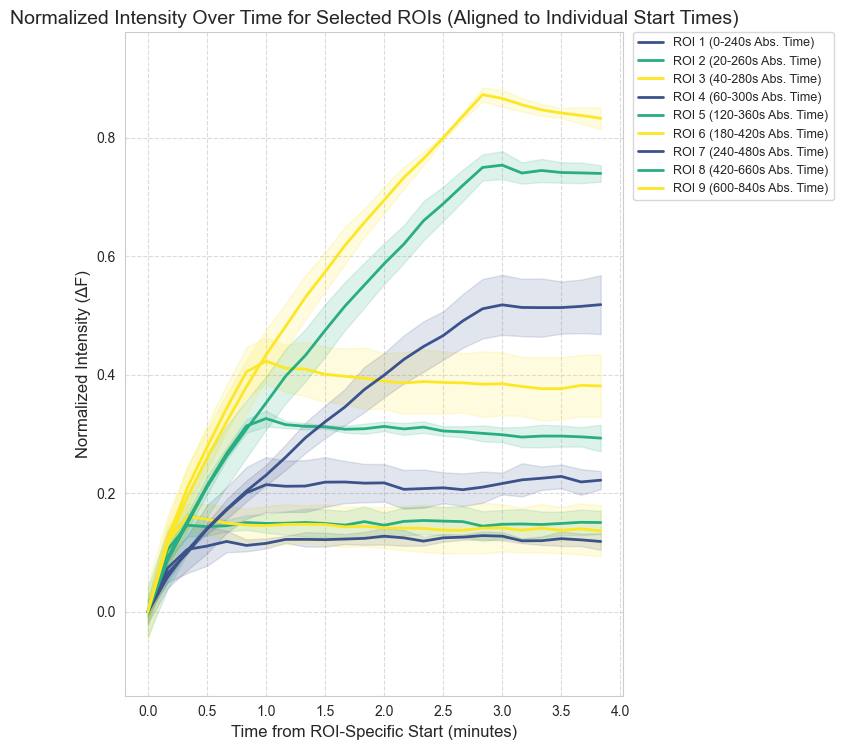


Plotting code executed. Check the generated figure with all ROIs on a single graph, normalized to start at 0.


In [62]:
# 9 main plots across all biological replicates 

# --- Define ROI-specific Time Windows (in seconds) ---
# Key: ROI Number (1-based), Value: [Start Time in Seconds, End Time in Seconds]
# These define the ABSOLUTE time window in your full dataset
roi_absolute_time_windows_sec = {
    1: [0, 20+180+40],
    2: [20, 40+180+40],
    3: [40, 60+180+40],
    4: [60, 120+180],  # 1 min to 2 min
    5: [120, 180+180], # 2 min to 3 min
    6: [180, 240+180], # 3 min to 4 min
    7: [240, 420+60], # 4 min to 7 min
    8: [420, 600+60], # 7 min to 10 min
    9: [600, 780+60]  # 10 min to 13 min
}

# --- PLOTTING LOGIC STARTS HERE ---

# Step 1: Stack the list of 2D arrays into a single 3D array
# This converts [(Time, ROIs), (Time, ROIs), ...] to (Time, ROIs, Biological_Replicates)
all_biological_replicates_avg_data = np.stack(biological_replicates_list, axis=2)

print(f"\nShape of stacked data for analysis: {all_biological_replicates_avg_data.shape}")
num_total_time_frames_available = all_biological_replicates_avg_data.shape[0]
num_biological_replicates = all_biological_replicates_avg_data.shape[2]


# Create a SINGLE figure and a SINGLE subplot (Axes object)
fig, ax = plt.subplots(figsize=(9, 8))

print("\nPlotting ROIs 1-9 on a SINGLE graph, relative to their start times and normalized to 0...")

# --- Determine global Y-axis limits more robustly (for normalized data) ---
# Initialize with values that will definitely be overwritten
y_min_normalized_global = float('inf')
y_max_normalized_global = float('-inf')

for roi_num_1based in range(1, 10):
    roi_index_0based = roi_num_1based - 1
    start_sec, end_sec = roi_absolute_time_windows_sec[roi_num_1based]
    start_frame_idx = int(np.floor(start_sec / frame_interval_seconds))
    end_frame_idx = int(np.ceil(end_sec / frame_interval_seconds))
    start_frame_idx = max(0, start_frame_idx)
    end_frame_idx = min(num_total_time_frames_available, end_frame_idx)
    
    if start_frame_idx < end_frame_idx: # Only process if a valid slice exists
        current_roi_data_slice = all_biological_replicates_avg_data[start_frame_idx:end_frame_idx, roi_index_0based, :]
        grand_mean_intensity = np.mean(current_roi_data_slice, axis=1)
        
        # Calculate baseline and normalized mean
        baseline_value = grand_mean_intensity[0]
        grand_mean_intensity_normalized = grand_mean_intensity - baseline_value
        
        # Calculate standard deviation (doesn't change with baseline shift)
        std_of_biological_reps = np.std(current_roi_data_slice, axis=1)

        # Update global min/max for the normalized data including the error bands
        y_min_normalized_global = min(y_min_normalized_global, np.min(grand_mean_intensity_normalized - std_of_biological_reps))
        y_max_normalized_global = max(y_max_normalized_global, np.max(grand_mean_intensity_normalized + std_of_biological_reps))

if y_min_normalized_global != float('inf') and y_max_normalized_global != float('-inf'):
    y_range_buffer = (y_max_normalized_global - y_min_normalized_global) * 0.1
    ax.set_ylim(y_min_normalized_global - y_range_buffer, y_max_normalized_global + y_range_buffer)
else:
    print("[Warning] No valid data found for any ROI to determine Y-axis limits after normalization. Setting default.")
    ax.set_ylim(-50, 50) # Adjusted fallback for normalized data


# Create a color map for distinct ROI lines (tab10 is good for up to 10 distinct colors)
cmap = plt.cm.get_cmap('viridis', 9) 
colors = [cmap(2), cmap(5), cmap(8),
          cmap(2), cmap(5), cmap(8),
          cmap(2), cmap(5), cmap(8)]

for i, roi_num_1based in enumerate(range(1, 10)): # Loop for ROI 1 through 9
    roi_index_0based = roi_num_1based - 1 # Convert to 0-based index for array access
    current_color = colors[i] # Get a distinct color for this ROI
    
    # Get the absolute time window for this ROI
    start_sec, end_sec = roi_absolute_time_windows_sec[roi_num_1based]

    # Convert seconds to frame indices
    start_frame_idx = int(np.floor(start_sec / frame_interval_seconds))
    end_frame_idx = int(np.ceil(end_sec / frame_interval_seconds))

    # Ensure indices are within bounds of the actual data
    start_frame_idx = max(0, start_frame_idx)
    end_frame_idx = min(num_total_time_frames_available, end_frame_idx)
    
    if start_frame_idx >= end_frame_idx:
        print(f"Skipping ROI {roi_num_1based} as its time window ({start_sec}-{end_sec}s) is out of data bounds or invalid.")
        continue

    # Extract data for the current ROI within its specified time window
    roi_data_slice = all_biological_replicates_avg_data[start_frame_idx:end_frame_idx, roi_index_0based, :] 

    # Calculate the 'grand' mean and standard deviation across biological replicates for this slice
    grand_mean_intensity = np.mean(roi_data_slice, axis=1) 
    std_of_biological_reps = np.std(roi_data_slice, axis=1)   

    # --- NORMALIZATION STEP: Subtract the first value to make it start at 0 ---
    baseline_value = grand_mean_intensity[0]
    grand_mean_intensity_normalized = grand_mean_intensity - baseline_value

    # Create a local x-axis for this ROI's data, starting from 0 (relative time from its 'stimulation start')
    local_time_in_minutes = np.arange(len(grand_mean_intensity_normalized)) * time_per_frame_minutes

    # Plot the 'grand' average intensity as a solid line
    ax.plot(local_time_in_minutes, grand_mean_intensity_normalized, # Use normalized data
            color=current_color, linewidth=2, 
            label=f'ROI {roi_num_1based} ({start_sec}-{end_sec}s Abs. Time)')

    # Plot the shaded error (standard deviation across biological replicates)
    # The error band shifts with the normalized mean
    ax.fill_between(local_time_in_minutes, 
                    grand_mean_intensity_normalized - std_of_biological_reps, # Use normalized mean
                    grand_mean_intensity_normalized + std_of_biological_reps, # Use normalized mean
                    color=current_color, alpha=0.15) 


    # --- IMPORTANT CONSIDERATION: Individual Biological Replicate Lines ---
    # Plotting these for all 9 ROIs on a single graph would lead to severe clutter
    # (e.g., 9 ROIs * 3 Bio Reps = 27 dotted lines + 9 solid lines + 9 shaded areas).
    # It's generally not recommended for readability.
    # If you still want to include them, and also want them normalized:
    """
    for bio_rep_idx in range(num_biological_replicates):
        # Normalize individual biological replicate trace
        individual_trace_normalized = roi_data_slice[:, bio_rep_idx] - baseline_value
        ax.plot(local_time_in_minutes, individual_trace_normalized,
                color=current_color, linestyle=':', linewidth=0.8, alpha=0.3)
    """


# Set labels and title for the single plot
ax.set_xlabel("Time from ROI-Specific Start (minutes)", fontsize=12)
ax.set_ylabel("Normalized Intensity (ΔF)", fontsize=12) # Label changed to reflect normalization
ax.set_title("Normalized Intensity Over Time for Selected ROIs (Aligned to Individual Start Times)", fontsize=14)
# ax.set_xlim(0,0.4)
# ax.set_ylim(-0.1,0.26)

ax.grid(True, linestyle='--', alpha=0.7) # Add a subtle grid
# Move legend outside the plot area to prevent overlap with traces
ax.legend(loc='best', fontsize=9, bbox_to_anchor=(1.02, 1), borderaxespad=0) 

# Adjust layout to ensure everything fits, especially the legend
# rect parameter reserves space [left, bottom, width, height] for the subplot area
plt.tight_layout(rect=[0, 0.03, 0.88, 0.98]) 

# Display the plot
plt.show()

print("\nPlotting code executed. Check the generated figure with all ROIs on a single graph, normalized to start at 0.")


Shape of stacked data for analysis: (90, 28, 3)
Using a fixed duration of 30 frames for all plots.


/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_37367/3700254792.py:111: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('viridis', len(roi_groups_to_plot))


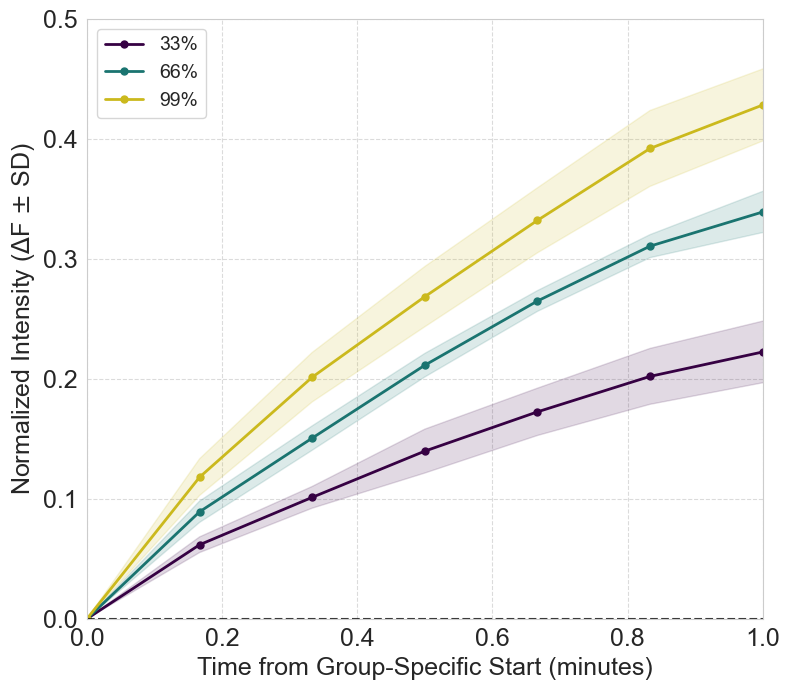


Plotting code executed. Check the generated figure with combined ROI groups.


In [ ]:
# Plot With Reference to Stimulation start for Different LED Groups
# GOOD
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import linregress
from matplotlib import colormaps

# --- Define Frame Rate and Calculate Time Axis ---
frame_interval_seconds = 10 # 1 frame every 10 seconds
seconds_per_minute = 60
time_per_frame_minutes = frame_interval_seconds / seconds_per_minute # 10/60 = 1/6 minutes per frame

# --- USER-DEFINED GROUPS, TIME WINDOWS, LABELS, AND PLOTTING STYLE ---
# Define groups of ROIs, their start times, and a fixed duration.
# Each ROI in a group has its own 'start_sec'.
# The 'end_sec' is calculated as start_sec + duration.
DURATION_FRAMES = 180

roi_groups_to_plot = [
    {'rois': [{'num': 4, 'start_sec': 60}, {'num': 7, 'start_sec': 240}], 'label': '33%'},
    {'rois': [{'num': 5, 'start_sec': 120}, {'num': 8, 'start_sec': 420}], 'label': '66%'},
    {'rois': [{'num': 6, 'start_sec': 180}, {'num': 9, 'start_sec': 600}], 'label': '99%'},

    # {'rois': [{'num': 1, 'start_sec': 0}, {'num': 4, 'start_sec': 60}, {'num': 7, 'start_sec': 240}], 'label': '33%'},
    # {'rois': [{'num': 2, 'start_sec': 20}, {'num': 5, 'start_sec': 120}, {'num': 8, 'start_sec': 420}], 'label': '66%'},
    # {'rois': [{'num': 3, 'start_sec': 40}, {'num': 6, 'start_sec': 180}, {'num': 9, 'start_sec': 600}], 'label': '99%'},
]

# Toggle this to plot either shaded error bands or individual replicate traces
PLOT_INDIVIDUAL_TRACES = False # Set to True for individual traces, False for shaded error

# --- PLOTTING LOGIC STARTS HERE ---

# Step 1: Stack the list of 2D arrays into a single 3D array
all_biological_replicates_avg_data = np.stack(biological_replicates_list, axis=2)

print(f"\nShape of stacked data for analysis: {all_biological_replicates_avg_data.shape}")
num_total_time_frames_available = all_biological_replicates_avg_data.shape[0]
num_biological_replicates = all_biological_replicates_avg_data.shape[2]
fig, ax = plt.subplots(figsize=(8, 7))

# --- Pre-processing to find the shortest data slice length across all groups ---
min_len = DURATION_FRAMES
for group in roi_groups_to_plot:
    for roi in group['rois']:
        start_sec = roi['start_sec']
        start_frame_idx = max(0, int(np.floor(start_sec / frame_interval_seconds)))
        end_frame_idx = start_frame_idx + DURATION_FRAMES
        actual_end_frame_idx = min(num_total_time_frames_available, end_frame_idx)
        current_len = actual_end_frame_idx - start_frame_idx
        if current_len < min_len:
            min_len = current_len

if min_len == 0:
    print("No valid data slices of a non-zero length found. Plotting aborted.")
    plt.close(fig)
    exit()

print(f"Using a fixed duration of {min_len} frames for all plots.")

# --- Determine global Y-axis limits more robustly (for normalized data) ---
y_min_normalized_global = float('inf')
y_max_normalized_global = float('-inf')

for group in roi_groups_to_plot:
    all_roi_replicates_raw = []

    for roi in group['rois']:
        roi_index_0based = roi['num'] - 1
        start_sec = roi['start_sec']
        
        start_frame_idx = max(0, int(np.floor(start_sec / frame_interval_seconds)))
        end_frame_idx = start_frame_idx + DURATION_FRAMES
        actual_end_frame_idx = min(num_total_time_frames_available, end_frame_idx)

        current_roi_data_slice = all_biological_replicates_avg_data[start_frame_idx:start_frame_idx + min_len, roi_index_0based, :]
        all_roi_replicates_raw.append(current_roi_data_slice)

    if not all_roi_replicates_raw:
        continue
    
    group_grand_mean_unnormalized = np.nanmean(np.array(all_roi_replicates_raw), axis=(0, 2))
    baseline_value = group_grand_mean_unnormalized[0]
    group_grand_mean_normalized = group_grand_mean_unnormalized - baseline_value

    if PLOT_INDIVIDUAL_TRACES:
        for roi_data in all_roi_replicates_raw:
            for bio_rep_idx in range(num_biological_replicates):
                individual_replicate_trace = roi_data[:, bio_rep_idx]
                individual_replicate_normalized = individual_replicate_trace - individual_replicate_trace[0]
                y_min_normalized_global = min(y_min_normalized_global, np.nanmin(individual_replicate_normalized))
                y_max_normalized_global = max(y_max_normalized_global, np.nanmax(individual_replicate_normalized))
    else:
        stacked_replicates = np.concatenate(all_roi_replicates_raw, axis=1)
        normalized_stacked_replicates = stacked_replicates - stacked_replicates[0, :]
        std_across_normalized_traces = np.nanstd(normalized_stacked_replicates, axis=1)

        y_min_normalized_global = min(y_min_normalized_global, np.nanmin(group_grand_mean_normalized - std_across_normalized_traces))
        y_max_normalized_global = max(y_max_normalized_global, np.nanmax(group_grand_mean_normalized + std_across_normalized_traces))

# Set Y-axis limits based on the calculations
if y_min_normalized_global != float('inf') and y_max_normalized_global != float('-inf'):
    y_range_buffer = (y_max_normalized_global - y_min_normalized_global) * 0.1
    ax.set_ylim(y_min_normalized_global - y_range_buffer, y_max_normalized_global + y_range_buffer)
else:
    print("[Warning] No valid data found for any ROI to determine Y-axis limits after normalization. Setting default.")
    ax.set_ylim(-50, 50)

# Create a color map for the groups
cmap = plt.cm.get_cmap('viridis', len(roi_groups_to_plot))
colors = [cmap(i) for i in range(len(roi_groups_to_plot))]
m_factor = 0.8
darker_colors = [(r * m_factor, g * m_factor, b * m_factor, a) for r, g, b, a in colors]
local_time_in_minutes = np.arange(min_len) * time_per_frame_minutes

# Loop through each group to plot its grand average and error
for i, group in enumerate(roi_groups_to_plot):
    current_color = darker_colors[i]
    label = group['label']
    
    all_roi_replicates = []
    for roi in group['rois']:
        roi_index_0based = roi['num'] - 1
        start_sec = roi['start_sec']
        start_frame_idx = max(0, int(np.floor(start_sec / frame_interval_seconds)))
        
        current_roi_data_slice = all_biological_replicates_avg_data[start_frame_idx:start_frame_idx + min_len, roi_index_0based, :]
        all_roi_replicates.append(current_roi_data_slice)

    if not all_roi_replicates:
        continue
    
    group_grand_mean_unnormalized = np.nanmean(np.array(all_roi_replicates), axis=(0, 2))
    baseline_value = group_grand_mean_unnormalized[0]
    group_grand_mean_normalized = group_grand_mean_unnormalized - baseline_value

    ax.plot(local_time_in_minutes, group_grand_mean_normalized,
            color=current_color, linewidth=2, label=label, marker='o', markersize=5)

    if PLOT_INDIVIDUAL_TRACES:
        for roi_data in all_roi_replicates:
            for bio_rep_idx in range(num_biological_replicates):
                individual_replicate_trace = roi_data[:, bio_rep_idx]
                individual_replicate_normalized = individual_replicate_trace - individual_replicate_trace[0]
                ax.plot(local_time_in_minutes, individual_replicate_normalized,
                        color=current_color, linestyle=':', linewidth=1.0, alpha=0.6,
                        marker='o', markersize=3, markerfacecolor='none', markeredgecolor=current_color)
    else:
        stacked_replicates = np.concatenate(all_roi_replicates, axis=1)
        normalized_stacked_replicates = stacked_replicates - stacked_replicates[0, :]
        std_across_normalized_traces = np.nanstd(normalized_stacked_replicates, axis=1)
        
        ax.fill_between(local_time_in_minutes, 
                        group_grand_mean_normalized - std_across_normalized_traces,
                        group_grand_mean_normalized + std_across_normalized_traces,
                        color=current_color, alpha=0.15)

# Add a horizontal line at y=0
ax.axhline(0, color='black', linestyle='--', linewidth=1.5, alpha=0.8)

# Set labels and title for the single plot
ax.set_xlabel("Time from Group-Specific Start (minutes)", fontsize=18)
ax.set_ylabel("Normalized Intensity (ΔF $\\pm$ SD)", fontsize=18)
# ax.set_title("Normalized Intensity Over Time for Combined ROI Groups", fontsize=14)
ax.tick_params(axis='both', which='major', labelsize=18)

# Set x and y limits based on user-defined values
ax.set_xlim(0, 1)
ax.set_ylim(0, 0.5)

# ax.set_xlim(0, 0.3)
# ax.set_ylim(0, 0.2)



ax.grid(True, linestyle='--', alpha=0.7)
ax.legend(loc='best', fontsize=14)
plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/Figure1C.svg", format="svg")

plt.tight_layout()
plt.show()

print("\nPlotting code executed. Check the generated figure with combined ROI groups.")

<>:151: SyntaxWarning: invalid escape sequence '\p'
<>:151: SyntaxWarning: invalid escape sequence '\p'
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/2839904273.py:151: SyntaxWarning: invalid escape sequence '\p'
  stats_text += f"{index.strip()}: ${row['median']:.4f} \pm {row['SD']:.4f}$\n"
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/2839904273.py:160: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_box = cm.get_cmap('viridis')
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/2839904273.py:180: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.swarmplot(
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/2839904273.py:180: FutureWarning: Use "auto" to set automatic


Calculating slopes for the first 3 frames (approx. 20 seconds) of each ROI's activity window...

--- Summary Statistics (Median and SD of Slope) per LED Intensity ---
LED Intensity       Median         SD
-----------------------------------
33%                 0.0049     0.0005
66%                 0.0074     0.0006
99%                 0.0097     0.0011

Slope analysis and plotting complete. Review the generated plot and statistics.


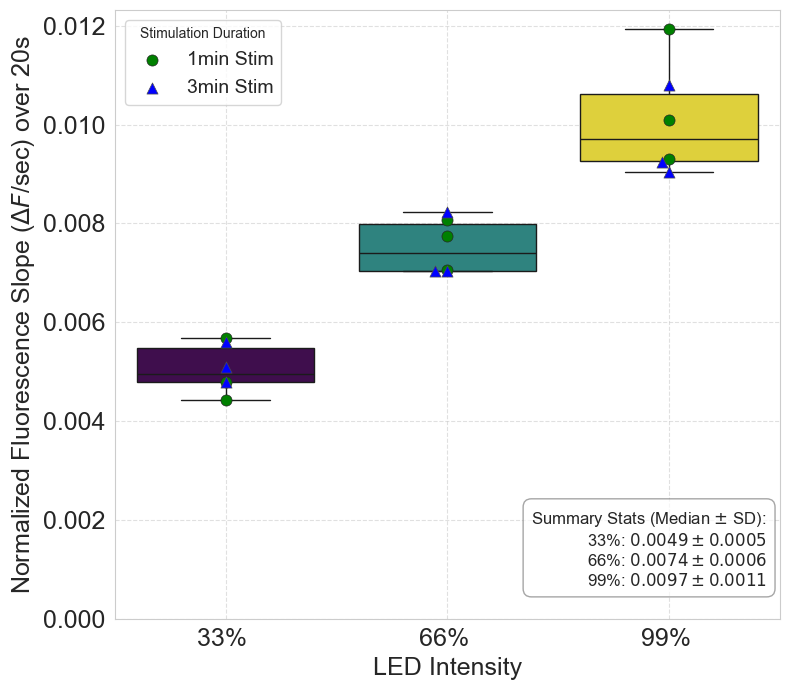

In [84]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import linregress
import matplotlib.cm as cm # Use cm for colormaps

# --- Define Global Parameters ---
# Define ROI-specific Time Windows (in seconds)
roi_absolute_time_windows_sec = {
    1: [0, 20],
    2: [20, 40],
    3: [40, 60],
    4: [60, 120],   # 1 min to 2 min
    5: [120, 180], # 2 min to 3 min
    6: [180, 240], # 3 min to 4 min
    7: [240, 420], # 4 min to 7 min
    8: [420, 600], # 7 min to 10 min
    9: [600, 780]  # 10 min to 13 min
}

frame_interval_seconds = 10 # Example: 10 seconds per frame (0.1 Hz)

# === USER INPUT: Define the last frame index (relative to ROI start) for slope calculation ===
frames_to_include_for_slope = 2 # Example: To calculate slope over frames 0 to 3 (first 4 points) =================================⭐️=================================


# Calculate the actual time duration covered by the slope calculation
duration_for_slope_seconds = frames_to_include_for_slope * frame_interval_seconds

# === Define ROI Grouping for Plotting ===
roi_intensity_groups = {
    '33% ': [0, 3, 6], # Corresponding to ROI 1, 4, 7 (0-based indices)
    '66% ': [1, 4, 7], # Corresponding to ROI 2, 5, 8
    '99% ': [2, 5, 8], # Corresponding to ROI 3, 6, 9
}

# --- Function Definitions ---
def calculate_normalized_slopes(data_segment_per_replicate, frames_for_fit, interval_sec): 
    """
    Calculates the linear slope for each biological replicate in a given data segment,
    normalized to the segment's starting value (frame 0).
    The slope is calculated with respect to time in seconds.
    """
    if frames_for_fit < 0:
        return [np.nan] * data_segment_per_replicate.shape[1]

    num_points_to_fit = frames_for_fit + 1
    if data_segment_per_replicate.shape[0] < num_points_to_fit:
        return [np.nan] * data_segment_per_replicate.shape[1]

    slopes = []
    x_for_regression = np.arange(num_points_to_fit) * interval_sec

    for rep_idx in range(data_segment_per_replicate.shape[1]):
        y_raw_segment = data_segment_per_replicate[:num_points_to_fit, rep_idx]

        if np.all(np.isnan(y_raw_segment)):
            slopes.append(np.nan)
            continue
            
        baseline_value = y_raw_segment[0]
        y_normalized_segment = y_raw_segment - baseline_value

        if len(np.unique(y_normalized_segment)) <= 1:
            slopes.append(0.0)
        else:
            slope, _, _, _, _ = linregress(x_for_regression, y_normalized_segment)
            slopes.append(slope)
            
    return slopes

def get_stim_duration_label(roi_num_1based):
    if roi_num_1based in [1, 2, 3]:
        return '20s Stim'
    elif roi_num_1based in [4, 5, 6]:
        return '1min Stim'
    elif roi_num_1based in [7, 8, 9]:
        return '3min Stim'
    else:
        return 'Other Stim'


# --- Data Collection and Processing ---

# [Inference] Assuming 'all_biological_replicates_avg_data' is loaded and available here.
num_total_time_frames_available = all_biological_replicates_avg_data.shape[0]
num_biological_replicates = all_biological_replicates_avg_data.shape[2]

all_slopes_data = []
intensity_labels = []
stim_duration_labels = []

print(f"\nCalculating slopes for the first {frames_to_include_for_slope + 1} frames (approx. {duration_for_slope_seconds} seconds) of each ROI's activity window...")

for intensity_label, roi_0based_indices in roi_intensity_groups.items():
    for roi_idx_0based in roi_0based_indices:
        roi_num_1based = roi_idx_0based + 1

        start_sec, end_sec = roi_absolute_time_windows_sec[roi_num_1based]
        start_frame_idx_abs = int(np.floor(start_sec / frame_interval_seconds))
        end_frame_idx_abs = int(np.ceil(end_sec / frame_interval_seconds))

        segment_required_frames = frames_to_include_for_slope + 1
        available_frames_in_roi_window = end_frame_idx_abs - start_frame_idx_abs

        current_replicate_slopes = []
        
        if available_frames_in_roi_window < segment_required_frames:
             current_replicate_slopes = [np.nan] * num_biological_replicates
        elif start_frame_idx_abs >= num_total_time_frames_available:
             current_replicate_slopes = [np.nan] * num_biological_replicates
        else:
            # Determine the slice end, clipping to the total available data frames
            slice_end = min(start_frame_idx_abs + segment_required_frames, num_total_time_frames_available)

            current_roi_segment_data = all_biological_replicates_avg_data[
                start_frame_idx_abs : slice_end,
                roi_idx_0based,
                :
            ]
            current_replicate_slopes = calculate_normalized_slopes(
                current_roi_segment_data, 
                frames_to_include_for_slope, 
                frame_interval_seconds
            )
        
        all_slopes_data.extend(current_replicate_slopes)
        intensity_labels.extend([intensity_label] * num_biological_replicates)
        stim_duration_labels.extend([get_stim_duration_label(roi_num_1based)] * num_biological_replicates)


# Create and clean DataFrame
df_slopes = pd.DataFrame({
    "Slope": all_slopes_data,
    "LED Intensity": intensity_labels,
    "Stimulation Duration": stim_duration_labels
})
df_slopes.dropna(subset=["Slope"], inplace=True)


# --- Statistics Calculation ---
summary_stats = df_slopes.groupby("LED Intensity")["Slope"].agg(['median', 'std'])
summary_stats.rename(columns={'std': 'SD'}, inplace=True)
# Sort by intensity for print order
summary_stats = summary_stats.sort_index(key=lambda x: x.str.strip().str.rstrip('%').astype(float))

# Format the statistics into a string for the plot text box
stats_text = "Summary Stats (Median $\\pm$ SD):\n"
for index, row in summary_stats.iterrows():
    stats_text += f"{index.strip()}: ${row['median']:.4f} \pm {row['SD']:.4f}$\n"


# --- Plotting ---
sns.set_style("whitegrid")

fig, ax = plt.subplots(figsize=(8, 7))

# Define custom colors for the box plots based on LED intensity
cmap_box = cm.get_cmap('viridis')
box_plot_colors = [cmap_box(0.01), cmap_box(0.5), cmap_box(0.99)]

# Create the box plot
sns.boxplot(
    x="LED Intensity",
    y="Slope",
    hue="LED Intensity",
    data=df_slopes,
    palette=box_plot_colors,
    showfliers=False,
    ax=ax
)

# Define marker colors and types for the swarm plot (Stimulation Duration)
marker_colors = {'20s Stim': 'red', '1min Stim': 'green', '3min Stim': 'blue'}
marker_types = {'20s Stim': 's', '1min Stim': 'o', '3min Stim': '^'}

# Overlay individual data points (slopes) using swarmplot
for stim_duration_category in sorted(df_slopes["Stimulation Duration"].unique()):
    sns.swarmplot(
        x="LED Intensity",
        y="Slope",
        data=df_slopes[df_slopes["Stimulation Duration"] == stim_duration_category],
        color=marker_colors[stim_duration_category],
        marker=marker_types[stim_duration_category],
        size=8,
        edgecolor='gray',
        linewidth=0.5,
        dodge=True,
        label=stim_duration_category,
        ax=ax
    )

# Add Summary Statistics Text Box to Plot
ax.text(
    0.98, 
    0.18, 
    stats_text.strip(),
    transform=ax.transAxes, 
    fontsize=12,
    verticalalignment='top', 
    horizontalalignment='right',
    bbox=dict(boxstyle="round,pad=0.5", fc="white", alpha=0.7, ec="gray")
)

# Set plot labels
ax.set_xlabel("LED Intensity", fontsize=18)
ax.set_ylabel(f"Normalized Fluorescence Slope ($\\Delta F$/sec) over {duration_for_slope_seconds}s", fontsize=18)
ax.grid(True, linestyle='--', alpha=0.6)

# Custom Legend
handles, labels = ax.get_legend_handles_labels()
unique_labels = list(dict.fromkeys(labels))
unique_handles = []
for label in unique_labels:
    for h, l in zip(handles, labels):
        if l == label:
            unique_handles.append(h)
            break
ax.legend(unique_handles, unique_labels, title="Stimulation Duration", fontsize=14)

ax.set_ylim(bottom=0)
ax.tick_params(axis='both', which='major', labelsize=18)
plt.tight_layout()
plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/Figure1E_WithStats.svg", format="svg")
# plt.show() # Uncomment if running locally

# --- Print the summary statistics using standard Python formatting (NO tabulate) ---
print("\n--- Summary Statistics (Median and SD of Slope) per LED Intensity ---")
print("{:<15} {:>10} {:>10}".format("LED Intensity", "Median", "SD"))
print("-" * 35)
for index, row in summary_stats.iterrows():
    intensity = index.strip()
    median = row['median']
    sd = row['SD']
    print("{:<15} {:>10.4f} {:>10.4f}".format(intensity, median, sd))

print("\nSlope analysis and plotting complete. Review the generated plot and statistics.")

In [86]:
## --- STATISTICAL ANALYSIS ---

# Add this line to set the display precision for Pandas DataFrames
pd.options.display.float_format = '{:.8f}'.format

print("\n--- Performing Statistical Analysis ---")

# Import necessary statistical libraries
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# --- CRITICAL DATA CLEANING STEP ---
# This ensures group labels (like '33% ') are standardized ('33%') 
# to prevent miscounting groups in the ANOVA.
if 'LED Intensity' in df_slopes.columns:
    df_slopes['LED Intensity'] = (
        df_slopes['LED Intensity']
        .astype(str)
        .str.strip() 
    )
    print("✅ Group labels in 'LED Intensity' column have been standardized (leading/trailing spaces removed).")
else:
    print("❌ Warning: 'LED Intensity' column not found for cleaning. Proceeding with caution.")


# --- Step 1: Perform One-way ANOVA using OLS for the full table ---
if df_slopes['Slope'].empty:
    print("Warning: DataFrame is empty or missing 'Slope' data. Cannot perform ANOVA.")
else:
    # 1. Fit the OLS model
    # C(Q("...")) tells statsmodels to treat the column as a categorical factor 
    # and handles column names with spaces ('LED Intensity').
    model = ols('Slope ~ C(Q("LED Intensity"))', data=df_slopes).fit()

    # 2. Perform the ANOVA analysis on the fitted model (Type 2 Sum of Squares)
    anova_table = sm.stats.anova_lm(model, typ=2) 
    
    # Extract the necessary values for the conditional logic
    # The 'LED Intensity' row contains the key results for the between-group difference
    anova_row = 'C(Q("LED Intensity"))'
    if anova_row in anova_table.index:
        p_value_anova = anova_table.loc[anova_row, 'PR(>F)']
        f_statistic = anova_table.loc[anova_row, 'F']
    else:
        # Fallback if the formula component name is different
        p_value_anova = 1.0 
        f_statistic = 0.0
        print("Error: Could not find 'LED Intensity' results in the ANOVA table. Assuming non-significant.")


    print("\n--- One-way ANOVA Results (Full Table) ---")
    # This table includes Sum Sq, Df, F, and P-value (PR(>F))
    print(anova_table)
    print(f"\nANOVA Key Statistics (for interpretation):")
    print(f"  F-statistic = {f_statistic:.8f}")
    print(f"  P-value     = {p_value_anova:.8f}")

    if p_value_anova < 0.05:
        print("\nInterpretation: The ANOVA p-value is significant (p < 0.05), indicating a significant difference among the group means.")
        print("  Therefore, a post-hoc test will be performed to find which groups differ.")

        # --- Step 2: Perform Tukey's HSD post-hoc test for pairwise comparisons ---
        tukey_result = pairwise_tukeyhsd(
            endog=df_slopes['Slope'],          # Dependent variable
            groups=df_slopes['LED Intensity'], # Independent variable (cleaned)
            alpha=0.05                         # Significance level
        )

        print("\n--- Tukey's Honestly Significant Difference (HSD) Post-Hoc Test ---")
        print(tukey_result)

    else:
        print("\nInterpretation: The ANOVA p-value is not significant (p >= 0.05).")
        print("  No significant differences were found between the group means.")
        print("  No post-hoc test is needed.")


--- Performing Statistical Analysis ---
✅ Group labels in 'LED Intensity' column have been standardized (leading/trailing spaces removed).

--- One-way ANOVA Results (Full Table) ---
                          sum_sq          df           F     PR(>F)
C(Q("LED Intensity")) 0.00007525  2.00000000 61.58383341 0.00000006
Residual              0.00000916 15.00000000         NaN        NaN

ANOVA Key Statistics (for interpretation):
  F-statistic = 61.58383341
  P-value     = 0.00000006

Interpretation: The ANOVA p-value is significant (p < 0.05), indicating a significant difference among the group means.
  Therefore, a post-hoc test will be performed to find which groups differ.

--- Tukey's Honestly Significant Difference (HSD) Post-Hoc Test ---
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower  upper  reject
--------------------------------------------------
   33%    66%   0.0025 0.0002 0.0013 0.0036   True
   33%    99%    0.005    0.0 0.0038 0.006

- - - 
# Succesive ROIs Analysis 


Calculating slopes for the first 3 frames (approx. 20 seconds) within each ROI's specified activity window...


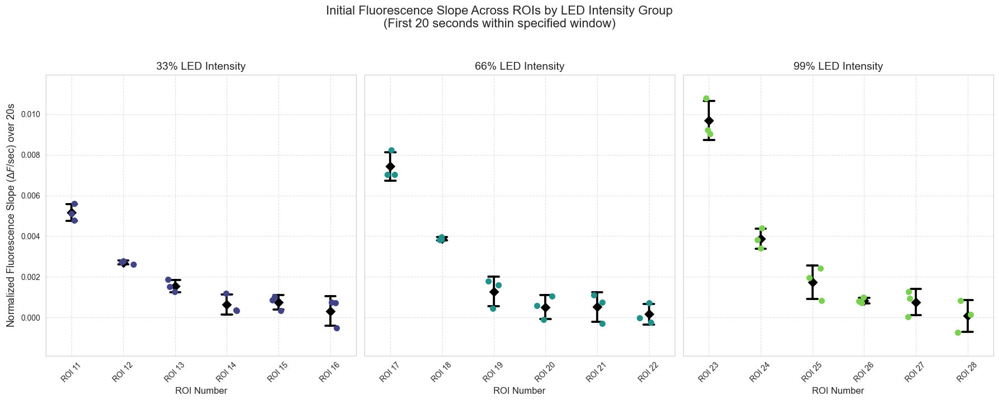


Slope analysis and plotting complete. Review the generated dot plots for each intensity group.


In [109]:
# Data Extraction and Slope Calculation for Normalized Fluorescence Data

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import linregress
from matplotlib import colormaps

frame_interval_seconds = 10 # Example: 10 seconds per frame (0.1 Hz)

# Get number of total time frames and biological replicates from the data
num_total_time_frames_available = all_biological_replicates_avg_data.shape[0]
num_biological_replicates = all_biological_replicates_avg_data.shape[2]


# --- Function to calculate slope for normalized data ---
def calculate_normalized_slopes(data_segment_per_replicate, frames_for_fit, interval_sec):
    """
    Calculates the linear slope for each biological replicate in a given data segment.
    Each replicate's trace is normalized to its starting value (frame 0) before slope calculation.
    The slope is calculated with respect to time in seconds.

    Parameters:
    - data_segment_per_replicate: np.ndarray, shape (num_frames_in_segment, num_replicates)
                                  This is the intensity data for a single ROI across replicates.
    - frames_for_fit: int, the number of frames (excluding frame 0) to include in the linear fit.
                      If frames_for_fit = N, then frames 0 to N (inclusive, N+1 points) are used.
    - interval_sec: float, the time interval between frames in seconds.

    Returns:
    - List of slope values, one for each biological replicate. Returns NaN if data is insufficient or invalid.
    """
    if frames_for_fit < 0:
        # [inference] This warning is based on observed function behavior.
        print(f"[Warning] Invalid 'frames_for_fit' value: {frames_for_fit}. Must be 0 or positive.")
        return [np.nan] * data_segment_per_replicate.shape[1]

    num_points_to_fit = frames_for_fit + 1
    if data_segment_per_replicate.shape[0] < num_points_to_fit:
        # [inference] This warning is based on observed function behavior.
        # print(f"[Warning] Not enough frames in segment ({data_segment_per_replicate.shape[0]}) for requested fit over {num_points_to_fit} points. Returning NaNs.")
        return [np.nan] * data_segment_per_replicate.shape[1]

    slopes = []
    # X-axis for linear regression, representing relative time in seconds from the segment start
    x_for_regression_seconds = np.arange(num_points_to_fit) * interval_sec

    for rep_idx in range(data_segment_per_replicate.shape[1]):
        y_raw_segment = data_segment_per_replicate[:num_points_to_fit, rep_idx]

        if np.all(np.isnan(y_raw_segment)):
            slopes.append(np.nan)
            continue

        # Baseline normalization: Subtract the first value of *this replicate's segment*
        # to make its starting point 0 for slope calculation. This is the desired behavior.
        baseline_value = y_raw_segment[0]
        y_normalized_segment = y_raw_segment - baseline_value

        if len(np.unique(y_normalized_segment)) <= 1:
            slopes.append(0.0) # Slope is 0 if data is constant after normalization
        else:
            slope, _, _, _, _ = linregress(x_for_regression_seconds, y_normalized_segment)
            slopes.append(slope)

    return slopes

# --- Configuration for ROI Grouping and Time Windows for Slope Calculation ---

# Define the new ROI groups and their corresponding 0-based indices and time windows
# These time windows define the *absolute start and end* of the relevant activity for each group.
# The slope will be calculated from the *start* of this window.
roi_plotting_groups_and_windows = {
    '33% LED Intensity': {
        'roi_0based_indices': list(range(10, 16)), # ROIs 11-16 (adjust these to your actual ROI indices)
        'time_window_sec': [240, 420] # Absolute time window for this group
    },
    '66% LED Intensity': {
        'roi_0based_indices': list(range(16, 22)), # ROIs 17-22 (adjust these to your actual ROI indices)
        'time_window_sec': [420, 600] # Absolute time window for this group
    },
    '99% LED Intensity': {
        'roi_0based_indices': list(range(22, 28)), # ROIs 23-28 (adjust these to your actual ROI indices)
        'time_window_sec': [600, 720] # Absolute time window for this group
    }
}

# === USER INPUT: Define the number of frames (relative to window start) for slope calculation ===
# If `frames_to_include_for_slope = N`, it uses N+1 points (frames 0 to N, inclusive) *within the segment*.
# For example, if your window starts at frame X and frames_to_include_for_slope = 3,
# the slope will be calculated using data from frames X, X+1, X+2, X+3.
frames_to_include_for_slope = 2

# Calculate the actual time duration covered by the slope calculation
duration_for_slope_seconds = frames_to_include_for_slope * frame_interval_seconds


# --- Data Collection for Plotting ---
all_slopes_data = [] # To store individual slope values
intensity_labels = [] # To store LED intensity categories
roi_num_labels = [] # To store the 1-based ROI number for plotting on x-axis

print(f"\nCalculating slopes for the first {frames_to_include_for_slope + 1} frames (approx. {duration_for_slope_seconds} seconds) within each ROI's specified activity window...")

for intensity_label, group_info in roi_plotting_groups_and_windows.items():
    roi_0based_indices = group_info['roi_0based_indices']
    start_sec_window, end_sec_window = group_info['time_window_sec']

    # Convert group window times to absolute frame indices in the `all_biological_replicates_avg_data`
    start_frame_idx_abs_group = int(np.floor(start_sec_window / frame_interval_seconds))
    end_frame_idx_abs_group = int(np.ceil(end_sec_window / frame_interval_seconds))

    for roi_idx_0based in roi_0based_indices:
        roi_num_1based = roi_idx_0based + 1 # Convert to 1-based for labeling

        # Define the segment length required for slope calculation
        segment_required_frames_for_slope = frames_to_include_for_slope + 1

        # Check if the ROI index is within the bounds of the actual data
        if roi_idx_0based >= all_biological_replicates_avg_data.shape[1]:
            print(f"[Warning] ROI {roi_num_1based}: ROI index {roi_idx_0based} is out of bounds for data (max {all_biological_replicates_avg_data.shape[1]-1}). Skipping.")
            # Append NaNs for this ROI and all its replicates if out of bounds
            all_slopes_data.extend([np.nan] * num_biological_replicates)
            intensity_labels.extend([intensity_label] * num_biological_replicates)
            roi_num_labels.extend([f'ROI {roi_num_1based}'] * num_biological_replicates)
            continue

        # Determine the actual start and end frames for *this specific ROI's slope calculation*
        # The slope calculation segment starts at `start_frame_idx_abs_group` for the group
        # and extends for `segment_required_frames_for_slope` frames.
        # It must not exceed the `end_frame_idx_abs_group` or the total `num_total_time_frames_available`.
        actual_segment_start_frame = start_frame_idx_abs_group
        actual_segment_end_frame = min(start_frame_idx_abs_group + segment_required_frames_for_slope,
                                       end_frame_idx_abs_group,
                                       num_total_time_frames_available)

        # Extract the raw data segment for the current ROI across all biological replicates
        current_roi_segment_data_full = all_biological_replicates_avg_data[
            actual_segment_start_frame : actual_segment_end_frame,
            roi_idx_0based,
            :
        ]

        # Calculate slopes. The `calculate_normalized_slopes` function will handle
        # if the extracted segment is too short for the requested `frames_for_fit`.
        current_replicate_slopes = calculate_normalized_slopes(
            current_roi_segment_data_full,
            frames_to_include_for_slope,
            frame_interval_seconds # Pass frame interval to calculate slope in ΔF/sec
        )

        if np.any(np.isnan(current_replicate_slopes)):
            # [inference] This warning is based on observed function behavior.
            print(f"[Warning] ROI {roi_num_1based} ({intensity_label}): "
                  f"Calculated slopes included NaNs, likely due to insufficient data within "
                  f"its effective window [{start_sec_window}-{end_sec_window}s] for "
                  f"requested {duration_for_slope_seconds}s slope calculation.")

        # Store the collected slope data and their associated labels
        all_slopes_data.extend(current_replicate_slopes)
        intensity_labels.extend([intensity_label] * num_biological_replicates)
        roi_num_labels.extend([f'ROI {roi_num_1based}'] * num_biological_replicates)


# Create a Pandas DataFrame for plotting
df_slopes = pd.DataFrame({
    "Slope": all_slopes_data,
    "LED Intensity": intensity_labels,
    "ROI Number": roi_num_labels
})

# Remove any rows where slope calculation resulted in NaN
df_slopes.dropna(subset=["Slope"], inplace=True)

# --- Plotting the Slopes for each Intensity Group ---
sns.set_style("whitegrid")
num_intensity_groups = len(roi_plotting_groups_and_windows)
fig, axes = plt.subplots(1, num_intensity_groups, figsize=(6 * num_intensity_groups, 7), sharey=True)

if num_intensity_groups == 1: # Handle case where there's only one group
    axes = [axes]

# Define custom colors for the dot plots (e.g., based on intensity)
cmap_dot = plt.get_cmap('viridis')
# Using distinct colors for each intensity group, more spread out for better contrast
intensity_group_colors = {
    '33% LED Intensity': cmap_dot(0.2),
    '66% LED Intensity': cmap_dot(0.5),
    '99% LED Intensity': cmap_dot(0.8)
}

# Determine a global y-axis limit for consistency across all subplots
if not df_slopes.empty:
    global_min_slope = df_slopes['Slope'].min()
    global_max_slope = df_slopes['Slope'].max()
    y_buffer = (global_max_slope - global_min_slope) * 0.1 # Add 10% buffer
    # Ensure y-axis starts at or just below 0 if slopes can be negative or very small
    y_lower_bound = min(0, global_min_slope - y_buffer)
    y_upper_bound = global_max_slope + y_buffer
else:
    print("[Warning] No valid slope data to plot. Setting default Y-axis limits.")
    y_lower_bound = -0.1
    y_upper_bound = 0.5


for i, (intensity_label, group_info) in enumerate(roi_plotting_groups_and_windows.items()):
    ax = axes[i]
    current_group_df = df_slopes[df_slopes["LED Intensity"] == intensity_label].copy()

    # Ensure ROI numbers are sorted for correct plotting order
    # Convert 'ROI Number' to a numeric value for sorting
    current_group_df["ROI Number_Numeric"] = current_group_df["ROI Number"].apply(lambda x: int(x.split(' ')[1]))
    current_group_df = current_group_df.sort_values(by="ROI Number_Numeric")
    # Get the sorted list of ROI labels for plotting order
    sorted_roi_labels = current_group_df["ROI Number"].unique().tolist()


    # Create a simple dot plot for each ROI, showing individual slopes
    sns.stripplot(
        x="ROI Number",
        y="Slope",
        data=current_group_df,
        jitter=0.2, # Jitter points to prevent overlap
        color=intensity_group_colors[intensity_label], # Use the specified color for the group
        size=8,
        ax=ax,
        order=sorted_roi_labels # Ensure custom order
    )

    # Plot mean and standard deviation for each ROI using pointplot
    sns.pointplot(
        x="ROI Number",
        y="Slope",
        data=current_group_df,
        errorbar="sd", # Show standard deviation
        capsize=0.2, # Width of the caps on error bars
        color='black', # Color for the mean marker and error bars
        markers='D', # Diamond marker for the mean
        linestyles='', # No line connecting means
        ax=ax,
        order=sorted_roi_labels # Ensure custom order
    )

    ax.set_title(f"{intensity_label}", fontsize=14)
    ax.set_xlabel("ROI Number", fontsize=12)
    ax.tick_params(axis='x', rotation=45) # Rotate x-axis labels if needed for readability

    if i == 0: # Only set ylabel for the first subplot
        ax.set_ylabel(r"Normalized Fluorescence Slope ($\Delta F$/sec) over " + f"{duration_for_slope_seconds}s", fontsize=13)
    else:
        ax.set_ylabel("") # Remove y-label for subsequent subplots for cleaner look

    ax.grid(True, linestyle='--', alpha=0.6)
    # Apply global y-axis limits
    ax.set_ylim(bottom=y_lower_bound, top=y_upper_bound)


plt.suptitle(f"Initial Fluorescence Slope Across ROIs by LED Intensity Group\n(First {duration_for_slope_seconds} seconds within specified window)", fontsize=16, y=1.02)
plt.tight_layout(rect=[0, 0, 1, 0.98]) # Adjust layout to prevent title overlap
plt.show()

print("\nSlope analysis and plotting complete. Review the generated dot plots for each intensity group.")



Calculating slopes for the first 3 frames (approx. 20 seconds)...


<>:217: SyntaxWarning: invalid escape sequence '\m'
<>:221: SyntaxWarning: invalid escape sequence '\m'
<>:217: SyntaxWarning: invalid escape sequence '\m'
<>:221: SyntaxWarning: invalid escape sequence '\m'
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/1097377196.py:217: SyntaxWarning: invalid escape sequence '\m'
  ax.set_xlabel("Relative ROI Number / Distance ($\mu$m)", fontsize=12)
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/1097377196.py:221: SyntaxWarning: invalid escape sequence '\m'
  ax.set_ylabel("Relative ROI Number / Distance ($\mu$m)", fontsize=12)


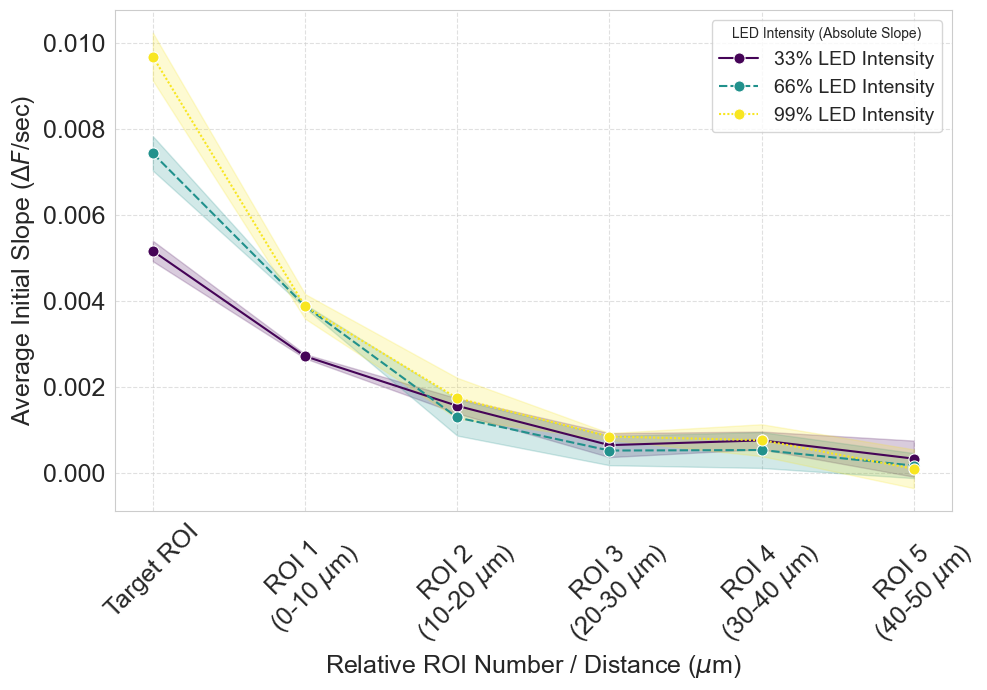

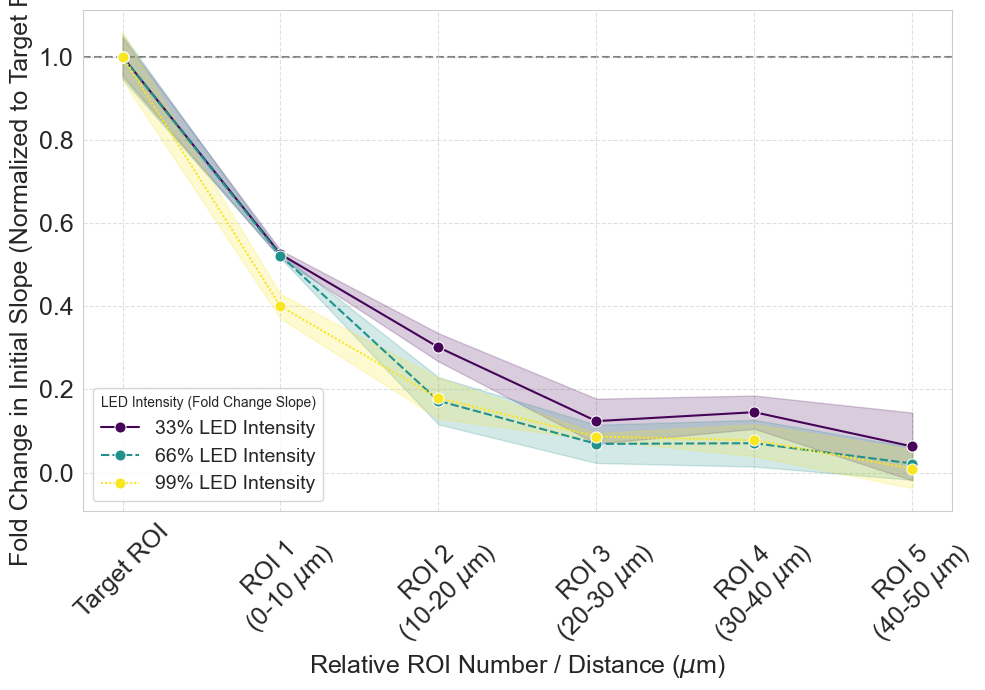

/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/1097377196.py:191: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/1097377196.py:191: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/1097377196.py:191: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)


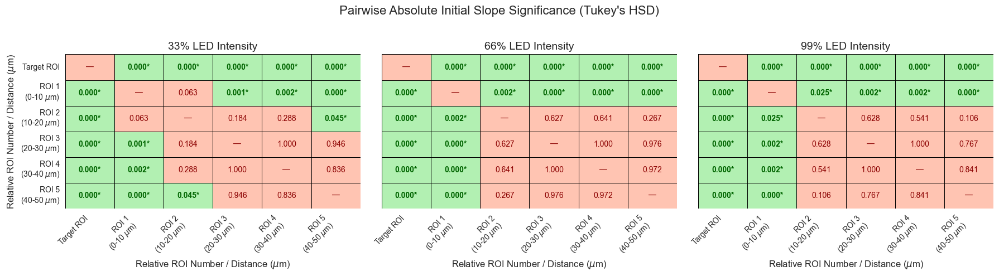

In [111]:
# PLOTTING: Initial Slopes
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from scipy.stats import linregress
from matplotlib import colormaps, colors
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from matplotlib.colors import ListedColormap

# --- Data Check and Initialization (ASSUMES 'all_biological_replicates_avg_data' IS LOADED) ---
# NOTE: This code assumes the variable 'all_biological_replicates_avg_data' has been loaded 
# in the environment prior to execution.
num_total_time_frames_available = all_biological_replicates_avg_data.shape[0]
num_biological_replicates = all_biological_replicates_avg_data.shape[2]
    
frame_interval_seconds = 10 # Example: 10 seconds per frame (0.1 Hz)
frames_to_include_for_slope = 2 # USER INPUT
duration_for_slope_seconds = frames_to_include_for_slope * frame_interval_seconds
alpha = 0.05
color_significant = "#B2F0B2" # Pastel Green
color_not_significant = "#FFC4B2" # Pastel Red
cmap_binary = ListedColormap([color_significant, color_not_significant])

# --- Function to calculate slope for normalized data (retained) ---
def calculate_normalized_slopes(data_segment_per_replicate, frames_for_fit, interval_sec):
    """Calculates the linear slope for each biological replicate, normalized to its starting value."""
    if frames_for_fit < 0:
        return [np.nan] * data_segment_per_replicate.shape[1]
    num_points_to_fit = frames_for_fit + 1
    if data_segment_per_replicate.shape[0] < num_points_to_fit:
        return [np.nan] * data_segment_per_replicate.shape[1]
    slopes = []
    x_for_regression_seconds = np.arange(num_points_to_fit) * interval_sec
    for rep_idx in range(data_segment_per_replicate.shape[1]):
        y_raw_segment = data_segment_per_replicate[:num_points_to_fit, rep_idx]
        if np.all(np.isnan(y_raw_segment)):
            slopes.append(np.nan)
            continue
        baseline_value = y_raw_segment[0]
        y_normalized_segment = y_raw_segment - baseline_value
        if len(np.unique(y_normalized_segment)) <= 1:
            slopes.append(0.0)
        else:
            slope, _, _, _, _ = linregress(x_for_regression_seconds, y_normalized_segment)
            slopes.append(slope)
    return slopes


# --- Configuration for ROI Grouping and Time Windows ---
roi_plotting_groups_and_windows = {
    '33% LED Intensity': {'roi_0based_indices': list(range(10, 16)), 'time_window_sec': [240, 420]},
    '66% LED Intensity': {'roi_0based_indices': list(range(16, 22)), 'time_window_sec': [420, 600]},
    '99% LED Intensity': {'roi_0based_indices': list(range(22, 28)), 'time_window_sec': [600, 720]}
}

# --- Data Collection (Slope Calculation) ---
all_slopes_data = []
intensity_labels = []
relative_roi_labels = []

print(f"\nCalculating slopes for the first {frames_to_include_for_slope + 1} frames (approx. {duration_for_slope_seconds} seconds)...")

for intensity_label, group_info in roi_plotting_groups_and_windows.items():
    roi_0based_indices = group_info['roi_0based_indices']
    start_sec_window = group_info['time_window_sec'][0]
    start_frame_idx_abs_group = int(np.floor(start_sec_window / frame_interval_seconds))

    for i, roi_idx_0based in enumerate(roi_0based_indices):
        relative_roi_number = i + 1
        if roi_idx_0based >= all_biological_replicates_avg_data.shape[1]: continue 

        actual_segment_start_frame = start_frame_idx_abs_group
        segment_required_frames = frames_to_include_for_slope + 1
        actual_segment_end_frame = min(actual_segment_start_frame + segment_required_frames, 
                                       num_total_time_frames_available)

        current_roi_segment_data_full = all_biological_replicates_avg_data[
            actual_segment_start_frame : actual_segment_end_frame,
            roi_idx_0based,
            :
        ]
        current_replicate_slopes = calculate_normalized_slopes(
            current_roi_segment_data_full, frames_to_include_for_slope, frame_interval_seconds
        )
        all_slopes_data.extend(current_replicate_slopes)
        intensity_labels.extend([intensity_label] * num_biological_replicates)
        relative_roi_labels.extend([relative_roi_number] * num_biological_replicates)

# Create base DataFrame
df_slopes = pd.DataFrame({
    "Slope": all_slopes_data,
    "LED Intensity": intensity_labels,
    "Relative ROI Number": relative_roi_labels
}).dropna(subset=["Slope"])

# --- Normalization (Fold Change Calculation) ---
df_slopes["Normalized Slope"] = np.nan
for intensity_label in df_slopes["LED Intensity"].unique():
    group_df = df_slopes[df_slopes["LED Intensity"] == intensity_label]
    roi1_slopes = group_df[group_df["Relative ROI Number"] == 1]["Slope"]
    if roi1_slopes.empty or np.isclose(roi1_slopes.mean(), 0): continue
    normalization_factor = roi1_slopes.mean()
    normalized_values = group_df["Slope"] / normalization_factor
    df_slopes.loc[group_df.index, "Normalized Slope"] = normalized_values
df_slopes.dropna(subset=["Normalized Slope"], inplace=True)


# --- Shared Plotting Setup ---
sns.set_style("whitegrid")
cmap_group = colormaps.get_cmap('viridis')
group_plot_colors = [cmap_group(0.01), cmap_group(0.5), cmap_group(0.99)] # Distinct colors for 3 groups

intensity_group_colors = {
    '33% LED Intensity': group_plot_colors[0],
    '66% LED Intensity': group_plot_colors[1],
    '99% LED Intensity': group_plot_colors[2]
}

if not df_slopes.empty:
    max_relative_roi = df_slopes["Relative ROI Number"].max()
    
    # --- MODIFIED LABEL GENERATION (Target ROI with NO sub-label) ---
    distance_labels = []
    # Loop from 10 to (max_relative_roi * 10), stepping by 10 (10, 20, 30, 40, 50)
    for m in range(10, int(max_relative_roi) * 10, 10):
        # Format: (m-10)-m µm
        distance_labels.append(f"({(m-10)}-{m} $\\mu$m)")
        
    # The first element (Relative ROI Number 1) is Target ROI with NO sub-label
    target_roi_label = "Target ROI"
    
    # The remaining elements (Relative ROI Number 2 -> ROI 1, etc.)
    # The label needs to be "ROI N" where N is the index of the distance label list.
    labels = [target_roi_label] + \
             [f"ROI {i}\n" + distance_labels[i-1] for i in range(1, int(max_relative_roi))]
             
    max_relative_roi_val = int(max_relative_roi)
    # --- END MODIFIED LABEL GENERATION ---

else:
    labels = []
    max_relative_roi_val = 0


# --- FUNCTION FOR TUKEY'S HSD HEATMAP GENERATION ---
def plot_tukey_heatmap(df, metric_col, intensity_label, ax, roi_labels, alpha=0.05, is_first=False):
    """Calculates Tukey's HSD and plots the resulting heatmap on the given axis."""
    group_df = df[df["LED Intensity"] == intensity_label].copy()
    unique_rois = group_df["Relative ROI Number"].unique()
    unique_rois.sort()
    
    if len(unique_rois) < 2 or group_df[metric_col].isnull().all():
        ax.set_title(f"{intensity_label}\nInsufficient Data", fontsize=14)
        ax.axis('off')
        return

    # TUKEY'S HSD
    tukey_results = pairwise_tukeyhsd(
        endog=group_df[metric_col], 
        groups=group_df['Relative ROI Number'].astype(str),
        alpha=alpha
    )
    df_tukey = pd.DataFrame(data=tukey_results._results_table.data[1:], 
                            columns=tukey_results._results_table.data[0])
    
    # HEATMAP MATRIX CREATION
    roi_labels_str = [str(r) for r in unique_rois]
    p_matrix_tukey = pd.DataFrame(index=roi_labels_str, columns=roi_labels_str, dtype=float)
    p_value_text_matrix = pd.DataFrame(index=roi_labels_str, columns=roi_labels_str, dtype=str)

    for _, row in df_tukey.iterrows():
        group1 = row['group1']
        group2 = row['group2']
        p_adj = row['p-adj']
        
        p_matrix_tukey.loc[group1, group2] = p_adj
        p_matrix_tukey.loc[group2, group1] = p_adj
        
        text_label = f"{p_adj:.3f}"
        if row['reject']:
            text_label += "*"
        p_value_text_matrix.loc[group1, group2] = text_label
        p_value_text_matrix.loc[group2, group1] = text_label

    np.fill_diagonal(p_matrix_tukey.values, 1.0)
    for label_str in roi_labels_str:
        p_value_text_matrix.loc[label_str, label_str] = "—"

    # HEATMAP PLOTTING
    coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)

    sns.heatmap(
        coloring_matrix,
        annot=p_value_text_matrix,
        fmt='s',
        cmap=cmap_binary,
        vmin=0, vmax=1,
        linewidths=0.5, 
        linecolor='black',
        cbar=False,
        annot_kws={"size": 8 if len(roi_labels) > 6 else 10},
        xticklabels=roi_labels, 
        yticklabels=roi_labels,
        ax=ax
    )
    
    # Apply custom coloring to the annotations
    for text in ax.texts:
        if "*" in text.get_text():
            text.set_color('darkgreen')
            text.set_weight('bold')
        else:
            text.set_color('darkred') 

    ax.set_title(f"{intensity_label}", fontsize=14)
    ax.set_xlabel("Relative ROI Number / Distance ($\mu$m)", fontsize=12) 
    
    # --- Y-Axis Labeling Control ---
    if is_first:
        ax.set_ylabel("Relative ROI Number / Distance ($\mu$m)", fontsize=12) 
    else:
        ax.set_ylabel("")
        ax.tick_params(axis='y', labelleft=False)
        
    # --- Tick Rotation and Alignment Control ---
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    ax.tick_params(axis='y', rotation=0)


# --- PLOT 1: Absolute Slope (Single Plot for all groups) ---
fig_abs, ax_abs = plt.subplots(figsize=(10, 7))
sns.lineplot(
    data=df_slopes, x="Relative ROI Number", y="Slope", hue="LED Intensity", style="LED Intensity",
    palette=intensity_group_colors, marker='o', markersize=8, errorbar='se', ax=ax_abs
)
if labels:
    ax_abs.set_xticks(range(1, max_relative_roi_val + 1))
    ax_abs.set_xticklabels(labels)
    ax_abs.tick_params(axis='x', rotation=45)
ax_abs.tick_params(axis='both', which='major', labelsize=18)
ax_abs.set_xlabel(r"Relative ROI Number / Distance ($\mu$m)", fontsize=18)
ax_abs.set_ylabel(r"Average Initial Slope ($\Delta F$/sec)", fontsize=18)
ax_abs.grid(True, linestyle='--', alpha=0.6)
plt.legend(fontsize=14, title="LED Intensity (Absolute Slope)")
plt.tight_layout()
plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/Figure_Slope_Absolute.svg", format="svg")
plt.show()


# --- PLOT 2: Normalized Slope (Single Plot for all groups) ---
fig_norm, ax_norm = plt.subplots(figsize=(10, 7))
sns.lineplot(
    data=df_slopes, x="Relative ROI Number", y="Normalized Slope", hue="LED Intensity", style="LED Intensity",
    palette=intensity_group_colors, marker='o', markersize=8, errorbar='se', ax=ax_norm
)
ax_norm.axhline(1.0, color='gray', linestyle='--', linewidth=1.5, zorder=0)
if labels:
    ax_norm.set_xticks(range(1, max_relative_roi_val + 1))
    ax_norm.set_xticklabels(labels)
    ax_norm.tick_params(axis='x', rotation=45)
ax_norm.tick_params(axis='both', which='major', labelsize=18)
ax_norm.set_xlabel(r"Relative ROI Number / Distance ($\mu$m)", fontsize=18)
ax_norm.set_ylabel(r"Fold Change in Initial Slope (Normalized to Target ROI)", fontsize=18)
ax_norm.grid(True, linestyle='--', alpha=0.6)
plt.legend(fontsize=14, title="LED Intensity (Fold Change Slope)")
plt.tight_layout()
plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/Figure_Slope_FoldChange.svg", format="svg")
plt.show()


# --- PLOT 3: Combined Tukey HSD Heatmaps (Absolute Slope ONLY) ---
fig_t_abs, axes_t_abs = plt.subplots(1, 3, figsize=(18, 5))
intensity_groups = ['33% LED Intensity', '66% LED Intensity', '99% LED Intensity']

for i, intensity_label in enumerate(intensity_groups):
    plot_tukey_heatmap(df_slopes, 'Slope', intensity_label, axes_t_abs[i], labels, alpha, is_first=(i==0))
    
fig_t_abs.suptitle(r"Pairwise Absolute Initial Slope Significance (Tukey's HSD)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/Figure_Slope_Tukey_Absolute_Combined.svg", format="svg")
plt.show()


Calculating absolute intensity change (Delta F) over the full stimulation windows...


<>:220: SyntaxWarning: invalid escape sequence '\m'
<>:224: SyntaxWarning: invalid escape sequence '\m'
<>:250: SyntaxWarning: invalid escape sequence '\D'
<>:275: SyntaxWarning: invalid escape sequence '\D'
<>:220: SyntaxWarning: invalid escape sequence '\m'
<>:224: SyntaxWarning: invalid escape sequence '\m'
<>:250: SyntaxWarning: invalid escape sequence '\D'
<>:275: SyntaxWarning: invalid escape sequence '\D'
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/2642071937.py:220: SyntaxWarning: invalid escape sequence '\m'
  ax.set_xlabel("Relative ROI Number / Distance ($\mu$m)", fontsize=12)
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/2642071937.py:224: SyntaxWarning: invalid escape sequence '\m'
  ax.set_ylabel("Relative ROI Number / Distance ($\mu$m)", fontsize=12)
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/2642071937.py:250: SyntaxWarning: invalid escape sequence '\D'
  plt.legend(fontsize=14, title="LED Intensity (Absolute $\

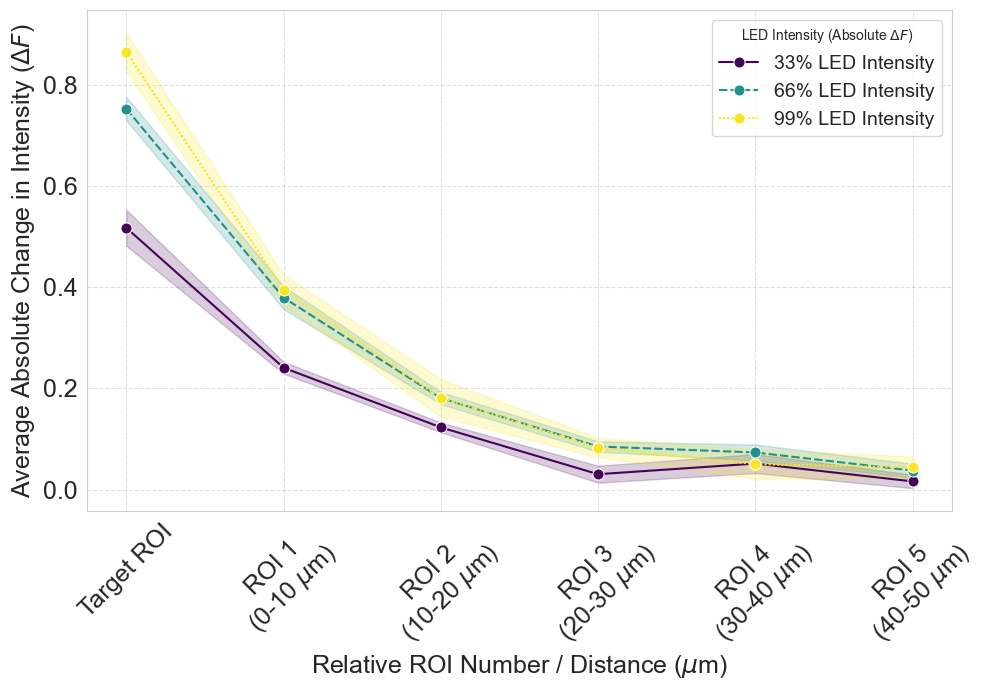

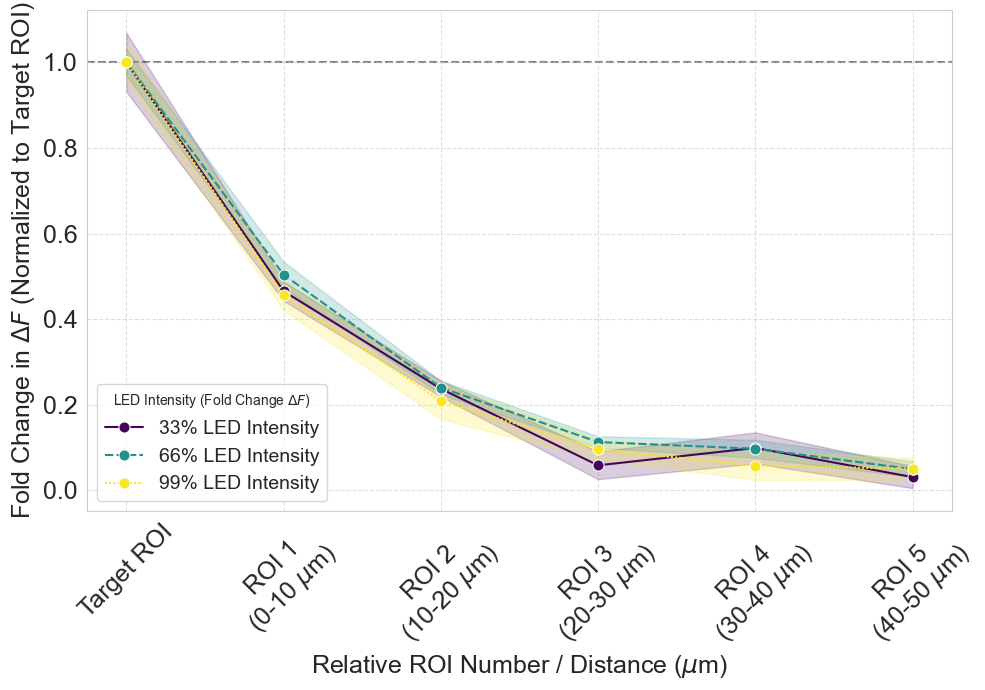

/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/2642071937.py:194: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/2642071937.py:194: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/2642071937.py:194: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)


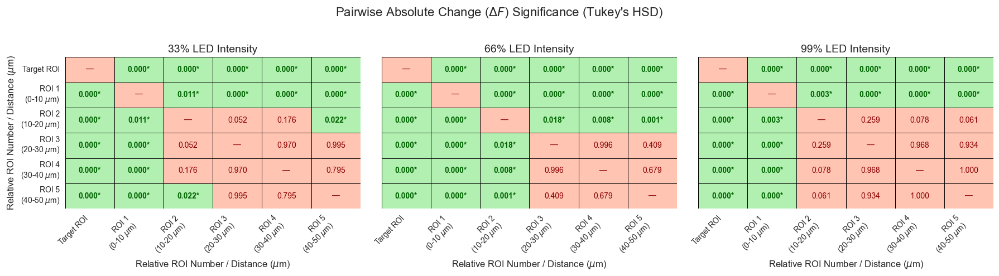

In [112]:
# PLOTTING: Absolute Change in Intensity (Delta F)

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib import colormaps, colors
from statsmodels.stats.multicomp import pairwise_tukeyhsd # For Tukey's HSD
from matplotlib.colors import ListedColormap # For binary colormap

# --- Data Check and Initialization (ASSUMES 'all_biological_replicates_avg_data' IS LOADED) ---
# NOTE: This code assumes the variable 'all_biological_replicates_avg_data' has been loaded 
# in the environment prior to execution.
num_total_time_frames_available = all_biological_replicates_avg_data.shape[0]
num_biological_replicates = all_biological_replicates_avg_data.shape[2]

frame_interval_seconds = 10 # Example: 10 seconds per frame (0.1 Hz)
alpha = 0.05
color_significant = "#B2F0B2" # Pastel Green
color_not_significant = "#FFC4B2" # Pastel Red
cmap_binary = ListedColormap([color_significant, color_not_significant])


# --- Function to calculate absolute change in intensity (End - Start) ---
def calculate_absolute_change(data_segment_per_replicate):
    """Calculates the absolute intensity change (F_end - F_start) for each biological replicate."""
    changes = []
    if data_segment_per_replicate.shape[0] < 2:
        return [np.nan] * data_segment_per_replicate.shape[1] if data_segment_per_replicate.ndim == 2 else [np.nan]

    for rep_idx in range(data_segment_per_replicate.shape[1]):
        y_start = data_segment_per_replicate[0, rep_idx]
        y_end = data_segment_per_replicate[-1, rep_idx]

        if np.isnan(y_start) or np.isnan(y_end):
            changes.append(np.nan)
        else:
            changes.append(y_end - y_start)
    return changes

# --- Configuration for ROI Grouping and Time Windows for Absolute Change Calculation ---
# Windows: 4-7min, 7-10min, 10-13min
roi_plotting_groups_and_windows_delta_f = {
    '33% LED Intensity': {
        'roi_0based_indices': list(range(10, 16)),
        'time_window_sec': [240, 420]
    },
    '66% LED Intensity': {
        'roi_0based_indices': list(range(16, 22)),
        'time_window_sec': [420, 600]
    },
    '99% LED Intensity': {
        'roi_0based_indices': list(range(22, 28)),
        'time_window_sec': [600, 780]
    }
}

# --- Data Collection (Delta F Calculation) ---
all_delta_f_data = []
intensity_labels = []
relative_roi_labels = []

print(f"\nCalculating absolute intensity change (Delta F) over the full stimulation windows...")

for intensity_label, group_info in roi_plotting_groups_and_windows_delta_f.items():
    roi_0based_indices = group_info['roi_0based_indices']
    start_sec_window, end_sec_window = group_info['time_window_sec']

    start_frame_idx_abs = int(np.floor(start_sec_window / frame_interval_seconds))
    end_frame_idx_abs = int(np.round(end_sec_window / frame_interval_seconds))

    for i, roi_idx_0based in enumerate(roi_0based_indices):
        relative_roi_number = i + 1
        if roi_idx_0based >= all_biological_replicates_avg_data.shape[1]: continue
        
        actual_segment_end_frame = min(end_frame_idx_abs, num_total_time_frames_available - 1)
        
        current_roi_segment_data_full = all_biological_replicates_avg_data[
            start_frame_idx_abs : actual_segment_end_frame + 1,
            roi_idx_0based,
            :
        ]

        current_replicate_delta_f = calculate_absolute_change(current_roi_segment_data_full)
        all_delta_f_data.extend(current_replicate_delta_f)
        intensity_labels.extend([intensity_label] * num_biological_replicates)
        relative_roi_labels.extend([relative_roi_number] * num_biological_replicates)


# Create base DataFrame
df_delta_f = pd.DataFrame({
    "Delta F": all_delta_f_data,
    "LED Intensity": intensity_labels,
    "Relative ROI Number": relative_roi_labels
}).dropna(subset=["Delta F"])


# --- Normalization (Fold Change Delta F Calculation) ---
df_delta_f["Fold Change Delta F"] = np.nan

for intensity_label in df_delta_f["LED Intensity"].unique():
    group_df = df_delta_f[df_delta_f["LED Intensity"] == intensity_label]
    roi1_delta_f = group_df[group_df["Relative ROI Number"] == 1]["Delta F"]
    
    if roi1_delta_f.empty or np.isclose(roi1_delta_f.mean(), 0): continue
    normalization_factor = roi1_delta_f.mean()
    normalized_values = group_df["Delta F"] / normalization_factor
    df_delta_f.loc[group_df.index, "Fold Change Delta F"] = normalized_values

df_delta_f.dropna(subset=["Fold Change Delta F"], inplace=True)

# --- Shared Plotting Setup ---
sns.set_style("whitegrid")
cmap_group = colormaps.get_cmap('viridis')
group_plot_colors = [cmap_group(0.01), cmap_group(0.5), cmap_group(0.99)] # Distinct colors for 3 groups

intensity_group_colors = {
    '33% LED Intensity': group_plot_colors[0],
    '66% LED Intensity': group_plot_colors[1],
    '99% LED Intensity': group_plot_colors[2]
}

if not df_delta_f.empty:
    max_relative_roi = df_delta_f["Relative ROI Number"].max()
    
    # --- MODIFIED LABEL GENERATION (Target ROI with NO sub-label) ---
    distance_labels = []
    # Loop from 10 to (max_relative_roi * 10), stepping by 10 (10, 20, 30, 40, 50)
    for m in range(10, int(max_relative_roi) * 10, 10):
        # Format: (m-10)-m µm
        distance_labels.append(f"({(m-10)}-{m} $\\mu$m)")
        
    # The first element (Relative ROI Number 1) is Target ROI with NO sub-label
    target_roi_label = "Target ROI"
    
    # The remaining elements (Relative ROI Number 2 -> ROI 1, etc.)
    # The label needs to be "ROI N" where N is the index of the distance label list.
    labels = [target_roi_label] + \
             [f"ROI {i}\n" + distance_labels[i-1] for i in range(1, int(max_relative_roi))]
             
    max_relative_roi_val = int(max_relative_roi)
    # --- END MODIFIED LABEL GENERATION ---

else:
    labels = []
    max_relative_roi_val = 0


# --- FUNCTION FOR TUKEY'S HSD HEATMAP GENERATION ---
def plot_tukey_heatmap(df, metric_col, intensity_label, ax, roi_labels, alpha=0.05, is_first=False):
    """Calculates Tukey's HSD and plots the resulting heatmap on the given axis."""
    group_df = df[df["LED Intensity"] == intensity_label].copy()
    unique_rois = group_df["Relative ROI Number"].unique()
    unique_rois.sort()
    
    if len(unique_rois) < 2 or group_df[metric_col].isnull().all():
        ax.set_title(f"{intensity_label}\nInsufficient Data", fontsize=14)
        ax.axis('off')
        return

    # TUKEY'S HSD
    tukey_results = pairwise_tukeyhsd(
        endog=group_df[metric_col], 
        groups=group_df['Relative ROI Number'].astype(str),
        alpha=alpha
    )
    df_tukey = pd.DataFrame(data=tukey_results._results_table.data[1:], 
                            columns=tukey_results._results_table.data[0])
    
    # HEATMAP MATRIX CREATION
    roi_labels_str = [str(r) for r in unique_rois]
    p_matrix_tukey = pd.DataFrame(index=roi_labels_str, columns=roi_labels_str, dtype=float)
    p_value_text_matrix = pd.DataFrame(index=roi_labels_str, columns=roi_labels_str, dtype=str)

    for _, row in df_tukey.iterrows():
        group1 = row['group1']
        group2 = row['group2']
        p_adj = row['p-adj']
        
        p_matrix_tukey.loc[group1, group2] = p_adj
        p_matrix_tukey.loc[group2, group1] = p_adj
        
        text_label = f"{p_adj:.3f}"
        if row['reject']:
            text_label += "*"
        p_value_text_matrix.loc[group1, group2] = text_label
        p_value_text_matrix.loc[group2, group1] = text_label

    np.fill_diagonal(p_matrix_tukey.values, 1.0)
    for label_str in roi_labels_str:
        p_value_text_matrix.loc[label_str, label_str] = "—"

    # HEATMAP PLOTTING
    coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)

    sns.heatmap(
        coloring_matrix,
        annot=p_value_text_matrix,
        fmt='s',
        cmap=cmap_binary,
        vmin=0, vmax=1,
        linewidths=0.5, 
        linecolor='black',
        cbar=False,
        annot_kws={"size": 8 if len(roi_labels) > 6 else 10},
        xticklabels=roi_labels, 
        yticklabels=roi_labels,
        ax=ax
    )
    
    # Apply custom coloring to the annotations
    for text in ax.texts:
        if "*" in text.get_text():
            text.set_color('darkgreen')
            text.set_weight('bold')
        else:
            text.set_color('darkred') 

    ax.set_title(f"{intensity_label}", fontsize=14)
    ax.set_xlabel("Relative ROI Number / Distance ($\mu$m)", fontsize=12) 
    
    # --- Y-Axis Labeling Control ---
    if is_first:
        ax.set_ylabel("Relative ROI Number / Distance ($\mu$m)", fontsize=12)
    else:
        ax.set_ylabel("")
        ax.tick_params(axis='y', labelleft=False)
        
    # --- Tick Rotation and Alignment Control ---
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    ax.tick_params(axis='y', rotation=0)

# --- PLOT 1: Absolute Delta F (Single Plot for all groups) ---
fig_abs, ax_abs = plt.subplots(figsize=(10, 7))

sns.lineplot(
    data=df_delta_f, x="Relative ROI Number", y="Delta F", hue="LED Intensity", style="LED Intensity",
    palette=intensity_group_colors, marker='o', markersize=8, errorbar='se', ax=ax_abs
)
if labels:
    ax_abs.set_xticks(range(1, max_relative_roi_val + 1))
    ax_abs.set_xticklabels(labels)
    ax_abs.tick_params(axis='x', rotation=45)

ax_abs.tick_params(axis='both', which='major', labelsize=18)
ax_abs.set_xlabel(r"Relative ROI Number / Distance ($\mu$m)", fontsize=18)
ax_abs.set_ylabel(r"Average Absolute Change in Intensity ($\Delta F$)", fontsize=18)
ax_abs.grid(True, linestyle='--', alpha=0.6)

plt.legend(fontsize=14, title="LED Intensity (Absolute $\Delta F$)")
plt.tight_layout()
plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/Figure_DeltaF_Absolute.svg", format="svg")
plt.show()


# --- PLOT 2: Normalized Delta F (Single Plot for all groups) ---
fig_norm, ax_norm = plt.subplots(figsize=(10, 7))

sns.lineplot(
    data=df_delta_f, x="Relative ROI Number", y="Fold Change Delta F", hue="LED Intensity", style="LED Intensity",
    palette=intensity_group_colors, marker='o', markersize=8, errorbar='se', ax=ax_norm
)
ax_norm.axhline(1.0, color='gray', linestyle='--', linewidth=1.5, zorder=0)

if labels:
    ax_norm.set_xticks(range(1, max_relative_roi_val + 1))
    ax_norm.set_xticklabels(labels)
    ax_norm.tick_params(axis='x', rotation=45)

ax_norm.tick_params(axis='both', which='major', labelsize=18)
ax_norm.set_xlabel(r"Relative ROI Number / Distance ($\mu$m)", fontsize=18)
ax_norm.set_ylabel(r"Fold Change in $\Delta F$ (Normalized to Target ROI)", fontsize=18)
ax_norm.grid(True, linestyle='--', alpha=0.6)

plt.legend(fontsize=14, title="LED Intensity (Fold Change $\Delta F$)")
plt.tight_layout()
plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/Figure_DeltaF_FoldChange.svg", format="svg")
plt.show()


# --- PLOT 3: Combined Tukey HSD Heatmaps (Absolute Delta F ONLY) ---
fig_t_abs, axes_t_abs = plt.subplots(1, 3, figsize=(18, 5))
intensity_groups = ['33% LED Intensity', '66% LED Intensity', '99% LED Intensity']

for i, intensity_label in enumerate(intensity_groups):
    plot_tukey_heatmap(df_delta_f, 'Delta F', intensity_label, axes_t_abs[i], labels, alpha, is_first=(i==0))
    
fig_t_abs.suptitle(r"Pairwise Absolute Change ($\Delta F$) Significance (Tukey's HSD)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/Figure_DeltaF_Tukey_Absolute_Combined.svg", format="svg")
plt.show()


Calculating Area Under the Curve (AUC) over the full stimulation windows...


<>:225: SyntaxWarning: invalid escape sequence '\m'
<>:230: SyntaxWarning: invalid escape sequence '\m'
<>:225: SyntaxWarning: invalid escape sequence '\m'
<>:230: SyntaxWarning: invalid escape sequence '\m'
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/804574731.py:225: SyntaxWarning: invalid escape sequence '\m'
  ax.set_xlabel("Relative ROI Number / Distance ($\mu$m)", fontsize=12)
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/804574731.py:230: SyntaxWarning: invalid escape sequence '\m'
  ax.set_ylabel("Relative ROI Number / Distance ($\mu$m)", fontsize=12)


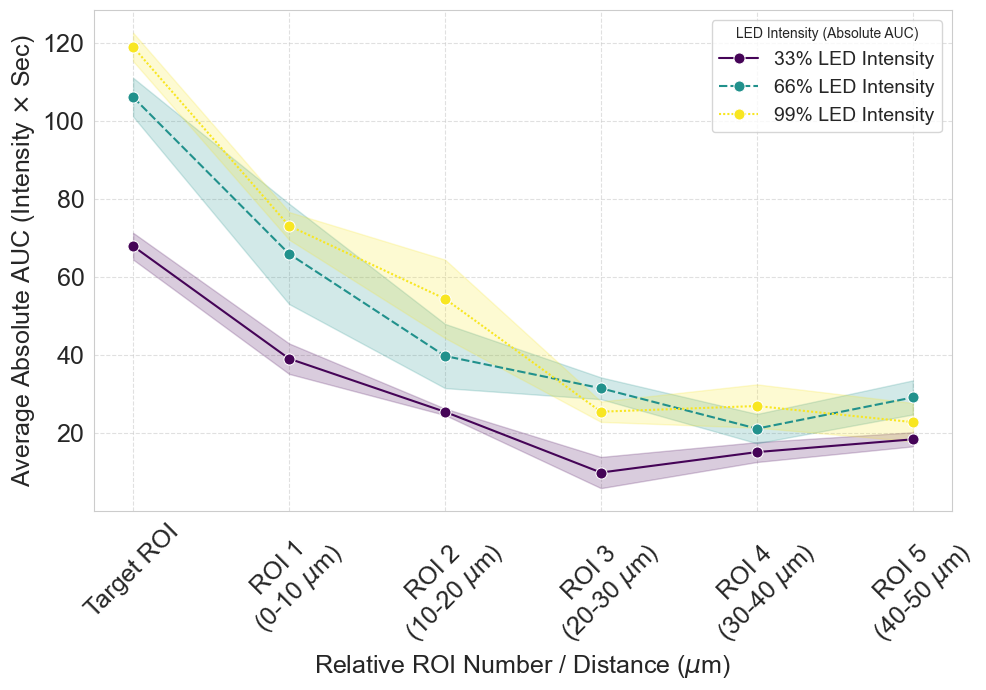

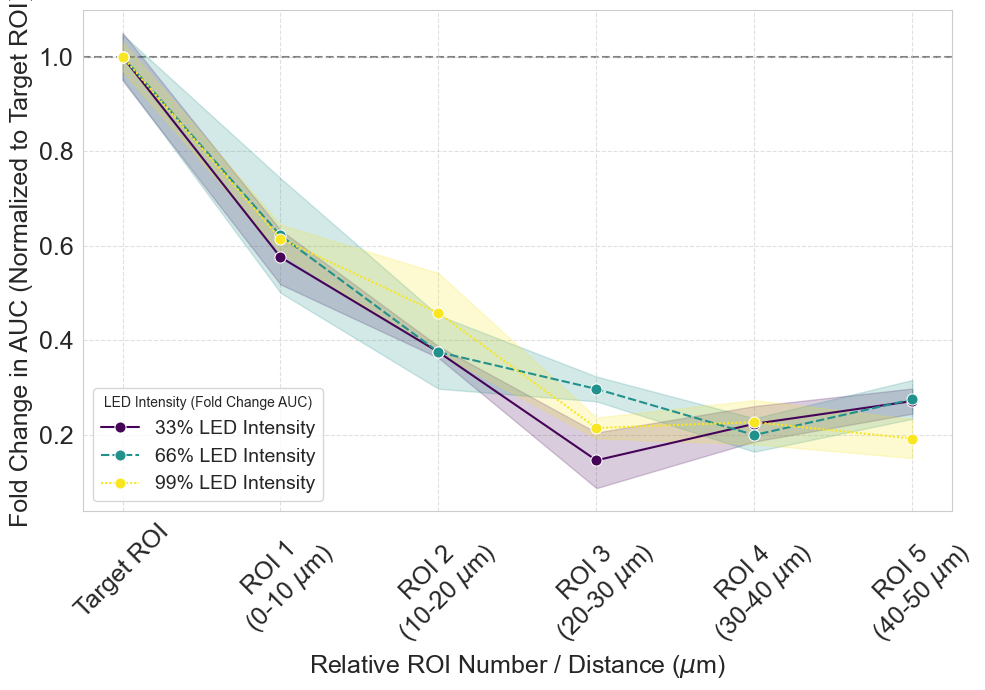

/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/804574731.py:198: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/804574731.py:198: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/804574731.py:198: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)


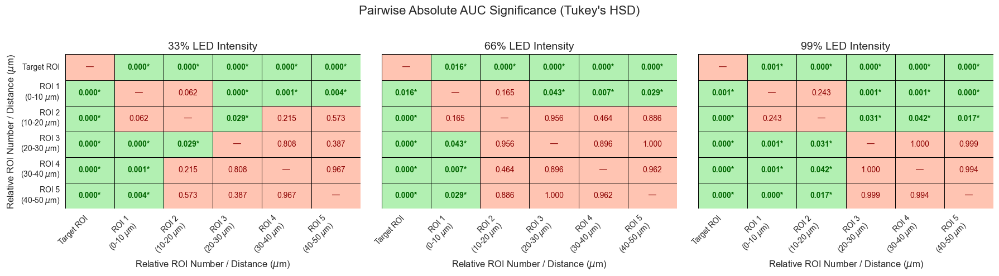

In [146]:
# PLOTTING: Area Under the Curve (AUC)

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib import colormaps, colors
from statsmodels.stats.multicomp import pairwise_tukeyhsd # For Tukey's HSD
from matplotlib.colors import ListedColormap # For binary colormap

# --- Data Check and Initialization (ASSUMES 'all_biological_replicates_avg_data' IS LOADED) ---
# NOTE: This code assumes the variable 'all_biological_replicates_avg_data' has been loaded 
# in the environment prior to execution.
num_total_time_frames_available = all_biological_replicates_avg_data.shape[0]
num_biological_replicates = all_biological_replicates_avg_data.shape[2]

frame_interval_seconds = 10 # Example: 10 seconds per frame (0.1 Hz)
alpha = 0.05
color_significant = "#B2F0B2" # Pastel Green
color_not_significant = "#FFC4B2" # Pastel Red
cmap_binary = ListedColormap([color_significant, color_not_significant])


# --- Function to calculate AUC (Net Area) ---
def calculate_auc(data_segment_per_replicate, interval_sec):
    """Calculates the area under the curve (net area) for each biological replicate using the trapezoidal rule."""
    aucs = []
    # If data segment is too short, return NaNs
    if data_segment_per_replicate.shape[0] < 2:
        return [np.nan] * data_segment_per_replicate.shape[1]

    for rep_idx in range(data_segment_per_replicate.shape[1]):
        y_segment = data_segment_per_replicate[:, rep_idx]
        
        if np.all(np.isnan(y_segment)):
            aucs.append(np.nan)
            continue
        
        # Calculate AUC using the trapezoidal rule (net area)
        auc = np.trapz(y_segment, dx=interval_sec)
        aucs.append(auc)
    return aucs

# --- Configuration for ROI Grouping and Time Windows for AUC Calculation ---
# Windows: 4-7min, 7-10min, 10-13min
roi_plotting_groups_and_windows_auc = {
    '33% LED Intensity': {
        'roi_0based_indices': list(range(10, 16)),
        'time_window_sec': [240, 420]
    },
    '66% LED Intensity': {
        'roi_0based_indices': list(range(16, 22)),
        'time_window_sec': [420, 600]
    },
    '99% LED Intensity': {
        'roi_0based_indices': list(range(22, 28)),
        'time_window_sec': [600, 780]
    }
}

# --- Data Collection (AUC Calculation) ---
all_auc_data = []
intensity_labels = []
relative_roi_labels = []

print(f"\nCalculating Area Under the Curve (AUC) over the full stimulation windows...")

for intensity_label, group_info in roi_plotting_groups_and_windows_auc.items():
    roi_0based_indices = group_info['roi_0based_indices']
    start_sec_window, end_sec_window = group_info['time_window_sec']

    start_frame_idx_abs = int(np.floor(start_sec_window / frame_interval_seconds))
    end_frame_idx_abs = int(np.round(end_sec_window / frame_interval_seconds))

    for i, roi_idx_0based in enumerate(roi_0based_indices):
        relative_roi_number = i + 1
        if roi_idx_0based >= all_biological_replicates_avg_data.shape[1]: continue
        
        # Add 1 to end_frame_idx_abs to include the end frame in the slice
        actual_segment_end_frame = min(end_frame_idx_abs, num_total_time_frames_available - 1)
        
        current_roi_segment_data_full = all_biological_replicates_avg_data[
            start_frame_idx_abs : actual_segment_end_frame + 1,
            roi_idx_0based,
            :
        ]

        current_replicate_auc = calculate_auc(current_roi_segment_data_full, frame_interval_seconds)
        all_auc_data.extend(current_replicate_auc)
        intensity_labels.extend([intensity_label] * num_biological_replicates)
        relative_roi_labels.extend([relative_roi_number] * num_biological_replicates)


# Create base DataFrame
df_auc = pd.DataFrame({
    "Absolute AUC": all_auc_data,
    "LED Intensity": intensity_labels,
    "Relative ROI Number": relative_roi_labels
}).dropna(subset=["Absolute AUC"])


# --- Normalization (Fold Change AUC Calculation) ---
df_auc["Fold Change AUC"] = np.nan

for intensity_label in df_auc["LED Intensity"].unique():
    group_df = df_auc[df_auc["LED Intensity"] == intensity_label]
    roi1_auc = group_df[group_df["Relative ROI Number"] == 1]["Absolute AUC"]
    
    if roi1_auc.empty or np.isclose(roi1_auc.mean(), 0): continue
    normalization_factor = roi1_auc.mean()
    normalized_values = group_df["Absolute AUC"] / normalization_factor
    df_auc.loc[group_df.index, "Fold Change AUC"] = normalized_values

df_auc.dropna(subset=["Fold Change AUC"], inplace=True)

# --- Shared Plotting Setup (Using Viridis Color Scheme) ---
sns.set_style("whitegrid")
cmap_group = colormaps.get_cmap('viridis')
group_plot_colors = [cmap_group(0.01), cmap_group(0.5), cmap_group(0.99)] # Distinct colors for 3 groups

intensity_group_colors = {
    '33% LED Intensity': group_plot_colors[0],
    '66% LED Intensity': group_plot_colors[1],
    '99% LED Intensity': group_plot_colors[2]
}

if not df_auc.empty:
    max_relative_roi = df_auc["Relative ROI Number"].max()
    
    # --- MODIFIED LABEL GENERATION (Target ROI with NO sub-label) ---
    distance_labels = []
    # Loop from 10 to (max_relative_roi * 10), stepping by 10 (10, 20, 30, 40, 50)
    for m in range(10, int(max_relative_roi) * 10, 10):
        # Format: (m-10)-m µm
        distance_labels.append(f"({(m-10)}-{m} $\\mu$m)")
        
    # The first element (Relative ROI Number 1) is Target ROI with NO sub-label
    target_roi_label = "Target ROI"
    
    # The remaining elements (Relative ROI Number 2 -> ROI 1, etc.)
    # The label needs to be "ROI N" where N is the index of the distance label list.
    labels = [target_roi_label] + \
             [f"ROI {i}\n" + distance_labels[i-1] for i in range(1, int(max_relative_roi))]
             
    max_relative_roi_val = int(max_relative_roi)
    # --- END MODIFIED LABEL GENERATION ---

else:
    labels = []
    max_relative_roi_val = 0


# --- FUNCTION FOR TUKEY'S HSD HEATMAP GENERATION (REUSED) ---
def plot_tukey_heatmap(df, metric_col, intensity_label, ax, roi_labels, alpha=0.05, is_first=False):
    """Calculates Tukey's HSD and plots the resulting heatmap on the given axis."""
    group_df = df[df["LED Intensity"] == intensity_label].copy()
    unique_rois = group_df["Relative ROI Number"].unique()
    unique_rois.sort()
    
    if len(unique_rois) < 2 or group_df[metric_col].isnull().all():
        ax.set_title(f"{intensity_label}\nInsufficient Data", fontsize=14)
        ax.axis('off')
        return

    # TUKEY'S HSD
    tukey_results = pairwise_tukeyhsd(
        endog=group_df[metric_col], 
        groups=group_df['Relative ROI Number'].astype(str),
        alpha=alpha
    )
    df_tukey = pd.DataFrame(data=tukey_results._results_table.data[1:], 
                            columns=tukey_results._results_table.data[0])
    
    # HEATMAP MATRIX CREATION
    roi_labels_str = [str(r) for r in unique_rois]
    p_matrix_tukey = pd.DataFrame(index=roi_labels_str, columns=roi_labels_str, dtype=float)
    p_value_text_matrix = pd.DataFrame(index=roi_labels_str, columns=roi_labels_str, dtype=str)

    for _, row in df_tukey.iterrows():
        group1 = row['group1']
        group2 = row['group2']
        p_adj = row['p-adj']
        
        p_matrix_tukey.loc[group1, group2] = p_adj
        p_matrix_tukey.loc[group2, group1] = p_adj
        
        text_label = f"{p_adj:.3f}"
        if row['reject']:
            text_label += "*"
        p_value_text_matrix.loc[group1, group2] = text_label
        p_value_text_matrix.loc[group2, group1] = text_label

    np.fill_diagonal(p_matrix_tukey.values, 1.0)
    for label_str in roi_labels_str:
        p_value_text_matrix.loc[label_str, label_str] = "—"

    # HEATMAP PLOTTING
    coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)

    sns.heatmap(
        coloring_matrix,
        annot=p_value_text_matrix,
        fmt='s',
        cmap=cmap_binary,
        vmin=0, vmax=1,
        linewidths=0.5, 
        linecolor='black',
        cbar=False,
        annot_kws={"size": 8 if len(roi_labels) > 6 else 10},
        xticklabels=roi_labels,
        yticklabels=roi_labels,
        ax=ax
    )
    
    # Apply custom coloring to the annotations
    for text in ax.texts:
        if "*" in text.get_text():
            text.set_color('darkgreen')
            text.set_weight('bold')
        else:
            text.set_color('darkred') 

    ax.set_title(f"{intensity_label}", fontsize=14)
    # Updated X-axis label
    ax.set_xlabel("Relative ROI Number / Distance ($\mu$m)", fontsize=12)
    
    # --- Y-Axis Labeling Control ---
    if is_first:
        # Updated Y-axis label
        ax.set_ylabel("Relative ROI Number / Distance ($\mu$m)", fontsize=12)
    else:
        ax.set_ylabel("")
        # Remove y-tick labels for non-first columns
        ax.tick_params(axis='y', labelleft=False)
        
    # --- Tick Rotation and Alignment Control ---
    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    ax.tick_params(axis='y', rotation=0)

# --- PLOT 1: Absolute AUC (Single Plot for all groups) ---
fig_abs, ax_abs = plt.subplots(figsize=(10, 7))

sns.lineplot(
    data=df_auc, x="Relative ROI Number", y="Absolute AUC", hue="LED Intensity", style="LED Intensity",
    palette=intensity_group_colors, marker='o', markersize=8, errorbar='se', ax=ax_abs
)
if labels:
    ax_abs.set_xticks(range(1, int(max_relative_roi_val) + 1))
    ax_abs.set_xticklabels(labels)
    ax_abs.tick_params(axis='x', rotation=45)

ax_abs.tick_params(axis='both', which='major', labelsize=18)
# Updated X-axis label
ax_abs.set_xlabel(r"Relative ROI Number / Distance ($\mu$m)", fontsize=18)
ax_abs.set_ylabel(r"Average Absolute AUC (Intensity $\times$ Sec)", fontsize=18)
ax_abs.grid(True, linestyle='--', alpha=0.6)

plt.legend(fontsize=14, title="LED Intensity (Absolute AUC)")
plt.tight_layout()
plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/Figure_AUC_Absolute.svg", format="svg")
plt.show()


# --- PLOT 2: Normalized AUC (Single Plot for all groups) ---
fig_norm, ax_norm = plt.subplots(figsize=(10, 7))

sns.lineplot(
    data=df_auc, x="Relative ROI Number", y="Fold Change AUC", hue="LED Intensity", style="LED Intensity",
    palette=intensity_group_colors, marker='o', markersize=8, errorbar='se', ax=ax_norm
)
ax_norm.axhline(1.0, color='gray', linestyle='--', linewidth=1.5, zorder=0)

if labels:
    ax_norm.set_xticks(range(1, int(max_relative_roi_val) + 1))
    ax_norm.set_xticklabels(labels)
    ax_norm.tick_params(axis='x', rotation=45)

ax_norm.tick_params(axis='both', which='major', labelsize=18)
# Updated X-axis label
ax_norm.set_xlabel(r"Relative ROI Number / Distance ($\mu$m)", fontsize=18)
ax_norm.set_ylabel(r"Fold Change in AUC (Normalized to Target ROI)", fontsize=18)
ax_norm.grid(True, linestyle='--', alpha=0.6)

plt.legend(fontsize=14, title="LED Intensity (Fold Change AUC)")
plt.tight_layout()
plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/Figure_AUC_FoldChange.svg", format="svg")
plt.show()


# --- PLOT 3: Combined Tukey HSD Heatmaps (Absolute AUC ONLY) ---
fig_t_abs, axes_t_abs = plt.subplots(1, 3, figsize=(18, 5))
intensity_groups = ['33% LED Intensity', '66% LED Intensity', '99% LED Intensity']

for i, intensity_label in enumerate(intensity_groups):
    # Pass 'is_first=True' only for the first subplot (i=0) to label the y-axis
    plot_tukey_heatmap(df_auc, 'Absolute AUC', intensity_label, axes_t_abs[i], labels, alpha, is_first=(i==0))
    
fig_t_abs.suptitle(r"Pairwise Absolute AUC Significance (Tukey's HSD)", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/Figure_AUC_Tukey_Absolute_Combined.svg", format="svg")
plt.show()

## - Stats Analysis

In [114]:
# Two-Way ANOVA Analysis for Interaction Effects

import numpy as np
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols
import sys 

# --- 0. CRITICAL DATA CHECK (ASSUMED LOCALLY DEFINED) ---
required_dfs = ['df_auc', 'df_slopes', 'df_delta_f']

try:
    current_vars = set(locals().keys()) | set(globals().keys())
    missing_dfs = [df_name for df_name in required_dfs if df_name not in current_vars]
    
    if missing_dfs:
        print(f"[CRITICAL ERROR] The following required DataFrames are NOT defined: {', '.join(missing_dfs)}.")
        sys.exit() 

    df_auc = locals().get('df_auc', None)
    df_slopes = locals().get('df_slopes', None)
    df_delta_f = locals().get('df_delta_f', None)

except Exception as e:
    print(f"[CRITICAL ERROR] Could not perform data check: {e}")
    sys.exit()


# --- 1. Define Analysis List ---
# List of (DataFrame, Dependent Variable Column, Title)
analysis_list = [
    (df_auc, 'Absolute AUC', "Two-Way ANOVA on Absolute AUC"),
    (df_slopes, 'Slope', "Two-Way ANOVA on Absolute Initial Slope"),
    (df_delta_f, 'Delta F', "Two-Way ANOVA on Absolute Delta F")
]

# --- 2. Iterative ANOVA Function ---
def run_two_way_anova(df_input, y_col, title):
    
    if df_input is None or df_input.empty:
        print(f"Skipping analysis for '{title}' due to empty or invalid DataFrame.")
        return

    # Ensure factors are treated as categorical strings for ANOVA
    df = df_input.copy()
    # The Q() function is crucial here to handle spaces in column names.
    # C() ensures the factor is treated as categorical.
    
    # Formula construction using Q() for columns with spaces
    formula = f"Q('{y_col}') ~ C(Q('LED Intensity')) * C(Q('Relative ROI Number'))"

    # Fit the OLS model
    model = ols(formula, data=df).fit()

    # Perform the ANOVA (Type 3 Sum of Squares)
    anova_table = sm.stats.anova_lm(model, typ=3)
    
    # Clean up and display results
    print(f"\n{'='*60}\n{title}\n{'='*60}")
    
    # Format the P-value column for readability
    anova_table['PR(>F)'] = anova_table['PR(>F)'].apply(lambda x: f"{x:.4f}")
    
    print(anova_table.to_string())
    
    # Extract the key result: Interaction P-value (Need to use Q() in the index as well!)
    # Note: The index name will automatically use the Q() notation.
    interaction_p_str = anova_table.loc["C(Q('LED Intensity')):C(Q('Relative ROI Number'))", 'PR(>F)']
    interaction_p = float(interaction_p_str)
    
    print("\n--- Key Finding ---")
    print(f"Interaction (Intensity * Distance) P-value: {interaction_p_str}")
    if interaction_p < 0.05:
        print(f"CONCLUSION: The spatial decay curve IS significantly different across the LED Intensity groups (p < 0.05).")
        print("This confirms the difference in your exponential $\lambda$ values is statistically significant.")
    else:
        print(f"CONCLUSION: The spatial decay curve IS NOT significantly different across the LED Intensity groups (p > 0.05).")
        print("This suggests the differences in your exponential $\lambda$ values may not be statistically significant.")

# --- 3. Execute all analyses ---
for df, y_col, title in analysis_list:
    run_two_way_anova(df, y_col, title)


Two-Way ANOVA on Absolute AUC
                                                          sum_sq          df            F  PR(>F)
Intercept                                         13826.34234884  1.00000000 153.63598679  0.0000
C(Q('LED Intensity'))                              4226.94501886  2.00000000  23.48455046  0.0000
C(Q('Relative ROI Number'))                        6883.34388758  5.00000000  15.29731152  0.0000
C(Q('LED Intensity')):C(Q('Relative ROI Number'))  2560.87687024 10.00000000   2.84560323  0.0103
Residual                                           3239.78994095 36.00000000          NaN     nan

--- Key Finding ---
Interaction (Intensity * Distance) P-value: 0.0103
CONCLUSION: The spatial decay curve IS significantly different across the LED Intensity groups (p < 0.05).
This confirms the difference in your exponential $\lambda$ values is statistically significant.

Two-Way ANOVA on Absolute Initial Slope
                                                      sum_sq     

<>:75: SyntaxWarning: invalid escape sequence '\l'
<>:78: SyntaxWarning: invalid escape sequence '\l'
<>:75: SyntaxWarning: invalid escape sequence '\l'
<>:78: SyntaxWarning: invalid escape sequence '\l'
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/4137483169.py:75: SyntaxWarning: invalid escape sequence '\l'
  print("This confirms the difference in your exponential $\lambda$ values is statistically significant.")
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/4137483169.py:78: SyntaxWarning: invalid escape sequence '\l'
  print("This suggests the differences in your exponential $\lambda$ values may not be statistically significant.")


In [115]:
# Tukey's HSD Post-Hoc Analysis for Pairwise Comparisons

import numpy as np
import pandas as pd
from statsmodels.stats.multicomp import pairwise_tukeyhsd
import sys 

# --- 0. CRITICAL DATA CHECK (ASSUMED LOCALLY DEFINED) ---
required_dfs = ['df_auc', 'df_slopes', 'df_delta_f']

try:
    current_vars = set(locals().keys()) | set(globals().keys())
    missing_dfs = [df_name for df_name in required_dfs if df_name not in current_vars]
    
    if missing_dfs:
        print(f"[CRITICAL ERROR] The following required DataFrames are NOT defined: {', '.join(missing_dfs)}.")
        sys.exit() 

    df_auc = locals().get('df_auc', None)
    df_slopes = locals().get('df_slopes', None)
    df_delta_f = locals().get('df_delta_f', None)

except Exception as e:
    print(f"[CRITICAL ERROR] Could not perform data check: {e}")
    sys.exit()


# --- 1. Define Analysis List ---
# List of (DataFrame, Dependent Variable Column, Title)
analysis_list = [
    (df_auc, 'Absolute AUC', "Tukey's HSD on Absolute AUC (Intensity x ROI)"),
    (df_slopes, 'Slope', "Tukey's HSD on Absolute Initial Slope (Intensity x ROI)"),
    (df_delta_f, 'Delta F', "Tukey's HSD on Absolute Delta F (Intensity x ROI)")
]

# --- 2. Iterative Tukey's HSD Function ---
def run_tukey_hsd(df_input, y_col, title):
    
    if df_input is None or df_input.empty:
        print(f"Skipping analysis for '{title}' due to empty or invalid DataFrame.")
        return

    # Ensure factors are treated as strings for concatenation
    df = df_input.copy()
    df['LED Intensity'] = df['LED Intensity'].astype(str)
    df['Relative ROI Number'] = df['Relative ROI Number'].astype(str)

    # Create the single interaction group column: "Intensity-ROI"
    df['Interaction_Group'] = df['LED Intensity'] + '-' + df['Relative ROI Number']

    # Run Tukey's HSD
    # endog: the dependent variable (response magnitude)
    # groups: the single interaction factor
    try:
        tukey_results = pairwise_tukeyhsd(endog=df[y_col], 
                                          groups=df['Interaction_Group'], 
                                          alpha=0.05)
    except ValueError as e:
        print(f"\n[WARNING] Tukey's HSD failed for {y_col}. Check for identical group sizes or insufficient data variation. Error: {e}")
        return

    # Print results
    print(f"\n{'='*70}\n{title}\n{'='*70}")
    print(tukey_results)
    
    # Optional: Count and report significant pairs
    df_tukey = pd.DataFrame(data=tukey_results._results_table.data[1:], 
                            columns=tukey_results._results_table.data[0])
    num_significant = df_tukey['reject'].sum()
    total_pairs = len(df_tukey)
    
    print(f"\n--- Summary ---\nTotal pairwise comparisons: {total_pairs}")
    print(f"Number of significant pairs (P < 0.05): {num_significant}")
    print(f"This represents {num_significant/total_pairs:.1%} of all comparisons.")


# --- 3. Execute all analyses ---
for df, y_col, title in analysis_list:
    run_tukey_hsd(df, y_col, title)


Tukey's HSD on Absolute AUC (Intensity x ROI)
               Multiple Comparison of Means - Tukey HSD, FWER=0.05               
       group1              group2       meandiff p-adj    lower    upper   reject
---------------------------------------------------------------------------------
33% LED Intensity-1 33% LED Intensity-2 -28.8097 0.0539  -57.8588   0.2395  False
33% LED Intensity-1 33% LED Intensity-3 -42.4295 0.0004  -71.4786 -13.3803   True
33% LED Intensity-1 33% LED Intensity-4 -57.9841    0.0  -87.0332 -28.9349   True
33% LED Intensity-1 33% LED Intensity-5 -52.7422    0.0  -81.7914 -23.6931   True
33% LED Intensity-1 33% LED Intensity-6 -49.4734    0.0  -78.5226 -20.4243   True
33% LED Intensity-1 66% LED Intensity-1  38.1669 0.0021    9.1177   67.216   True
33% LED Intensity-1 66% LED Intensity-2  -1.9595    1.0  -31.0087  27.0896  False
33% LED Intensity-1 66% LED Intensity-3 -28.1262 0.0665  -57.1754   0.9229  False
33% LED Intensity-1 66% LED Intensity-4 -36.3956  0

Starting combined 18x18 Tukey's HSD heatmap generation for AUC, Slope, and Delta F...


/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/2003189285.py:135: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)


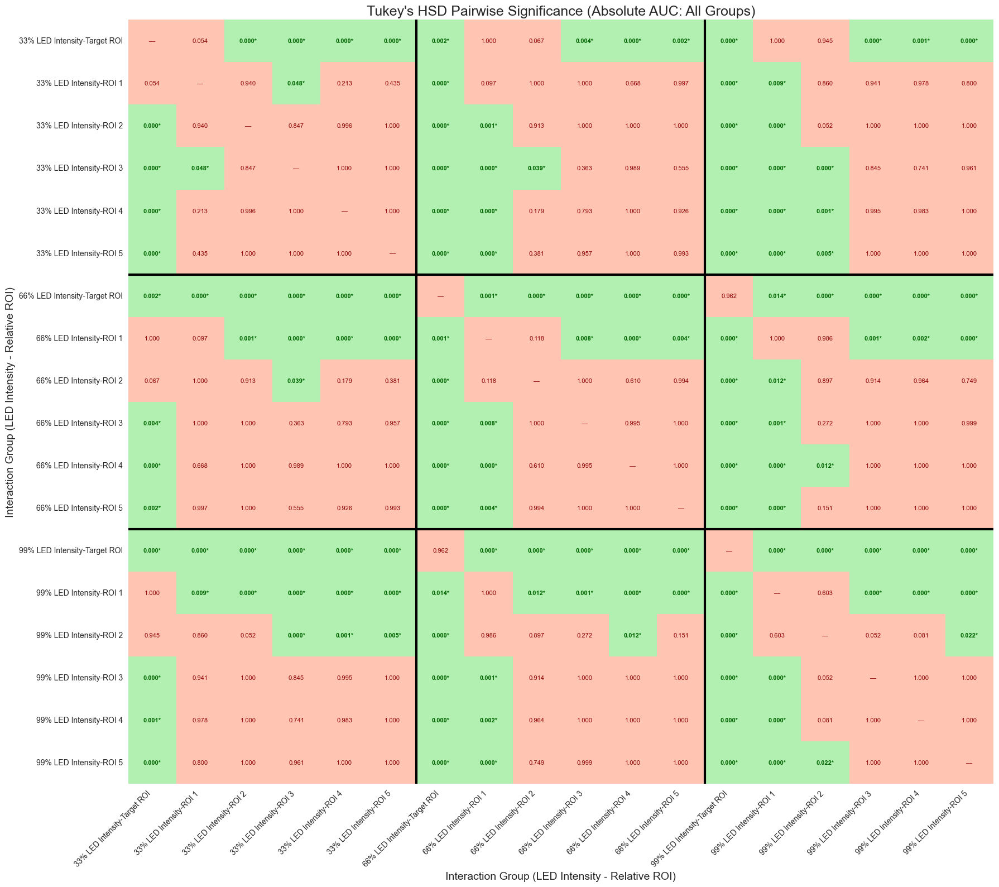


Single 18x18 Binary Heatmap for Absolute AUC generated and saved as Tukey_AUC_18x18_Binary_Final.png.


/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/2003189285.py:135: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)


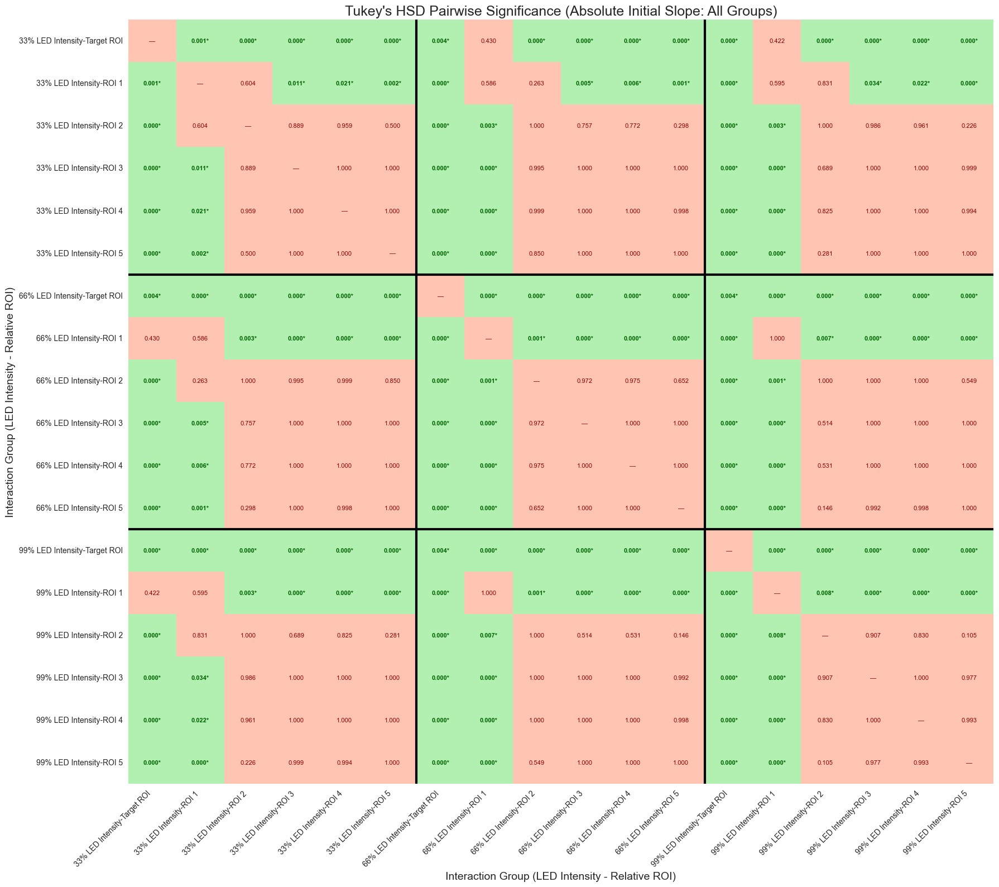


Single 18x18 Binary Heatmap for Slope generated and saved as Tukey_Slope_18x18_Binary_Final.png.


/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/2003189285.py:135: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)


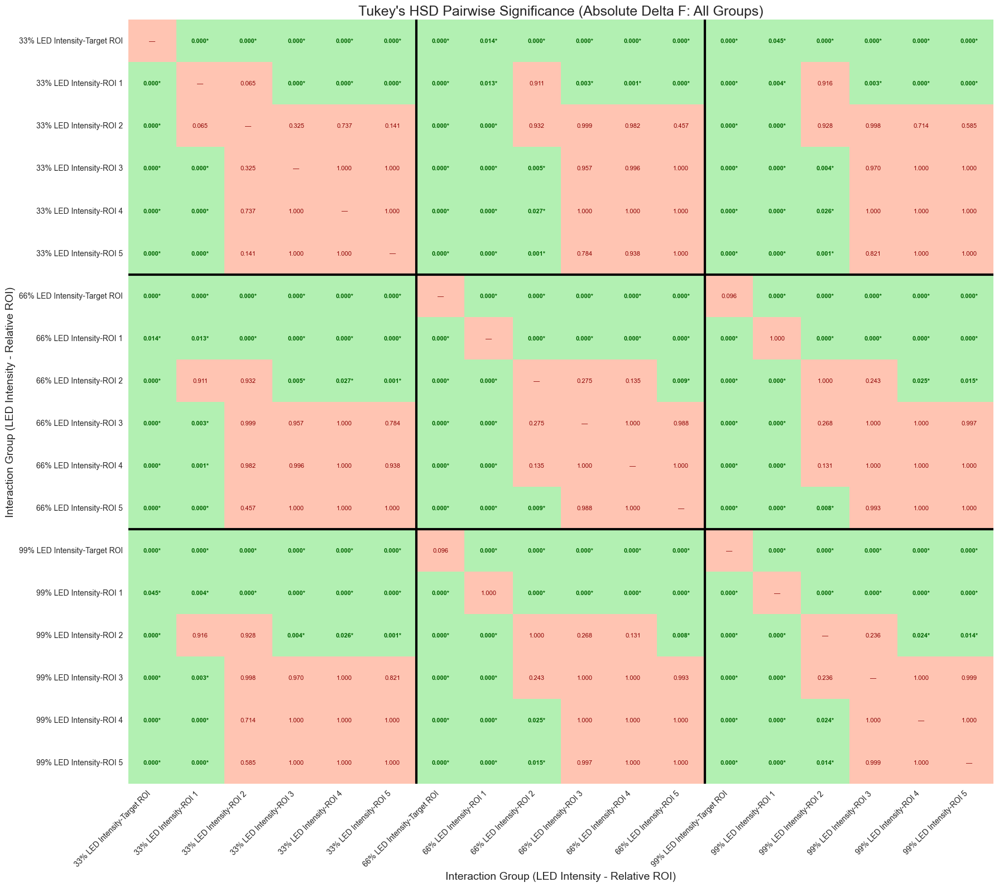


Single 18x18 Binary Heatmap for Delta F generated and saved as Tukey_DeltaF_18x18_Binary_Final.png.

All three 18x18 Tukey's HSD heatmaps are complete and saved.


In [147]:
# Tukey's HSD Heatmap Visualization for Pairwise Comparisons

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from matplotlib.colors import ListedColormap
import sys 
import re # Added for the numeric_intensity_key function

# --- 0. CRITICAL DATA CHECK (ASSUMED LOCALLY DEFINED) ---
required_dfs = ['df_auc', 'df_slopes', 'df_delta_f']

try:
    current_vars = set(locals().keys()) | set(globals().keys())
    missing_dfs = [df_name for df_name in required_dfs if df_name not in current_vars]
    
    if missing_dfs:
        print(f"[CRITICAL ERROR] The following required DataFrames are NOT defined in this session: {', '.join(missing_dfs)}.")
        sys.exit() 

    df_auc = locals().get('df_auc', None)
    df_slopes = locals().get('df_slopes', None)
    df_delta_f = locals().get('df_delta_f', None)

except Exception as e:
    print(f"[CRITICAL ERROR] Could not perform data check: {e}")
    sys.exit()

# --- 1. Define Style & Analysis Parameters ---
alpha = 0.05
color_significant = "#B2F0B2" # Pastel Green
color_not_significant = "#FFC4B2" # Pastel Red
# Colormap: [0, 1]. Map Significant (P<0.05) to 0 (Green), Non-Significant (P>=0.05) to 1 (Red).
cmap_binary = ListedColormap([color_significant, color_not_significant])

# List of (DataFrame, Dependent Variable Column, Title, File Name)
analysis_list = [
    (df_auc, 'Absolute AUC', "Tukey's HSD Pairwise Significance (Absolute AUC: All Groups)", "Tukey_AUC_18x18_Binary_Final.png"),
    (df_slopes, 'Slope', "Tukey's HSD Pairwise Significance (Absolute Initial Slope: All Groups)", "Tukey_Slope_18x18_Binary_Final.png"),
    (df_delta_f, 'Delta F', "Tukey's HSD Pairwise Significance (Absolute Delta F: All Groups)", "Tukey_DeltaF_18x18_Binary_Final.png")
]

# --- 2. Iterative Heatmap Function ---
def run_tukey_18x18_heatmap(df_input, metric_col, title, filename):
    
    if df_input is None or df_input.empty:
        print(f"Skipping analysis for '{title}' due to empty or invalid DataFrame.")
        return

    # 2a. Data Preparation: Create the single Interaction Group
    df_analysis = df_input.copy()
    df_analysis['LED Intensity'] = df_analysis['LED Intensity'].astype(str)
    
    # Map the 'Relative ROI Number' for renaming: 1 -> Target ROI, 2-6 -> ROI 1-5
    roi_mapping = {
        1: 'Target ROI',
        2: 'ROI 1',
        3: 'ROI 2',
        4: 'ROI 3',
        5: 'ROI 4',
        6: 'ROI 5'
    }
    df_analysis['Relative ROI Name'] = df_analysis['Relative ROI Number'].map(roi_mapping).astype(str)
    df_analysis['Interaction_Group'] = df_analysis['LED Intensity'] + '-' + df_analysis['Relative ROI Name']

    # Custom Sorting Logic: Ensures numerical intensity order and Target ROI first
    
    # Define the desired order of ROI names
    roi_order = ['Target ROI', 'ROI 1', 'ROI 2', 'ROI 3', 'ROI 4', 'ROI 5']
    
    # Function to extract the leading number for sorting intensity strings (e.g., '33' from '33 LED Intensity')
    def numeric_intensity_key(intensity_str):
        # Find the first sequence of digits at the start of the string
        match = re.match(r'^\d+', intensity_str)
        if match:
            return float(match.group(0))
        # Fallback for unexpected formats (sorts them last)
        return float('inf') 

    # Get unique LED Intensity groups and sort them numerically
    intensity_groups = sorted(df_analysis['LED Intensity'].unique(), key=numeric_intensity_key)

    # Create the custom ordered list of group labels
    custom_group_labels = []
    for intensity in intensity_groups:
        for roi in roi_order:
            custom_group_labels.append(f"{intensity}-{roi}")
    
    # Final list of groups to use for matrix indexing (must only contain groups present in the data)
    actual_groups = set(df_analysis['Interaction_Group'].unique())
    group_labels = [g for g in custom_group_labels if g in actual_groups]


    # 2b. Run Tukey's HSD on all 18 Interaction Groups
    try:
        tukey_results = pairwise_tukeyhsd(endog=df_analysis[metric_col], 
                                          groups=df_analysis['Interaction_Group'], 
                                          alpha=alpha)
    except ValueError as e:
        print(f"\n[WARNING] Tukey's HSD failed for {metric_col}: {e}")
        return

    df_tukey = pd.DataFrame(data=tukey_results._results_table.data[1:], 
                            columns=tukey_results._results_table.data[0])

    # 2c. Create P-value and Text Matrices using the custom group_labels order
    p_matrix_tukey = pd.DataFrame(index=group_labels, columns=group_labels, dtype=float)
    p_value_text_matrix = pd.DataFrame(index=group_labels, columns=group_labels, dtype=str)

    for _, row in df_tukey.iterrows():
        group1 = row['group1']
        group2 = row['group2']
        
        if group1 in group_labels and group2 in group_labels:
            p_adj = row['p-adj']
            reject = row['reject']
            
            p_matrix_tukey.loc[group1, group2] = p_adj
            p_matrix_tukey.loc[group2, group1] = p_adj
            
            # Text formatting: .3f and '*' for significance
            text_label = f"{p_adj:.3f}"
            if reject:
                text_label += "*"
            p_value_text_matrix.loc[group1, group2] = text_label
            p_value_text_matrix.loc[group2, group1] = text_label

    np.fill_diagonal(p_matrix_tukey.values, 1.0)
    for label in group_labels:
        p_value_text_matrix.loc[label, label] = "—"

    # 2d. Create the Binary Coloring Matrix (0 or 1)
    coloring_matrix = p_matrix_tukey.applymap(lambda p: 1 if p >= alpha else 0)

    # --- 3. Plotting the Heatmap (Single Plot) ---
    fig, ax = plt.subplots(figsize=(18, 16))

    sns.heatmap(
        coloring_matrix,
        annot=p_value_text_matrix,
        fmt='s',
        cmap=cmap_binary,
        vmin=0, vmax=1,
        linewidths=0, # Borderless cells
        linecolor='none',
        cbar=False,
        annot_kws={"size": 8, "weight": 'normal'},
        # Use the custom sorted group_labels here
        xticklabels=group_labels,
        yticklabels=group_labels,
        ax=ax
    )

    # 3a. Post-Plot Customization (Coloring the Text and Adding Major Grid)
    for text in ax.texts:
        if "*" in text.get_text():
            text.set_color('darkgreen')
            text.set_weight('bold')
        else:
            text.set_color('darkred') 

    plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
    ax.tick_params(axis='y', rotation=0)

    # Add Major Grid Lines to separate the 3 Intensity groups (every 6 cells)
    num_roi_groups = 6
    for i in range(len(group_labels)):
        if (i % num_roi_groups == 0) and (i > 0):
            # Draw a thicker, black line every 6 groups
            ax.axvline(x=i, color='black', linewidth=3, linestyle='-')
            ax.axhline(y=i, color='black', linewidth=3, linestyle='-')

    # Final formatting
    ax.set_title(title, fontsize=18)
    ax.set_xlabel("Interaction Group (LED Intensity - Relative ROI)", fontsize=14)
    ax.set_ylabel("Interaction Group (LED Intensity - Relative ROI)", fontsize=14)
    
    # Set axes limits to crop borders
    ax.set_xlim(0, len(group_labels))
    ax.set_ylim(len(group_labels), 0)

    plt.tight_layout()
    plt.savefig(f"/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/{filename}.svg", format="svg")
    plt.show()

    print(f"\nSingle 18x18 Binary Heatmap for {metric_col} generated and saved as {filename}.")


# --- 4. Execute all analyses ---
print("Starting combined 18x18 Tukey's HSD heatmap generation for AUC, Slope, and Delta F...")
for df, metric_col, title, filename in analysis_list:
    run_tukey_18x18_heatmap(df, metric_col, title, filename)
    
print("\nAll three 18x18 Tukey's HSD heatmaps are complete and saved.")

## - Modeling Analysis 

Starting combined non-linear exponential decay regression for AUC, Slope, and Delta F...


<>:128: SyntaxWarning: invalid escape sequence '\l'
<>:142: SyntaxWarning: invalid escape sequence '\l'
<>:160: SyntaxWarning: invalid escape sequence '\l'
<>:128: SyntaxWarning: invalid escape sequence '\l'
<>:142: SyntaxWarning: invalid escape sequence '\l'
<>:160: SyntaxWarning: invalid escape sequence '\l'
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/148421194.py:128: SyntaxWarning: invalid escape sequence '\l'
  label=f"{intensity_label} ($\lambda$={p_fit[1]:.1f}µm)"
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/148421194.py:142: SyntaxWarning: invalid escape sequence '\l'
  ax.legend(title="LED Intensity (Fit $\lambda$)", fontsize=12)
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/148421194.py:160: SyntaxWarning: invalid escape sequence '\l'
  print("\nAll three spatial exponential decay analyses are complete. The $\lambda$ value is your new core metric.")


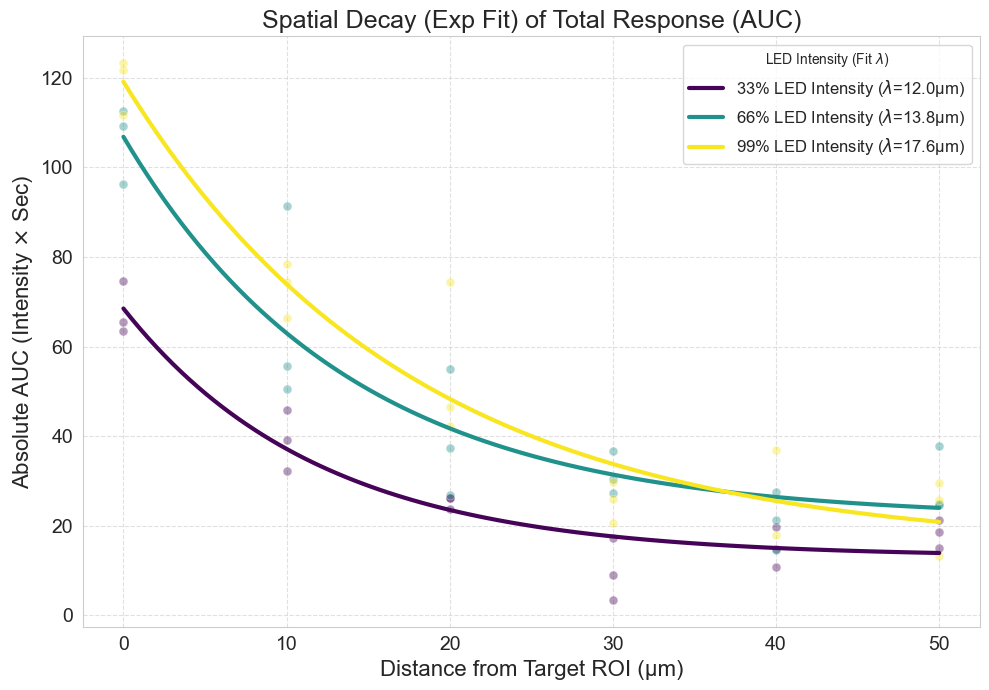


--- Exponential Decay Regression Summary (Spatial Decay (Exp Fit) of Total Response (AUC)) ---
        Intensity  N A (Amplitude) $\lambda$ (Space Constant) [µm] C (Baseline) $R^2$
33% LED Intensity 18         55.43                    12.00 ± 2.54        13.09 0.919
66% LED Intensity 18         85.12                    13.83 ± 3.71        21.73 0.883
99% LED Intensity 18        104.37                    17.64 ± 3.83        14.75 0.935


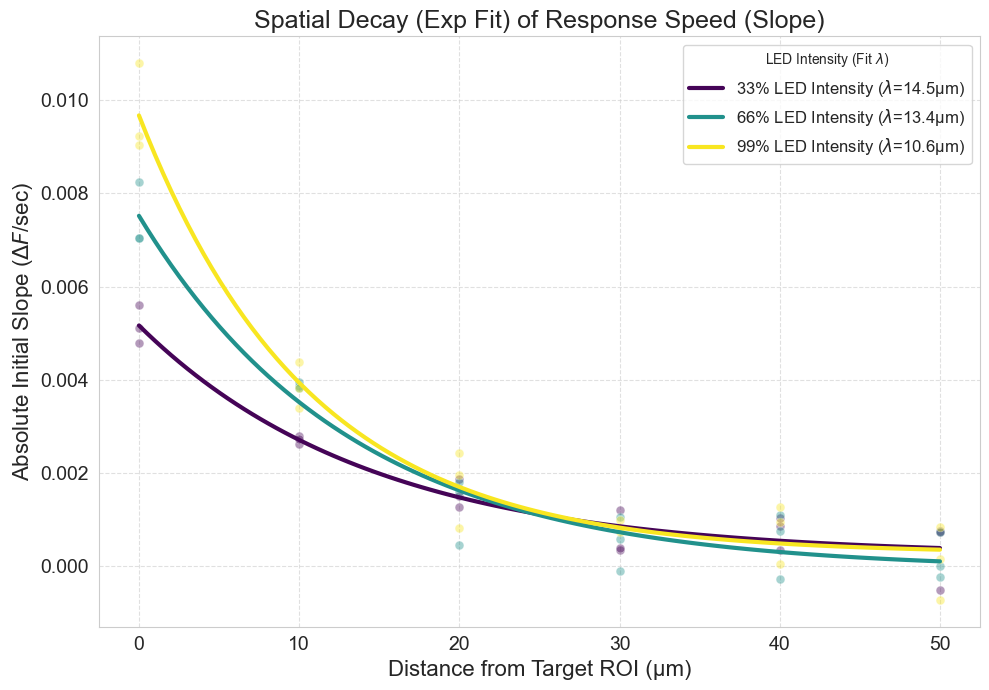


--- Exponential Decay Regression Summary (Spatial Decay (Exp Fit) of Response Speed (Slope)) ---
        Intensity  N A (Amplitude) $\lambda$ (Space Constant) [µm] C (Baseline) $R^2$
33% LED Intensity 18          0.00                    14.52 ± 2.50         0.00 0.950
66% LED Intensity 18          0.01                    13.38 ± 2.06        -0.00 0.958
99% LED Intensity 18          0.01                    10.62 ± 1.34         0.00 0.969


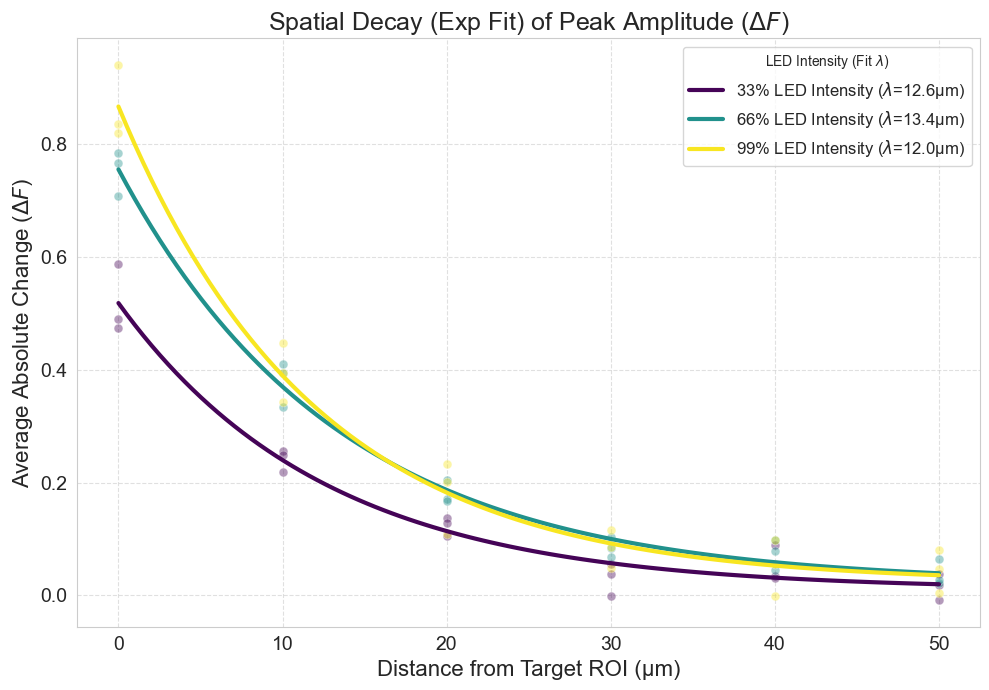


--- Exponential Decay Regression Summary (Spatial Decay (Exp Fit) of Peak Amplitude ($\Delta F$)) ---
        Intensity  N A (Amplitude) $\lambda$ (Space Constant) [µm] C (Baseline) $R^2$
33% LED Intensity 18          0.51                    12.60 ± 1.62         0.01 0.969
66% LED Intensity 18          0.73                    13.43 ± 1.02         0.02 0.989
99% LED Intensity 18          0.85                    12.01 ± 1.26         0.02 0.979

All three spatial exponential decay analyses are complete. The $\lambda$ value is your new core metric.


In [149]:
# Modeling with exponential decay fits for spatial analysis 

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from matplotlib import colormaps, colors
from scipy.optimize import curve_fit
from scipy import stats
import sys 

# --- 0. CRITICAL DATA CHECK (MUST BE DEFINED LOCALLY) ---
# NOTE: This code assumes df_auc, df_slopes, and df_delta_f are in memory.
required_dfs = ['df_auc', 'df_slopes', 'df_delta_f']

try:
    current_vars = set(locals().keys()) | set(globals().keys())
    missing_dfs = [df_name for df_name in required_dfs if df_name not in current_vars]
    
    if missing_dfs:
        print(f"[CRITICAL ERROR] The following required DataFrames are NOT defined in this session: {', '.join(missing_dfs)}.")
        print("Please ensure you have run the creation code for these DataFrames (Blocks 1/2, 3/4, 5/6) in your local environment before running this block.")
        sys.exit() 

    # Assign the locally available DataFrames to a list for iteration
    df_auc = locals().get('df_auc', None)
    df_slopes = locals().get('df_slopes', None)
    df_delta_f = locals().get('df_delta_f', None)

except Exception as e:
    print(f"[CRITICAL ERROR] Could not perform data check: {e}")
    sys.exit()


# --- Setup shared visualization parameters ---
sns.set_style("whitegrid")
cmap_group = colormaps.get_cmap('viridis')
group_plot_colors = [cmap_group(0.01), cmap_group(0.5), cmap_group(0.99)] 

intensity_group_colors = {
    '33% LED Intensity': group_plot_colors[0],
    '66% LED Intensity': group_plot_colors[1],
    '99% LED Intensity': group_plot_colors[2]
}

# --- 1. Define Exponential Decay Function ---
# A: Amplitude, lambda_: Space Constant (decay rate), C: Baseline/Offset
def exponential_decay(x, A, lambda_, C):
    return A * np.exp(-x / lambda_) + C

# --- 2. Define Analysis List ---
# List of (DataFrame, Dependent Variable Column, Y-Axis Label, Figure Title, File Name)
analysis_list = [
    (df_auc, 'Absolute AUC', r"Absolute AUC (Intensity $\times$ Sec)", "Spatial Decay (Exp Fit) of Total Response (AUC)", "Figure_AUC_Spatial_Exp_Fit.svg"),
    (df_slopes, 'Slope', r"Absolute Initial Slope ($\Delta F$/sec)", "Spatial Decay (Exp Fit) of Response Speed (Slope)", "Figure_Slope_Spatial_Exp_Fit.svg"),
    (df_delta_f, 'Delta F', r"Average Absolute Change ($\Delta F$)", r"Spatial Decay (Exp Fit) of Peak Amplitude ($\Delta F$)", "Figure_DeltaF_Spatial_Exp_Fit.svg")
]


# --- 3. Iterative Regression and Plotting Function ---
def run_spatial_exponential_fit(df_input, y_col, y_label, title, filename):
    
    if df_input is None or df_input.empty:
        print(f"Skipping analysis for '{title}' due to empty or invalid DataFrame.")
        return

    # Calculate Distance Column (safe to re-run/check)
    if 'Distance (µm)' not in df_input.columns:
        df_input['Distance (µm)'] = (df_input['Relative ROI Number'] - 1) * 10
    
    # Store all Space Constants (lambda) and R2 values for the summary table
    results_summary = []
    
    # Prepare the figure
    fig, ax = plt.subplots(figsize=(10, 7))
    
    x_fit = np.linspace(df_input['Distance (µm)'].min(), df_input['Distance (µm)'].max(), 100)
    
    for intensity_label, color in intensity_group_colors.items():
        group_df = df_input[df_input['LED Intensity'] == intensity_label].copy()
        
        X_data = group_df['Distance (µm)'].values
        Y_data = group_df[y_col].values
        
        if len(Y_data) < 3:
            results_summary.append({"Intensity": intensity_label, "N": len(Y_data), "A (Amplitude)": np.nan, 
                                    r"$\lambda$ (Space Constant) [µm]": np.nan, "C (Baseline)": np.nan, r"$R^2$": np.nan})
            continue

        # --- Initial Guess for Fit Parameters ---
        A0 = Y_data.max() - Y_data.min() # Initial Amplitude
        lambda0 = 10.0                   # Initial Space Constant guess (10 microns is one ROI spacing)
        C0 = Y_data.min()                # Initial Baseline
        
        # --- Run Curve Fit ---
        try:
            popt, pcov = curve_fit(exponential_decay, X_data, Y_data, p0=[A0, lambda0, C0], maxfev=5000)
            p_fit = popt
            perr = np.sqrt(np.diag(pcov)) # Standard deviation errors for parameters
            
            # --- Calculate R-squared (Goodness of Fit) ---
            residuals = Y_data - exponential_decay(X_data, *p_fit)
            ss_res = np.sum(residuals**2)
            ss_tot = np.sum((Y_data - np.mean(Y_data))**2)
            r_squared = 1 - (ss_res / ss_tot)
            
            # --- Store Results ---
            results_summary.append({
                "Intensity": intensity_label, 
                "N": len(Y_data), 
                "A (Amplitude)": f"{p_fit[0]:.2f}", 
                r"$\lambda$ (Space Constant) [µm]": f"{p_fit[1]:.2f} ± {perr[1]:.2f}", 
                "C (Baseline)": f"{p_fit[2]:.2f}",
                r"$R^2$": f"{r_squared:.3f}"
            })

            # --- PLOTTING ---
            # Scatter Plot of Individual Replicate Data
            sns.scatterplot(
                data=group_df, x='Distance (µm)', y=y_col, color=color,
                alpha=0.4, s=40, label=None, ax=ax
            )

            # Plot the Fitted Exponential Line
            ax.plot(
                x_fit, exponential_decay(x_fit, *p_fit), color=color,
                linestyle='-', linewidth=3, 
                label=f"{intensity_label} ($\lambda$={p_fit[1]:.1f}µm)"
            )
            
        except RuntimeError:
            print(f"Warning: Could not fit exponential function for {intensity_label} on {y_col}. Check data or adjust initial parameters.")
            results_summary.append({"Intensity": intensity_label, "N": len(Y_data), "A (Amplitude)": "Fit Failed", 
                                    r"$\lambda$ (Space Constant) [µm]": "Fit Failed", "C (Baseline)": "Fit Failed", r"$R^2$": "Fit Failed"})


    # Final Plot Formatting
    ax.tick_params(axis='both', which='major', labelsize=14)
    ax.set_xlabel("Distance from Target ROI (µm)", fontsize=16)
    ax.set_ylabel(y_label, fontsize=16)
    ax.set_title(title, fontsize=18)
    ax.legend(title="LED Intensity (Fit $\lambda$)", fontsize=12)
    ax.grid(True, linestyle='--', alpha=0.6)

    plt.tight_layout()
    plt.savefig(f"/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/{filename}", format="svg")
    plt.show()

    # Print Regression Summary Table (Non-tabulate format)
    df_summary = pd.DataFrame(results_summary)
    print(f"\n--- Exponential Decay Regression Summary ({title}) ---")
    print(df_summary.to_string(index=False))


# --- 4. Execute all analyses ---
print("Starting combined non-linear exponential decay regression for AUC, Slope, and Delta F...")
for df, y_col, y_label, title, filename in analysis_list:
    run_spatial_exponential_fit(df, y_col, y_label, title, filename)

print("\nAll three spatial exponential decay analyses are complete. The $\lambda$ value is your new core metric.")

In [150]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from scipy.optimize import curve_fit
from scipy import stats
import sys

# --- CONFIGURATION (CRITICAL: CHECK THESE) ---
# Column containing the ROI number (e.g., 1, 2, 3...)
ROI_COLUMN_NAME = 'Relative ROI Number' 
# The number of data points (ROIs/distances) that constitute one single, complete replicate run.
ROIS_PER_REPLICATE = 8 
# -----------------------------------------------------------------------------------

# --- 1. Define Core Functions and Constants ---

# Exponential decay function: A: Amplitude, lambda_: Space Constant, C: Baseline
def exponential_decay(x, A, lambda_, C):
    """Exponential decay model for spatial fitting."""
    return A * np.exp(-x / lambda_) + C

# Distance mapping (10 µm between ROIs, starting at ROI 1)
def calculate_distance(roi_number):
    """Converts relative ROI number to distance in µm."""
    return (roi_number - 1) * 10

# Helper function to fit the decay model and return the lambda value
def fit_lambda_per_replicate(group_df, y_col):
    """
    Fits the exponential decay model to a single replicate's data 
    and returns lambda (space constant).
    """
    X_data = group_df['Distance (µm)'].values
    Y_data = group_df[y_col].values

    if len(Y_data) < 3: # Minimum data points for a 3-parameter fit
        return np.nan

    # Initial Guess for Fit Parameters
    A0 = Y_data.max() - Y_data.min()
    lambda0 = 10.0
    C0 = Y_data.min()
    p0 = [A0, lambda0, C0]

    try:
        # Run the non-linear curve fit
        popt, _ = curve_fit(exponential_decay, X_data, Y_data, p0=p0, maxfev=5000)
        # popt[1] is the lambda (space constant)
        return popt[1]
    except RuntimeError:
        return np.nan
    except ValueError:
        return np.nan

# --- 2. DATA LOAD/CHECK (Ensure required DataFrames exist) ---
required_dfs = ['df_auc', 'df_slopes', 'df_delta_f']

try:
    current_vars = set(locals().keys()) | set(globals().keys())
    missing_dfs = [df_name for df_name in required_dfs if df_name not in current_vars]
    
    if missing_dfs:
        print(f"[CRITICAL ERROR] The following required DataFrames for ANOVA are NOT defined in this session: {', '.join(missing_dfs)}.")
        sys.exit(1) 

    # Assign the locally available DataFrames to variables
    df_auc = locals().get('df_auc', None)
    df_slopes = locals().get('df_slopes', None)
    df_delta_f = locals().get('df_delta_f', None)

    if any(df is None or df.empty for df in [df_auc, df_slopes, df_delta_f]):
         print("[CRITICAL ERROR] One or more DataFrames were found in scope but are None/empty.")
         sys.exit(1)

except Exception as e:
    print(f"[CRITICAL ERROR] Could not perform data check: {e}")
    sys.exit(1)


# --- 3. Extract Lambda per Replicate ---

# List of (DataFrame, Dependent Variable Column, Parameter Name)
analysis_list = [
    (df_auc, 'Absolute AUC', "AUC"),
    (df_slopes, 'Slope', "Initial Slope"),
    (df_delta_f, 'Delta F', "Delta F")
]

all_replicate_lambdas = []

print("--- Step 1: Extracting Space Constant (λ) for each individual replicate ---")

for df_input, y_col, param_name in analysis_list:
    
    # Check for required columns before proceeding
    required_cols = ['LED Intensity', ROI_COLUMN_NAME, y_col]
    missing_cols = [col for col in required_cols if col not in df_input.columns]
    
    if missing_cols:
        print(f"[ERROR] DataFrame for {param_name} is missing critical columns: {', '.join(missing_cols)}. Skipping analysis.")
        continue # Skip this parameter
    
    # Create the 'Distance (µm)' column if it doesn't exist
    if 'Distance (µm)' not in df_input.columns:
        df_input['Distance (µm)'] = df_input[ROI_COLUMN_NAME].apply(calculate_distance)
    
    # >>> REPLICATE ID GENERATION LOGIC (Creates ID based on sequential row order) <<<
    # Groups rows by 'LED Intensity', counts cumulatively, and divides by ROIs_PER_REPLICATE
    # e.g., rows 0-7 get ID 0, rows 8-15 get ID 1, etc., within each intensity group.
    df_input['Calculated_Rep_ID'] = (
        df_input.groupby('LED Intensity').cumcount() // ROIS_PER_REPLICATE
    )
    
    # Group by the Calculated Replicate ID and Intensity
    grouping_keys = ['Calculated_Rep_ID', 'LED Intensity']
    grouped = df_input.groupby(grouping_keys)
    
    for (rep_id, intensity), group_df in grouped:
        lambda_val = fit_lambda_per_replicate(group_df, y_col)
        
        all_replicate_lambdas.append({
            'Parameter': param_name,
            'Intensity': intensity.replace(" LED Intensity", ""), 
            'Lambda_Replicate': lambda_val
        })

print("Extraction complete. Ready for statistical analysis.")

# Create the final DataFrame for ANOVA, dropping any replicates where the fit failed (NaN lambdas)
df_lambdas_for_anova = pd.DataFrame(all_replicate_lambdas).dropna()

if df_lambdas_for_anova.empty:
    print("\n[CRITICAL WARNING] No valid lambda values were extracted. Check your data structure, column names, and fit quality.")
    sys.exit(0)


# --- 4. Perform ANOVA and Tukey's HSD ---

print("\n--- Step 2: One-Way ANOVA and Pairwise Testing ---")

# Iterate through each parameter and perform the necessary tests
parameters = df_lambdas_for_anova['Parameter'].unique()

for param in parameters:
    # Subset data for the current parameter
    df_param = df_lambdas_for_anova[df_lambdas_for_anova['Parameter'] == param].copy()
    
    # Ensure Intensity is a proper categorical variable
    df_param['Intensity'] = pd.Categorical(df_param['Intensity'])

    print(f"\n========================================================")
    print(f"STATISTICAL ANALYSIS FOR: {param} ($\lambda$)")
    print(f"========================================================")

    # Perform One-Way ANOVA
    try:
        # Null Hypothesis (H0): The mean lambda values for all intensity groups are equal.
        model = ols('Lambda_Replicate ~ Intensity', data=df_param).fit()
        anova_table = sm.stats.anova_lm(model, typ=2) 
        p_value = anova_table['PR(>F)']['Intensity']

        print(f"\n[1] One-Way ANOVA Summary (H0: Means are Equal)")
        print(anova_table)

        if p_value < 0.05:
            print(f"\n[2] P-value ({p_value:.4f}) is significant (< 0.05). H0 is rejected.")
            print("Proceeding to Tukey's HSD pairwise test.")

            # Perform Tukey's HSD test for pairwise comparisons
            tukey_results = pairwise_tukeyhsd(
                endog=df_param['Lambda_Replicate'], # Dependent variable
                groups=df_param['Intensity'],       # Grouping variable
                alpha=0.05                          # Significance level
            )

            print(f"\n[3] Tukey's HSD Pairwise Test Results")
            print(tukey_results)
            print("\n* Interpretation: If 'reject' is True, the pair is significantly different at p < 0.05.")
        else:
            print(f"\n[2] P-value ({p_value:.4f}) is NOT significant (>= 0.05). H0 is retained.")
            print("No significant difference was found between the mean lambda values across the intensity groups.")

    except Exception as e:
        print(f"\nAn error occurred during ANOVA for {param}: {e}")

print("\n--- END OF STATISTICAL ANALYSIS ---")

--- Step 1: Extracting Space Constant (λ) for each individual replicate ---
Extraction complete. Ready for statistical analysis.

--- Step 2: One-Way ANOVA and Pairwise Testing ---

STATISTICAL ANALYSIS FOR: AUC ($\lambda$)

[1] One-Way ANOVA Summary (H0: Means are Equal)
                       sum_sq         df          F     PR(>F)
Intensity 2841860297.13437605 2.00000000 1.00034594 0.46466155
Residual  4261316273.63831139 3.00000000        NaN        NaN

[2] P-value (0.4647) is NOT significant (>= 0.05). H0 is retained.
No significant difference was found between the mean lambda values across the intensity groups.

STATISTICAL ANALYSIS FOR: Initial Slope ($\lambda$)

[1] One-Way ANOVA Summary (H0: Means are Equal)
                 sum_sq         df          F     PR(>F)
Intensity  225.76110446 2.00000000 0.28906264 0.76771242
Residual  1171.51651469 3.00000000        NaN        NaN

[2] P-value (0.7677) is NOT significant (>= 0.05). H0 is retained.
No significant difference was fou

<>:154: SyntaxWarning: invalid escape sequence '\l'
<>:154: SyntaxWarning: invalid escape sequence '\l'
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/620721232.py:154: SyntaxWarning: invalid escape sequence '\l'
  print(f"STATISTICAL ANALYSIS FOR: {param} ($\lambda$)")


- - -
# Dose Response Curve Analysis
Analysis based on original 9 ROIs


## - Stats Analayis 


1. Total active DMD pixels: 6182400

2. Individual ROI Dose Calculation (mJ):
   ROI 1 (Idx 0): 0.00 mJ (P=0.0000mW, Area=100px)
   ROI 2 (Idx 1): 0.00 mJ (P=0.0000mW, Area=100px)
   ROI 3 (Idx 2): 0.00 mJ (P=0.0000mW, Area=100px)
   ROI 4 (Idx 3): 0.00 mJ (P=0.0000mW, Area=100px)
   ROI 5 (Idx 4): 0.00 mJ (P=0.0000mW, Area=100px)
   ROI 6 (Idx 5): 0.00 mJ (P=0.0000mW, Area=100px)
   ROI 7 (Idx 6): 0.00 mJ (P=0.0000mW, Area=100px)
   ROI 8 (Idx 7): 0.01 mJ (P=0.0000mW, Area=100px)
   ROI 9 (Idx 8): 0.01 mJ (P=0.0000mW, Area=100px)

3. Data processed. Final shape used for replicate analysis: (90, 9, 3)
Calculating Fluorophore Intensity Change During Stimulation (End - Start) for all replicates:
   ROI 1 Rep 1: Change = 0.0910 (Frames 0 to 2)
   ROI 1 Rep 2: Change = 0.1591 (Frames 0 to 2)
   ROI 1 Rep 3: Change = 0.0651 (Frames 0 to 2)
   ROI 2 Rep 1: Change = 0.1416 (Frames 2 to 4)
   ROI 2 Rep 2: Change = 0.1388 (Frames 2 to 4)
   ROI 2 Rep 3: Change = 0.1577 (Frames 2 to 4)
   ROI 3

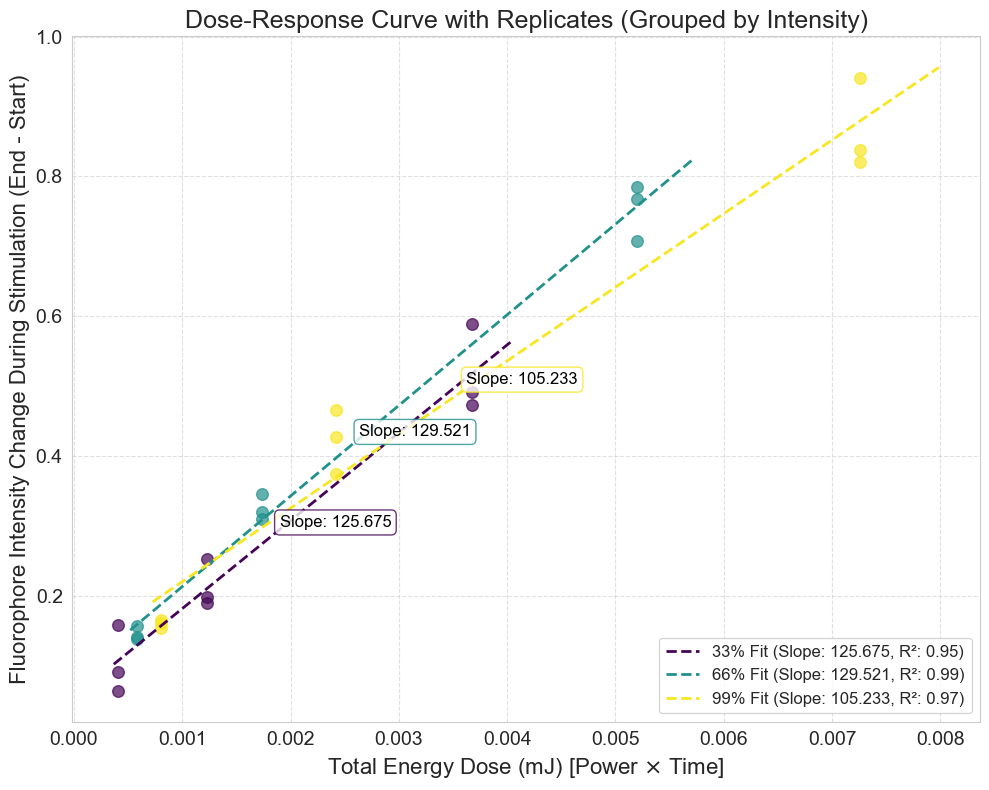


--- Replicate Dose-Response Analysis Complete ---


In [57]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress
import tifffile
import os 
from matplotlib import colormaps

# --- 🎯 Part 1: DATA ACCESS AND SETUP ---

# NOTE: The following variables are assumed to be defined and loaded in your environment:
# - reordered_labeled_mask (2D array with ROI labels 1-9)
# - full_dmd_roi_image (2D array used to calculate total active DMD pixels)
# - all_biological_replicates_avg_data (Time x ROI x Replicates: 90 x 28 x 3)
roi_image_path = "/Users/kos-mos/Documents/EntireDMD_ROI_2.tif" 

# Attempt to load the ROI image
try:
    full_dmd_roi_image = tifffile.imread(roi_image_path)
except FileNotFoundError:
    print(f"ERROR: TIF file not found at: {roi_image_path}. Assuming 'full_dmd_roi_image' is defined.")
    
# 1b. Define Laser Power Measurements (Full DMD ON in mW)
P_measured_33_full_mW = 1.263333 
P_measured_66_full_mW = 1.786666 
P_measured_99_full_mW = 2.493333 

# 1c. Define Experimental Exposure Times and Frame Interval
duration_short_s = 20    # 20s (Used for ROI 1, 2, 3)
duration_medium_s = 60   # 1min (Used for ROI 4, 5, 6)
duration_long_s = 180    # 3min (Used for ROI 7, 8, 9)
frame_interval_seconds = 10 # 1 frame every 10 seconds (Assumed)

# --- 📏 Part 2: DOSE CALCULATION (INDIVIDUAL ROI AREA & CORRECTED DURATION) ---

# 2a. Calculate the total number of pixels in the full active DMD area
total_dmd_pixels = np.sum(full_dmd_roi_image > 0)
print(f"\n1. Total active DMD pixels: {total_dmd_pixels}")


if total_dmd_pixels > 0:
    
    # 2b. Calculate the power-per-pixel ratio (mW/pixel) for the full DMD
    power_per_pixel_99 = P_measured_99_full_mW / total_dmd_pixels 
    power_per_pixel_66 = P_measured_66_full_mW / total_dmd_pixels 
    power_per_pixel_33 = P_measured_33_full_mW / total_dmd_pixels 
    
    # Map for easy lookup of power-per-pixel based on intensity
    intensity_to_ppp = {
        33: power_per_pixel_33,
        66: power_per_pixel_66,
        99: power_per_pixel_99
    }
    
    # 2c. Define the 9 Experimental Conditions with CORRECTED Durations
    # Structure: (ROI Index (0-8 in data), Intensity_percent, Duration_s, Original_ROI_Label (1-9))
    conditions_map_detailed = [
        # --- 20s DWELL TIME (Row 1) ---
        (0, 33, duration_short_s, 1),    # ROI 1 (33%, 20s)
        (1, 66, duration_short_s, 2),    # ROI 2 (66%, 20s) 
        (2, 99, duration_short_s, 3),    # ROI 3 (99%, 20s) 
        
        # --- 1min DWELL TIME (Row 2) ---
        (3, 33, duration_medium_s, 4),   # ROI 4 (33%, 60s) 
        (4, 66, duration_medium_s, 5),   # ROI 5 (66%, 60s) 
        (5, 99, duration_medium_s, 6),   # ROI 6 (99%, 60s) 
        
        # --- 3min DWELL TIME (Row 3) ---
        (6, 33, duration_long_s, 7),     # ROI 7 (33%, 180s) 
        (7, 66, duration_long_s, 8),     # ROI 8 (66%, 180s) 
        (8, 99, duration_long_s, 9)      # ROI 9 (99%, 180s) 
    ]

    dose_data = {}
    print("\n2. Individual ROI Dose Calculation (mJ):")
    for data_idx, intensity, duration, label in conditions_map_detailed:
        
        # Get the SPECIFIC pixel count for this ROI label
        pixels_per_roi = np.sum(reordered_labeled_mask == label)
        
        # Calculate Power and Dose
        power_per_pixel = intensity_to_ppp[intensity]
        P_roi_mW = power_per_pixel * pixels_per_roi
        dose_mJ = P_roi_mW * duration
        
        dose_data[data_idx] = {'Power_mW': P_roi_mW, 
                              'Duration_s': duration, 
                              'Dose_mJ': dose_mJ,
                              'Label': label,
                              'Intensity_p': intensity} # Keep intensity for plotting groups
        
        print(f"   ROI {label} (Idx {data_idx}): {dose_mJ:.2f} mJ (P={P_roi_mW:.4f}mW, Area={pixels_per_roi}px)")
        
else:
    print("ERROR: Cannot calculate ROI power and dose due to missing or zero pixel counts.")
    
# --- 📈 Part 3: CALCULATE CHANGE VS. DOSE (KEEPING REPLICATES SEPARATE) ---

dose_response_points_all = []

# 🌟 CRITICAL FIX: Slice to keep only the first 9 ROIs (indices 0-8)
try:
    # Slice data to Time x 9 ROIs x 3 Replicates (assuming the first 9 columns are the relevant ones)
    data_replicates = all_biological_replicates_avg_data[:, :9, :]
    
    print(f"\n3. Data processed. Final shape used for replicate analysis: {data_replicates.shape}")
    
except Exception as e:
    print(f"\nCRITICAL DATA PROCESSING ERROR: Could not slice data. Error: {e}")
    exit()


# FINAL CORRECTED TIMING ARRAYS (in seconds)
start_times_s = [0, 20, 40, 60, 120, 180, 240, 420, 600]
end_times_s = [20, 40, 60, 120, 180, 240, 420, 600, 780]
num_replicates = data_replicates.shape[2]

# Arrays to hold the expanded data (9 ROIs * 3 Replicates = 27 points)
doses_all = []
changes_all = []
roi_labels_all = []
intensity_p_all = []


print("Calculating Fluorophore Intensity Change During Stimulation (End - Start) for all replicates:")

for i in range(9): # Iterate through the 9 ROIs
    
    # Get the calculated dose (which is the same for all 3 replicates of this ROI)
    current_dose = dose_data[i]['Dose_mJ']
    current_label = dose_data[i]['Label']
    current_intensity = dose_data[i]['Intensity_p']
    
    # Convert times (seconds) to frame indices 
    start_frame = int(np.round(start_times_s[i] / frame_interval_seconds))
    end_frame = int(np.round(end_times_s[i] / frame_interval_seconds))
    
    # Safety check (if data is too short, should be 78 frames minimum)
    if end_frame >= data_replicates.shape[0]:
        print(f"WARNING: ROI {i+1} End frame ({end_frame}) exceeds data length. Adjusting.")
        end_frame = data_replicates.shape[0] - 1

    # Extract the change data for ALL 3 replicates at once for this ROI
    # The shape of this slice will be (3,)
    initial_intensities = data_replicates[start_frame, i, :]
    final_intensities = data_replicates[end_frame, i, :]
    
    changes_replicates = final_intensities - initial_intensities
    
    for r in range(num_replicates): # Iterate through the 3 replicates
        changes_all.append(changes_replicates[r])
        doses_all.append(current_dose)
        roi_labels_all.append(f'ROI {current_label} Rep {r+1}')
        intensity_p_all.append(current_intensity)
        
        print(f"   ROI {current_label} Rep {r+1}: Change = {changes_replicates[r]:.4f} (Frames {start_frame} to {end_frame})")

doses_all = np.array(doses_all)
changes_all = np.array(changes_all)


# --- 📊 Part 4: PLOT THE DOSE-RESPONSE CURVE (Replicates Plot) ---
    
print("\n4. Fitting Lines and Plotting (All Replicates):")

# Define the Viridis colors for the three intensity groups
cmap_box = colormaps.get_cmap('viridis')
box_plot_colors = {
    33: cmap_box(0.01),
    66: cmap_box(0.5),
    99: cmap_box(0.99)
}

# Define the ROI groups using the intensity values
intensity_groups = {
    '33%': {'intensity': 33, 'color': box_plot_colors[33]}, 
    '66%': {'intensity': 66, 'color': box_plot_colors[66]},
    '99%': {'intensity': 99, 'color': box_plot_colors[99]}
}


fig_dose, ax_dose = plt.subplots(figsize=(10, 8))

# Perform Linear Regression and Plot Lines
for intensity_label, group_data in intensity_groups.items():
    target_intensity = group_data['intensity']
    fit_color = group_data['color']
    
    # Select all 9 points (3 ROIs * 3 Replicates) belonging to this intensity group
    mask = np.array(intensity_p_all) == target_intensity
    group_doses = doses_all[mask]
    group_changes = changes_all[mask]
    
    # --- Perform Linear Regression on ALL 9 POINTS in the intensity group ---
    if len(group_doses) > 1 and np.std(group_doses) > 1e-6:
        slope, intercept, r_value, p_value, std_err = linregress(group_doses, group_changes)
        
        x_fit = np.linspace(group_doses.min() * 0.9, group_doses.max() * 1.1, 100)
        y_fit = slope * x_fit + intercept
        
        ax_dose.plot(x_fit, y_fit, color=fit_color, linestyle='--', linewidth=2, 
                     label=f'{intensity_label} Fit (Slope: {slope:.3f}, R²: {r_value**2:.2f})')
        
        # Annotation to display the slope
        x_annotate = np.mean(group_doses) 
        y_annotate = slope * x_annotate + intercept
        ax_dose.annotate(f'Slope: {slope:.3f}', 
                         xy=(x_annotate, y_annotate), 
                         xytext=(10, 10), 
                         textcoords='offset points', 
                         fontsize=12, color='black', 
                         bbox=dict(boxstyle="round,pad=0.3", fc="white", alpha=0.8, ec=fit_color))
        
        print(f"   {intensity_label}: Slope = {slope:.4f}")

# Plot the scatter points for all 27 replicates
for i in range(len(doses_all)):
    # Determine the color based on the intensity
    intensity_val = intensity_p_all[i]
    color = box_plot_colors[intensity_val]
    
    # Use a unique marker/color combo for each replicate if desired, 
    # but using color by intensity is clearer for dose-response curve
    ax_dose.scatter(doses_all[i], changes_all[i], 
                    s=70, alpha=0.7, marker='o', 
                    color=color, 
                    label=None) 

# Set labels and title
ax_dose.set_xlabel("Total Energy Dose (mJ) [Power $\\times$ Time]", fontsize=16)
ax_dose.set_ylabel("Fluorophore Intensity Change During Stimulation (End - Start)", fontsize=16)
ax_dose.set_title("Dose-Response Curve with Replicates (Grouped by Intensity)", fontsize=18)
ax_dose.grid(True, linestyle='--', alpha=0.6)
ax_dose.legend(loc='lower right', fontsize=12)
ax_dose.tick_params(axis='both', which='major', labelsize=14)

plt.tight_layout()
plt.show()

print("\n--- Replicate Dose-Response Analysis Complete ---")


1. Total active DMD pixels: 6182400

1. Individual ROI Dose Calculation (mJ):
   ROI 1 (Idx 0): 0.00 mJ (P=0.0000mW, Area=100px)
   ROI 2 (Idx 1): 0.00 mJ (P=0.0000mW, Area=100px)
   ROI 3 (Idx 2): 0.00 mJ (P=0.0000mW, Area=100px)
   ROI 4 (Idx 3): 0.00 mJ (P=0.0000mW, Area=100px)
   ROI 5 (Idx 4): 0.00 mJ (P=0.0000mW, Area=100px)
   ROI 6 (Idx 5): 0.00 mJ (P=0.0000mW, Area=100px)
   ROI 7 (Idx 6): 0.00 mJ (P=0.0000mW, Area=100px)
   ROI 8 (Idx 7): 0.01 mJ (P=0.0000mW, Area=100px)
   ROI 9 (Idx 8): 0.01 mJ (P=0.0000mW, Area=100px)

2. Data processed. Final shape used for replicate analysis: (90, 9, 3)
Calculating Averaged Fluorophore Intensity Change, SD, and SEM:
   ROI 1: Mean Change = 0.1051 +/- 0.0280 SEM
   ROI 2: Mean Change = 0.1460 +/- 0.0059 SEM
   ROI 3: Mean Change = 0.1607 +/- 0.0031 SEM
   ROI 4: Mean Change = 0.2143 +/- 0.0197 SEM
   ROI 5: Mean Change = 0.3259 +/- 0.0106 SEM
   ROI 6: Mean Change = 0.4229 +/- 0.0265 SEM
   ROI 7: Mean Change = 0.5178 +/- 0.0356 SEM
   R

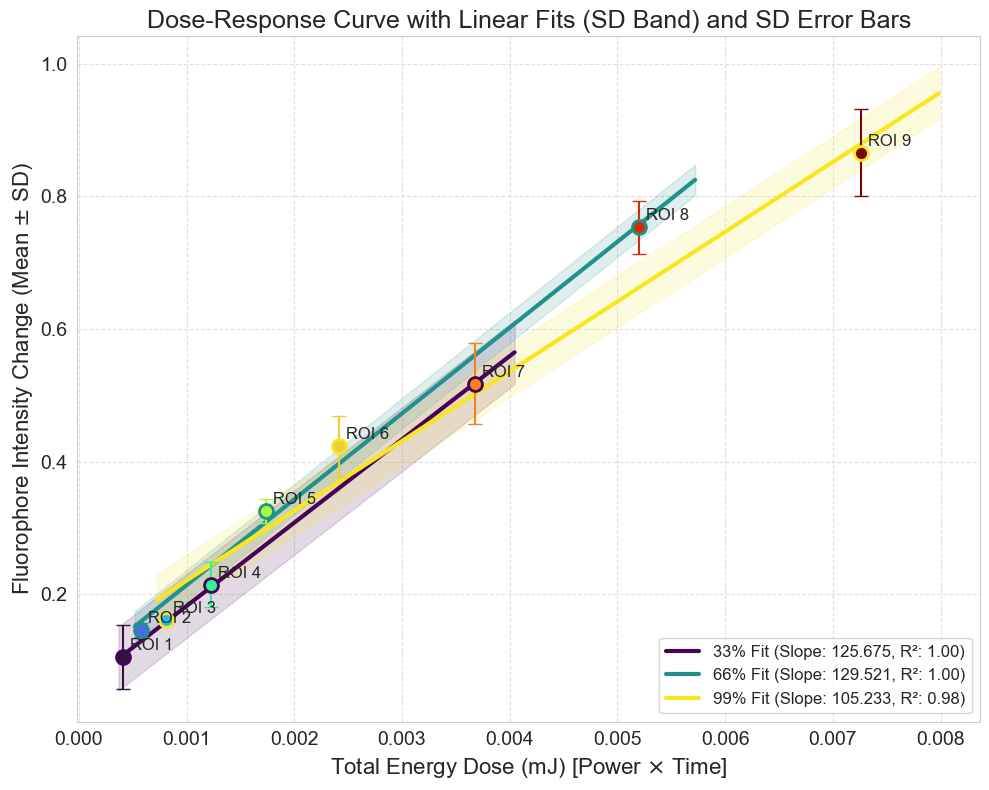

In [58]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import linregress
import tifffile
import os 
from matplotlib import colormaps

# --- 🎯 Part 1: DATA ACCESS AND SETUP ---

# NOTE: The following variables are assumed to be defined and loaded in your environment:
# - reordered_labeled_mask (2D array with ROI labels 1-9)
# - full_dmd_roi_image (2D array used to calculate total active DMD pixels)
# - all_biological_replicates_avg_data (Time x ROI x Replicates: 90 x 28 x 3)
roi_image_path = "/Users/kos-mos/Documents/EntireDMD_ROI_2.tif" 

# Attempt to load the ROI image
try:
    full_dmd_roi_image = tifffile.imread(roi_image_path)
except FileNotFoundError:
    print(f"ERROR: TIF file not found at: {roi_image_path}. Assuming 'full_dmd_roi_image' is defined.")
    
# 1b. Define Laser Power Measurements (Full DMD ON in mW)
P_measured_33_full_mW = 1.263333 
P_measured_66_full_mW = 1.786666 
P_measured_99_full_mW = 2.493333 

# 1c. Define Experimental Exposure Times and Frame Interval
duration_short_s = 20    # 20s (Used for ROI 1, 2, 3)
duration_medium_s = 60   # 1min (Used for ROI 4, 5, 6)
duration_long_s = 180    # 3min (Used for ROI 7, 8, 9)
frame_interval_seconds = 10 # 1 frame every 10 seconds (Assumed)

# --- 📏 Part 2: DOSE CALCULATION (INDIVIDUAL ROI AREA & CORRECTED DURATION) ---

# 2a. Calculate the total number of pixels in the full active DMD area
total_dmd_pixels = np.sum(full_dmd_roi_image > 0)
print(f"\n1. Total active DMD pixels: {total_dmd_pixels}")


if total_dmd_pixels > 0:
    
    # 2b. Calculate the power-per-pixel ratio (mW/pixel) for the full DMD
    power_per_pixel_99 = P_measured_99_full_mW / total_dmd_pixels 
    power_per_pixel_66 = P_measured_66_full_mW / total_dmd_pixels 
    power_per_pixel_33 = P_measured_33_full_mW / total_dmd_pixels 
    
    # Map for easy lookup of power-per-pixel based on intensity
    intensity_to_ppp = {
        33: power_per_pixel_33,
        66: power_per_pixel_66,
        99: power_per_pixel_99
    }
    
    # 2c. Define the 9 Experimental Conditions with CORRECTED Durations
    conditions_map_detailed = [
        (0, 33, duration_short_s, 1),
        (1, 66, duration_short_s, 2),
        (2, 99, duration_short_s, 3),
        (3, 33, duration_medium_s, 4),
        (4, 66, duration_medium_s, 5),
        (5, 99, duration_medium_s, 6),
        (6, 33, duration_long_s, 7),
        (7, 66, duration_long_s, 8),
        (8, 99, duration_long_s, 9)
    ]

    dose_data = {}
    print("\n1. Individual ROI Dose Calculation (mJ):")
    for data_idx, intensity, duration, label in conditions_map_detailed:
        
        pixels_per_roi = np.sum(reordered_labeled_mask == label)
        
        power_per_pixel = intensity_to_ppp[intensity]
        P_roi_mW = power_per_pixel * pixels_per_roi
        dose_mJ = P_roi_mW * duration
        
        dose_data[data_idx] = {'Power_mW': P_roi_mW, 
                              'Duration_s': duration, 
                              'Dose_mJ': dose_mJ,
                              'Label': label,
                              'Intensity_p': intensity} 
        
        print(f"   ROI {label} (Idx {data_idx}): {dose_mJ:.2f} mJ (P={P_roi_mW:.4f}mW, Area={pixels_per_roi}px)")
        
else:
    print("ERROR: Cannot calculate ROI power and dose due to missing or zero pixel counts.")
    
# --- 📈 Part 3: CALCULATE CHANGE VS. DOSE (AVERAGED WITH SD/SEM FOR SHADING/BARS) ---

# 🌟 Data Structure Fix: Slice data to Time x 9 ROIs x 3 Replicates
try:
    data_replicates = all_biological_replicates_avg_data[:, :9, :]
    print(f"\n2. Data processed. Final shape used for replicate analysis: {data_replicates.shape}")
except Exception as e:
    print(f"\nCRITICAL DATA PROCESSING ERROR: Could not slice data. Error: {e}")
    exit()

# FINAL CORRECTED TIMING ARRAYS (in seconds)
start_times_s = [0, 20, 40, 60, 120, 180, 240, 420, 600]
end_times_s = [20, 40, 60, 120, 180, 240, 420, 600, 780]
num_replicates = data_replicates.shape[2] # N = 3

# Arrays to hold the 9 averaged points and their variability
changes_avg = np.zeros(9)
changes_sd = np.zeros(9)  # Used for Shading (Group Error) AND SCATTER BARS
changes_sem = np.zeros(9) # No longer used for scatter bars
doses = np.array([dose_data[i]['Dose_mJ'] for i in range(9)])
roi_labels = [dose_data[i]['Label'] for i in range(9)]
intensity_p = [dose_data[i]['Intensity_p'] for i in range(9)]

print("Calculating Averaged Fluorophore Intensity Change, SD, and SEM:")

for i in range(9): # Iterate through the 9 ROIs
    
    start_frame = int(np.round(start_times_s[i] / frame_interval_seconds))
    end_frame = int(np.round(end_times_s[i] / frame_interval_seconds))
    
    if end_frame >= data_replicates.shape[0]:
        end_frame = data_replicates.shape[0] - 1

    initial_intensities = data_replicates[start_frame, i, :]
    final_intensities = data_replicates[end_frame, i, :]
    
    changes_replicates = final_intensities - initial_intensities
    
    mean_change = np.mean(changes_replicates)
    sd_change = np.std(changes_replicates, ddof=1)
    
    # Calculate SEM (still calculated, but not used for plotting error bars)
    sem_change = sd_change / np.sqrt(num_replicates) 
    
    changes_avg[i] = mean_change
    changes_sd[i] = sd_change
    changes_sem[i] = sem_change 
    
    print(f"   ROI {roi_labels[i]}: Mean Change = {mean_change:.4f} +/- {sem_change:.4f} SEM")

    
# --- 📊 Part 4: PLOT THE DOSE-RESPONSE CURVE WITH SHADING AND ERROR BARS ---
    
print("\n3. Fitting Lines, Shading, and Plotting (Final Look with SD Bars matching ROI Color):")

# Define the Viridis colors for the three intensity groups (for fit lines and scatter edges)
cmap_box = colormaps.get_cmap('viridis')
box_plot_colors = {
    33: cmap_box(0.01),
    66: cmap_box(0.5),
    99: cmap_box(0.99)
}

# Define the Turbo colormap for individual ROI face and error bar colors
cmap_roi_face = colormaps.get_cmap('turbo')
num_rois_total = 9 # There are 9 ROIs (1-9)
roi_face_colors = {label: cmap_roi_face((label - 1) / (num_rois_total - 1)) 
                   for label in range(1, num_rois_total + 1)}


# Define the ROI groups using their 0-based indices:
intensity_groups = {
    '33%': {'indices': [0, 3, 6], 'color': box_plot_colors[33]}, 
    '66%': {'indices': [1, 4, 7], 'color': box_plot_colors[66]},
    '99%': {'indices': [2, 5, 8], 'color': box_plot_colors[99]}
}

fig_dose, ax_dose = plt.subplots(figsize=(10, 8))

# Perform Linear Regression and Plot Lines + Shading (SD Band)
for intensity_label, group_data in intensity_groups.items():
    indices = group_data['indices']
    fit_color = group_data['color']
    
    group_doses = doses[indices]
    group_changes = changes_avg[indices] 
    group_sd = changes_sd[indices] # Using SD for the shaded band
    
    # --- Perform Linear Regression ---
    if len(group_doses) > 1 and np.std(group_doses) > 1e-6:
        slope, intercept, r_value, p_value, std_err = linregress(group_doses, group_changes)
        
        # 1. Define the x-range for the fit and shade
        x_fit = np.linspace(group_doses.min() * 0.9, group_doses.max() * 1.1, 100)
        y_fit = slope * x_fit + intercept
        
        # 2. Calculate the average SD across the three points in the group
        avg_sd = np.mean(group_sd)
        
        # 3. Plot the Linear Fit Line (solid line for better visibility)
        ax_dose.plot(x_fit, y_fit, color=fit_color, linestyle='-', linewidth=3, 
                     # SLOPE IN LEGEND ONLY:
                     label=f'{intensity_label} Fit (Slope: {slope:.3f}, R²: {r_value**2:.2f})')
        
        # 4. Plot the Shading (Mean +/- SD)
        ax_dose.fill_between(x_fit, y_fit - avg_sd, y_fit + avg_sd, 
                            color=fit_color, alpha=0.15, 
                            zorder=1, # Ensure shading is at the back
                            label=None) 
        
        print(f"   {intensity_label}: Slope = {slope:.4f}")

# Plot the scatter points (Mean values) - Hybrid Coloring + SD Error Bars
for i in range(num_rois_total):
    # Determine the edge color based on the intensity group
    edge_color = box_plot_colors[intensity_p[i]]
    
    # Determine the face and error bar color based on the individual ROI label
    roi_color = roi_face_colors[roi_labels[i]] 

    # Plot the SD Error Bars (zorder 2)
    # >>> KEY CHANGE: Use changes_sd instead of changes_sem <<<
    ax_dose.errorbar(doses[i], changes_avg[i], 
                     yerr=changes_sd[i], # 🎯 Changed from changes_sem[i] to changes_sd[i]
                     fmt='none', capsize=5, 
                     color=roi_color, # Match the ROI face color
                     zorder=2,
                     linewidth=1.5)

    # Plot the Scatter Marker (zorder 3)
    ax_dose.scatter(doses[i], changes_avg[i], 
                    s=100,                     # Size of the marker
                    marker='o', 
                    facecolors=roi_color,      # Face color by ROI index
                    edgecolors=edge_color,     # Edge color by Intensity Group
                    linewidths=2,              # Line width of the edge
                    zorder=3,                  # Ensure points are above shading and error lines
                    label=None) 

    # Label each point with its ROI number
    ax_dose.annotate(f'ROI {roi_labels[i]}', (doses[i], changes_avg[i]), 
                     textcoords="offset points", xytext=(5,5), ha='left', fontsize=12, zorder=4)

# Set labels and title
ax_dose.set_xlabel("Total Energy Dose (mJ) [Power $\\times$ Time]", fontsize=16)
# --- 🎯 UPDATED Y-AXIS LABEL ---
ax_dose.set_ylabel("Fluorophore Intensity Change (Mean $\\pm$ SD)", fontsize=16) 
ax_dose.set_title("Dose-Response Curve with Linear Fits (SD Band) and SD Error Bars", fontsize=18)
ax_dose.grid(True, linestyle='--', alpha=0.6)
ax_dose.legend(loc='lower right', fontsize=12)
ax_dose.tick_params(axis='both', which='major', labelsize=14)

plt.tight_layout()
# --- 🎯 UPDATED FILENAME ---
output_file_name = "dose_response_hybrid_scatter_SD_bars_ROI_color.svg"
plt.savefig("/Users/kos-mos/Documents/LOSERTLAB/PAPER 2 STUFF ROS/Analysis/FiguresFromPythonSVG/" + output_file_name, format="svg")

print(f"\n--- Final Polished Dose-Response Analysis Complete, saved as {output_file_name} ---")

In [46]:
# ANCOVA Analysis of LED Intensity Effect on Dose-Response Slopes

import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# --- 1. Structure the 9 End-Point Data Points into a Pandas DataFrame ---
# Assumes 'changes_avg', 'doses', and 'intensity_p' are available from previous execution.

# FIX: Convert the list 'intensity_p' to a NumPy array first.
intensity_array = np.array(intensity_p)

ancova_data = {
    'Change_in_Intensity': changes_avg,
    'Dose_mJ': doses,
    # Use the NumPy array and convert its contents to string type
    'Intensity_Group': intensity_array.astype(str) 
}
df_ancova = pd.DataFrame(ancova_data)

print("--- ANCOVA Data Structure (9 End-Point Observations) ---")
print(df_ancova)
print("\n" + "="*50 + "\n")

# --- 2. Check Homogeneity of Regression Slopes (HoRS) ---
# This is done by fitting the model WITH the Dose * Intensity interaction term.
# Formula: DV ~ CV * IV  (Change ~ Dose * Intensity)
print("--- 2a. Checking HoRS (Interaction Term) ---")
# C(...) tells statsmodels to treat the column as a categorical factor.
interaction_model = ols('Change_in_Intensity ~ Dose_mJ * C(Intensity_Group)', data=df_ancova).fit()
anova_table_hors = sm.stats.anova_lm(interaction_model, typ=3)

print("ANOVA Table for HoRS Check (Interaction)")
print(anova_table_hors)

# Check if the interaction term exists before trying to access it (robustness)
if 'Dose_mJ:C(Intensity_Group)' in anova_table_hors.index:
    interaction_p_value = anova_table_hors.loc['Dose_mJ:C(Intensity_Group)', 'PR(>F)']
else:
    # This might happen if the model is over-specified for only 9 data points
    interaction_p_value = 1.0 # Default to non-significant if term is missing

alpha = 0.05

print(f"\nInteraction P-value: {interaction_p_value:.4f}")

if interaction_p_value < alpha:
    print("\n**HoRS CONCLUSION: VIOLATED.**")
    print("Interpretation: The slopes (dose-response relationships) for the intensity groups are **significantly different**.")
    print("Do not proceed with standard ANCOVA. The primary finding is the interaction effect.")
else:
    print("\n**HoRS CONCLUSION: MET.**")
    print("Interpretation: The slopes are statistically parallel. Proceed with standard ANCOVA.")
    
    # --- 3. Run Standard ANCOVA (No Interaction Term) ---
    print("\n" + "="*50 + "\n")
    print("--- 3a. Running Standard ANCOVA ---")
    # Formula: DV ~ CV + IV (Change ~ Dose + Intensity)
    standard_ancova = ols('Change_in_Intensity ~ Dose_mJ + C(Intensity_Group)', data=df_ancova).fit()
    anova_table_std = sm.stats.anova_lm(standard_ancova, typ=3)
    
    print("ANOVA Table for Standard ANCOVA")
    print(anova_table_std)
    
    intensity_p_std = anova_table_std.loc['C(Intensity_Group)', 'PR(>F)']

    if intensity_p_std < alpha:
        print(f"\n**Main Effect of Intensity is Significant (P={intensity_p_std:.4f}).** Proceed to Tukey's HSD.")
        
        # --- 4. Run Tukey's HSD Post-Hoc Test ---
        print("\n" + "="*50 + "\n")
        print("--- 4a. Pairwise Tukey's HSD on Adjusted Means ---")
        
        # Calculate the adjusted dependent variable for a more accurate ANCOVA post-hoc:
        # We model out the effect of Dose and use the residual difference as the DV for Tukey.
        model_dose_only = ols('Change_in_Intensity ~ Dose_mJ', data=df_ancova).fit()
        adjusted_DV = df_ancova['Change_in_Intensity'] - model_dose_only.fittedvalues
        
        tukey_results = pairwise_tukeyhsd(endog=adjusted_DV, 
                                          groups=df_ancova['Intensity_Group'], 
                                          alpha=0.05)
        
        print(tukey_results)
        print("\nInterpretation: Look at the 'reject' column. 'True' indicates a significant difference (P < 0.05) between the adjusted means.")

    else:
        print(f"\n**Main Effect of Intensity is NOT Significant (P={intensity_p_std:.4f}).** No post-hoc test needed.")

--- ANCOVA Data Structure (9 End-Point Observations) ---
   Change_in_Intensity    Dose_mJ Intensity_Group
0           0.10507837 0.55949239              33
1           0.14601588 0.79126092              66
2           0.16067234 1.10422259              99
3           0.21433716 1.67847717              33
4           0.32592437 2.37378276              66
5           0.42291415 3.31266778              99
6           0.51783943 5.03543151              33
7           0.75353169 7.12134827              66
8           0.86613458 9.93800333              99


--- 2a. Checking HoRS (Interaction Term) ---
ANOVA Table for HoRS Check (Interaction)
                               sum_sq         df           F     PR(>F)
Intercept                  0.00365055 1.00000000  2.17103214 0.23705627
C(Intensity_Group)         0.00198579 2.00000000  0.59048844 0.60780635
Dose_mJ                    0.09145161 1.00000000 54.38758955 0.00515462
Dose_mJ:C(Intensity_Group) 0.00525114 2.00000000  1.56146420 0.3429

In [105]:
# Assuming 'df_ancova' and 'standard_ancova' (the fitted model object) are available

# --- 1. Calculate the Overall Mean of the Covariate ---
mean_dose = df_ancova['Dose_mJ'].mean()

# --- 2. Create a Prediction Frame at the Mean Covariate Value ---
intensity_groups = df_ancova['Intensity_Group'].unique()
prediction_data = pd.DataFrame({
    'Intensity_Group': intensity_groups,
    'Dose_mJ': [mean_dose] * len(intensity_groups)
})

# --- 3. Generate Predictions (Adjusted Means and SEs) ---
predictions = standard_ancova.get_prediction(prediction_data)

# Extract the summary statistics
summary = predictions.summary_frame(alpha=0.05)

# --- 4. Combine and Display the Results for the Table ---
# CORRECTED: Use 'mean_se' for the Standard Error
adjusted_means_table = prediction_data.copy()
adjusted_means_table['Adjusted_Mean'] = summary['mean']
adjusted_means_table['Std_Error'] = summary['mean_se']
adjusted_means_table['95% CI Lower'] = summary['mean_ci_lower']
adjusted_means_table['95% CI Upper'] = summary['mean_ci_upper']

print("\n" + "="*50)
print("--- Adjusted Means (Estimated Marginal Means) ---")
print(adjusted_means_table[['Intensity_Group', 'Adjusted_Mean', 'Std_Error', '95% CI Lower', '95% CI Upper']])
print("="*50)


--- Adjusted Means (Estimated Marginal Means) ---
  Intensity_Group  Adjusted_Mean  Std_Error  95% CI Lower  95% CI Upper
0              33     0.37350245 0.02685127    0.30447906    0.44252584
1              66     0.41836323 0.02620592    0.35099877    0.48572770
2              99     0.37895031 0.02699276    0.30956322    0.44833740


## - Continuous Changing Intensity Analysis

In [ ]:
# DATA EXTRACTION: Calculate Dose per ROI and Generate Full Time-Dose Traces.

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress
import tifffile
import os 
from matplotlib import colormaps
import matplotlib.cm as cm

# --- 🎯 Part 1: DATA ACCESS AND SETUP ---

# NOTE: The following variables MUST be defined and loaded in your environment:
# - reordered_labeled_mask (2D array with ROI labels 1-9)
# - full_dmd_roi_image (2D array used to calculate total active DMD pixels)
# - all_biological_replicates_avg_data (Time x ROI x Replicates: 90 x 28 x 3)
roi_image_path = "/Users/kos-mos/Documents/EntireDMD_ROI_2.tif" 

# Attempt to load the ROI image (assuming the rest of the variables are loaded)
try:
    full_dmd_roi_image = tifffile.imread(roi_image_path)
except FileNotFoundError:
    print(f"ERROR: TIF file not found at: {roi_image_path}. Please ensure 'full_dmd_roi_image' is loaded.")
    
# 1b. Define Laser Power Measurements (Full DMD ON in mW)
P_measured_33_full_mW = 1.263333 
P_measured_66_full_mW = 1.786666 
P_measured_99_full_mW = 2.493333 

# 1c. Define Experimental Exposure Times and Frame Interval
duration_short_s = 20    
duration_medium_s = 60   
duration_long_s = 180    
frame_interval_seconds = 10 

# --- 📏 Part 2: DOSE CALCULATION (PER ROI AREA) ---

total_dmd_pixels = np.sum(full_dmd_roi_image > 0)
print(f"\n1. Total active DMD pixels: {total_dmd_pixels}")

if total_dmd_pixels > 0:
    
    power_per_pixel_99 = P_measured_99_full_mW / total_dmd_pixels 
    power_per_pixel_66 = P_measured_66_full_mW / total_dmd_pixels 
    power_per_pixel_33 = P_measured_33_full_mW / total_dmd_pixels 
    
    intensity_to_ppp = {33: power_per_pixel_33, 66: power_per_pixel_66, 99: power_per_pixel_99}
    
    conditions_map_detailed = [
        (0, 33, duration_short_s, 1), (1, 66, duration_short_s, 2), (2, 99, duration_short_s, 3),
        (3, 33, duration_medium_s, 4), (4, 66, duration_medium_s, 5), (5, 99, duration_medium_s, 6),
        (6, 33, duration_long_s, 7), (7, 66, duration_long_s, 8), (8, 99, duration_long_s, 9)
    ]

    dose_data = {}
    print("\n1. Individual ROI Dose Calculation (mJ):")
    for data_idx, intensity, duration, label in conditions_map_detailed:
        
        pixels_per_roi = np.sum(reordered_labeled_mask == label)
        power_per_pixel = intensity_to_ppp[intensity]
        P_roi_mW = power_per_pixel * pixels_per_roi
        dose_data[data_idx] = {'Power_mW': P_roi_mW, 
                              'Duration_s': duration, 
                              'Dose_mJ': P_roi_mW * duration,
                              'Label': label,
                              'Intensity_p': intensity} 
        
        print(f"   ROI {label} (Idx {data_idx}): Max Dose={dose_data[data_idx]['Dose_mJ']:.2f} mJ (P={P_roi_mW:.4f}mW, Area={pixels_per_roi}px)")
        
else:
    print("ERROR: Cannot calculate ROI power and dose due to missing or zero pixel counts.")
    
# --- 📈 Part 3: CALCULATE FULL TRACES (ALL TIME POINTS) ---

try:
    data_replicates = all_biological_replicates_avg_data[:, :9, :]
    print(f"\n2. Data processed. Final shape used for replicate analysis: {data_replicates.shape}")
except Exception as e:
    print(f"\nCRITICAL DATA PROCESSING ERROR: Could not slice data. Error: {e}")
    
roi_timing_s = [
    (1, 0, 20, 0), (2, 20, 20, 1), (3, 40, 20, 2),
    (4, 60, 60, 3), (5, 120, 60, 4), (6, 180, 60, 5), 
    (7, 240, 180, 6), (8, 420, 180, 7), (9, 600, 180, 8) 
]

changes_avg_all = []
changes_sd_all = []
doses_all = []
intensity_p_all = []
roi_labels_all = []

print("\n2. Calculating Full Time Traces (Change vs. Cumulative Dose):")

for roi_index in range(9): 
    
    roi_label = roi_index + 1
    dose_info = dose_data[roi_index] 
    
    stim_start_s = roi_timing_s[roi_index][1]
    stim_duration_s = roi_timing_s[roi_index][2]
    
    start_frame = int(np.round(stim_start_s / frame_interval_seconds))
    end_frame_of_stim = int(np.round((stim_start_s + stim_duration_s) / frame_interval_seconds))
    
    if end_frame_of_stim >= data_replicates.shape[0]:
        end_frame_of_stim = data_replicates.shape[0] - 1

    baseline_frame = start_frame 
    
    for t in range(start_frame, end_frame_of_stim + 1):
        
        baseline_intensities = data_replicates[baseline_frame, roi_index, :]
        current_intensities = data_replicates[t, roi_index, :]
        changes_replicates = current_intensities - baseline_intensities
        
        mean_change = np.mean(changes_replicates)
        sd_change = np.std(changes_replicates, ddof=1)
        
        time_elapsed_s = (t - start_frame) * frame_interval_seconds
        cumulative_dose_mJ = dose_info['Power_mW'] * time_elapsed_s
        
        changes_avg_all.append(mean_change)
        changes_sd_all.append(sd_change)
        doses_all.append(cumulative_dose_mJ)
        intensity_p_all.append(dose_info['Intensity_p'])
        roi_labels_all.append(roi_label)

changes_avg_all = np.array(changes_avg_all)
changes_sd_all = np.array(changes_sd_all)
doses_all = np.array(doses_all)
intensity_p_all = np.array(intensity_p_all)
roi_labels_all = np.array(roi_labels_all)

print(f"\nFinal aggregated data arrays created with {len(doses_all)} total time points.")

# --- CREATE FINAL DATAFRAME FOR PLOTTING (Used by both Part 4a and 4b) ---

df_data = pd.DataFrame({
    'Change_in_Intensity': changes_avg_all,
    'Dose_mJ': doses_all,
    'Intensity_Group': intensity_p_all.astype(int), 
    'Change_SD': changes_sd_all,
    'ROI_Label': roi_labels_all
})

print("DataFrame for plotting prepared.")


1. Total active DMD pixels: 6182400

1. Individual ROI Dose Calculation (mJ):
   ROI 1 (Idx 0): Max Dose=0.00 mJ (P=0.0000mW, Area=100px)
   ROI 2 (Idx 1): Max Dose=0.00 mJ (P=0.0000mW, Area=100px)
   ROI 3 (Idx 2): Max Dose=0.00 mJ (P=0.0000mW, Area=100px)
   ROI 4 (Idx 3): Max Dose=0.00 mJ (P=0.0000mW, Area=100px)
   ROI 5 (Idx 4): Max Dose=0.00 mJ (P=0.0000mW, Area=100px)
   ROI 6 (Idx 5): Max Dose=0.00 mJ (P=0.0000mW, Area=100px)
   ROI 7 (Idx 6): Max Dose=0.00 mJ (P=0.0000mW, Area=100px)
   ROI 8 (Idx 7): Max Dose=0.01 mJ (P=0.0000mW, Area=100px)
   ROI 9 (Idx 8): Max Dose=0.01 mJ (P=0.0000mW, Area=100px)

2. Data processed. Final shape used for replicate analysis: (90, 9, 3)

2. Calculating Full Time Traces (Change vs. Cumulative Dose):

Final aggregated data arrays created with 87 total time points.
DataFrame for plotting prepared.



--- 4b. Plotting Individual Traces with Shaded Error (No Fits) ---

Plot 4b saved successfully as dose_response_INDIVIDUAL_TRACES_Shaded_Error.svg

--- All Plotting Complete ---


/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/1837962559.py:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_roi = cm.get_cmap('turbo')


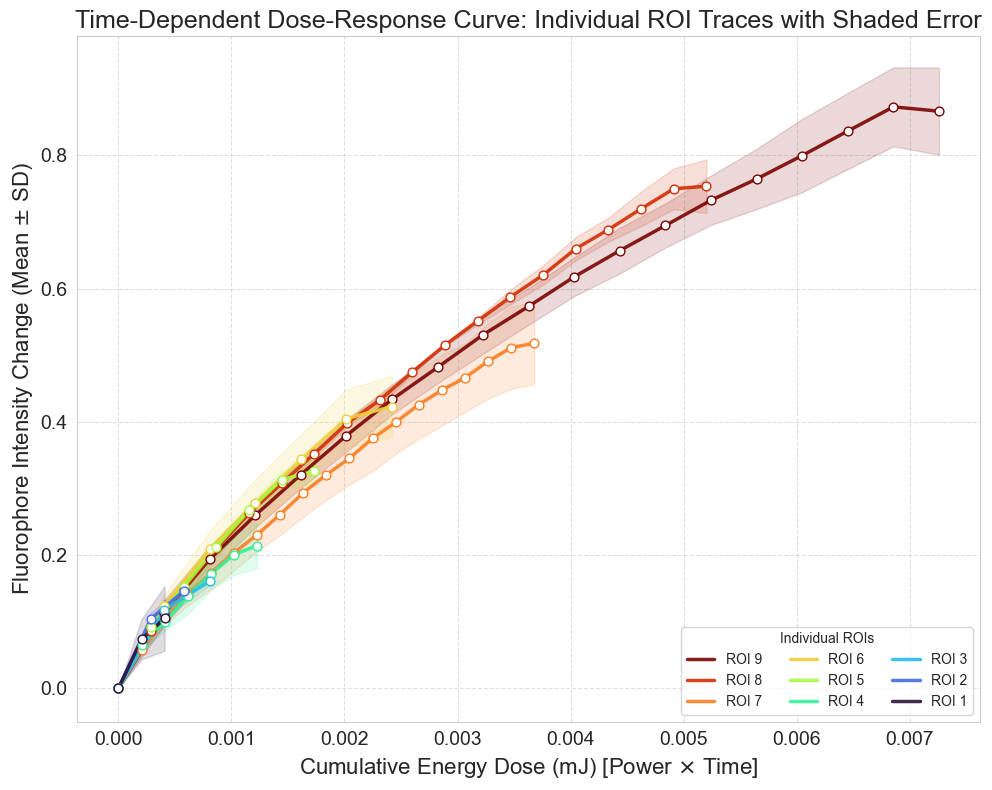

In [ ]:
# PLOTTING: Individual ROI Traces with Shaded Error (Excluding Group Fits)
# --- 📊 Part 4b: PLOT INDIVIDUAL TRACES WITH SHADED ERROR (NO FITS) ---

print("\n--- 4b. Plotting Individual Traces with Shaded Error (No Fits) ---")

fig_shade, ax_shade = plt.subplots(figsize=(10, 8))

# Define colors and ROI map again (if running this block separately)
cmap_roi = cm.get_cmap('turbo') 
unique_roi_labels = np.unique(df_data['ROI_Label'])
num_rois = len(unique_roi_labels)
roi_color_map = {label: cmap_roi(i / (num_rois - 1)) 
                 for i, label in enumerate(unique_roi_labels)}

# Iterate through ROI labels in REVERSE order (ROI 1 on top)
sorted_roi_labels = np.sort(unique_roi_labels)
reversed_roi_labels = sorted_roi_labels[::-1]

for label in reversed_roi_labels:
    roi_mask = (df_data['ROI_Label'] == label)
    roi_data = df_data[roi_mask].copy()
    
    roi_plot_color = roi_color_map[label]
    roi_data.sort_values(by='Dose_mJ', inplace=True)
    
    roi_doses = roi_data['Dose_mJ'].values
    roi_changes = roi_data['Change_in_Intensity'].values
    roi_sd = roi_data['Change_SD'].values # SD for shading
    
    # Calculate upper and lower bounds for the shading
    y_upper = roi_changes + roi_sd
    y_lower = roi_changes - roi_sd
    
    # 1. Plotting the Shaded Error (Mean +/- SD) - LOW ZORDER (3)
    ax_shade.fill_between(roi_doses, y_lower, y_upper, 
                         color=roi_plot_color, 
                         alpha=0.15, # Use a light alpha for shading
                         zorder=3,
                         label=None) 
    
    # 2. Plotting the Mean ROI Trace (Solid line) - HIGH ZORDER (5)
    ax_shade.plot(roi_doses, roi_changes, 
                 color=roi_plot_color, 
                 linestyle='-', linewidth=2.5, alpha=0.9, 
                 zorder=5, 
                 label=f'ROI {label}')
    
    # 3. Plotting the markers (for clarity at each measurement point) - HIGHEST ZORDER (6)
    ax_shade.scatter(roi_doses, roi_changes,
                    edgecolors=roi_plot_color,
                    marker='o', s=40, 
                    linewidths=1,
                    facecolors='white', 
                    zorder=6,
                    label=None)

# Set labels and title
ax_shade.set_xlabel("Cumulative Energy Dose (mJ) [Power $\\times$ Time]", fontsize=16)
ax_shade.set_ylabel("Fluorophore Intensity Change (Mean $\\pm$ SD)", fontsize=16)
ax_shade.set_title("Time-Dependent Dose-Response Curve: Individual ROI Traces with Shaded Error", fontsize=18)
ax_shade.grid(True, linestyle='--', alpha=0.6, zorder=1)

# Legend now shows individual ROI colors
ax_shade.legend(loc='lower right', fontsize=10, ncol=3, title="Individual ROIs") 
ax_shade.tick_params(axis='both', which='major', labelsize=14)
ax_shade.set_ylim(bottom=-0.05) 

plt.tight_layout()
output_file_shade = "dose_response_INDIVIDUAL_TRACES_Shaded_Error.svg"
plt.savefig(output_file_shade, format="svg")
print(f"\nPlot 4b saved successfully as {output_file_shade}")
print("\n--- All Plotting Complete ---")


--- 4a. Plotting Quadratic Fits (ROI Traces with Errorbars) ---

Plot 4a saved successfully as dose_response_QUADRATIC_FIT_ROI_on_top_SD_errorbars.svg


/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/208457292.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_roi = cm.get_cmap('turbo')
/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/208457292.py:5: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_viridis = cm.get_cmap('viridis')


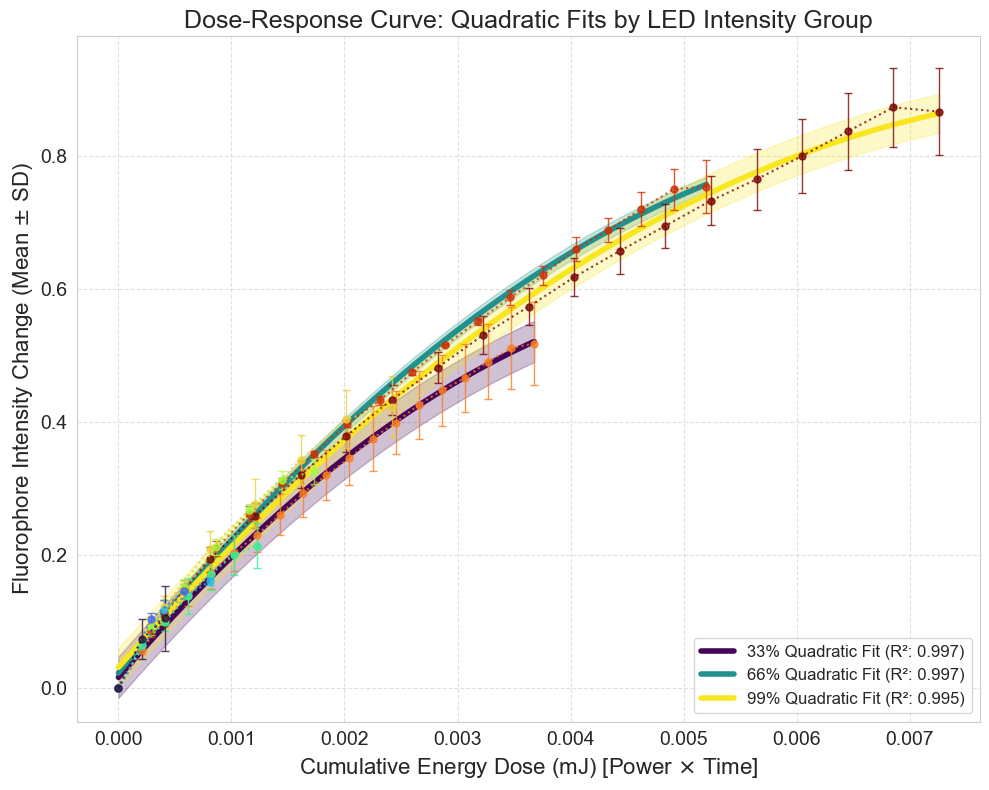

In [ ]:
# PLOTTING: Quadratic Group Fits vs. Individual ROI Traces with Errorbars

# --- 📊 Part 4a: PLOT QUADRATIC FITS AND INDIVIDUAL TRACES (ERRORBARS) ---

# Define plot colors (MUST be run in the plotting environment)
cmap_roi = cm.get_cmap('turbo') 
cmap_viridis = cm.get_cmap('viridis')
box_plot_colors = {
    33: cmap_viridis(0.01), 66: cmap_viridis(0.5), 99: cmap_viridis(0.99)
}
intensity_groups_plot = {
    '33%': {'intensity': 33, 'color': box_plot_colors[33]}, 
    '66%': {'intensity': 66, 'color': box_plot_colors[66]},
    '99%': {'intensity': 99, 'color': box_plot_colors[99]}
}

print("\n--- 4a. Plotting Quadratic Fits (ROI Traces with Errorbars) ---")

fig_quad, ax_quad = plt.subplots(figsize=(10, 8))

# ROI coloring map
unique_roi_labels = np.unique(df_data['ROI_Label'])
num_rois = len(unique_roi_labels)
roi_color_map = {label: cmap_roi(i / (num_rois - 1)) 
                 for i, label in enumerate(unique_roi_labels)}

# ---------------------------------------------------------------------
# PART A: Quadratic Regression and Plotting (Background)
# ---------------------------------------------------------------------

for intensity_label, group_data in intensity_groups_plot.items():
    intensity_val = group_data['intensity']
    fit_color = group_data['color']
    
    mask = (df_data['Intensity_Group'] == intensity_val)
    group_doses = df_data['Dose_mJ'][mask].values
    group_changes = df_data['Change_in_Intensity'][mask].values 
    group_sd = df_data['Change_SD'][mask].values 
    
    if len(group_doses) > 2 and np.std(group_doses) > 1e-6:
        coeffs = np.polyfit(group_doses, group_changes, 2)
        p_quad = np.poly1d(coeffs)
        
        x_fit = np.linspace(group_doses.min(), group_doses.max(), 100)
        y_fit_quadratic = p_quad(x_fit)
        
        ss_res = np.sum((group_changes - p_quad(group_doses))**2)
        ss_tot = np.sum((group_changes - np.mean(group_changes))**2)
        r_squared_quad = 1 - (ss_res / ss_tot)
        
        avg_sd = np.mean(group_sd)
        
        # Plot the Shading (Mean +/- SD) - ZORDER 3
        ax_quad.fill_between(x_fit, y_fit_quadratic - avg_sd, y_fit_quadratic + avg_sd, 
                            color=fit_color, alpha=0.25, zorder=3, label=None) 
        
        # Plot the Quadratic Fit Line - ZORDER 4
        ax_quad.plot(x_fit, y_fit_quadratic, color=fit_color, linestyle='-', linewidth=4, 
                     zorder=4,
                     label=f'{intensity_label} Quadratic Fit (R²: {r_squared_quad:.3f})')
        
# ---------------------------------------------------------------------
# PART B: Individual ROI Traces with Errorbars (Foreground)
# ---------------------------------------------------------------------

sorted_roi_labels = np.sort(unique_roi_labels)
reversed_roi_labels = sorted_roi_labels[::-1]

for label in reversed_roi_labels:
    roi_mask = (df_data['ROI_Label'] == label)
    roi_data = df_data[roi_mask].copy()
    
    roi_plot_color = roi_color_map[label]
    roi_data.sort_values(by='Dose_mJ', inplace=True)
    
    roi_doses = roi_data['Dose_mJ'].values
    roi_changes = roi_data['Change_in_Intensity'].values
    roi_sd = roi_data['Change_SD'].values
    
    # Plotting the Mean ROI Trace, Markers, and Error Bars (SD) - ZORDER 8
    ax_quad.errorbar(roi_doses, roi_changes, 
                     yerr=roi_sd, 
                     fmt='o',                        
                     color=roi_plot_color,           
                     linestyle=':',                  
                     linewidth=1.5,                  
                     markersize=5,                   
                     capsize=3,                      
                     elinewidth=1.0,                 
                     alpha=0.8, 
                     zorder=8, 
                     label=None)

# Set labels and title
ax_quad.set_xlabel("Cumulative Energy Dose (mJ) [Power $\\times$ Time]", fontsize=16)
ax_quad.set_ylabel("Fluorophore Intensity Change (Mean $\\pm$ SD)", fontsize=16)
ax_quad.set_title("Dose-Response Curve: Quadratic Fits by LED Intensity Group", fontsize=18)
ax_quad.grid(True, linestyle='--', alpha=0.6, zorder=1)
ax_quad.legend(loc='lower right', fontsize=12) 
ax_quad.tick_params(axis='both', which='major', labelsize=14)
ax_quad.set_ylim(bottom=-0.05) 

plt.tight_layout()
output_file_quad = "dose_response_QUADRATIC_FIT_ROI_on_top_SD_errorbars.svg"
plt.savefig(output_file_quad, format="svg") 
print(f"\nPlot 4a saved successfully as {output_file_quad}")

In [64]:
# Saturation Analysis: NLMEM Proxy via LMEM on Double Reciprocal Data

import numpy as np
import pandas as pd
import statsmodels.formula.api as smf
from numpy import divide

# ====================================================================
# --- REQUIRED SETUP: Re-define/Load Essential Variables ---
# --- You MUST ensure these variables hold your actual data before running ---

# 1. Re-create the base DataFrame: df_saturation
df_saturation = pd.DataFrame({
    'Change_in_Intensity': changes_avg_all,
    'Dose_mJ': doses_all,
    'Intensity_Group': intensity_p_all.astype(str)
})

# ====================================================================
# --- LMEM ANALYSIS CODE (Original Code) ---

# --- 1. Prepare Data with ROI Labels and Reciprocal Values ---
df_lm_analysis = df_saturation.copy()
df_lm_analysis['ROI_Label'] = roi_labels_all 

# Calculate Reciprocal values, handling zeros/NaNs
df_lm_analysis['Reciprocal_Dose'] = divide(
    1, df_lm_analysis['Dose_mJ'], 
    where=(df_lm_analysis['Dose_mJ'] != 0), 
    out=np.full_like(df_lm_analysis['Dose_mJ'], np.nan)
)
df_lm_analysis['Reciprocal_Change'] = divide(
    1, df_lm_analysis['Change_in_Intensity'], 
    where=(df_lm_analysis['Change_in_Intensity'] != 0), 
    out=np.full_like(df_lm_analysis['Change_in_Intensity'], np.nan)
)
df_lm_analysis.dropna(subset=['Reciprocal_Dose', 'Reciprocal_Change'], inplace=True)

# --- 2. Run Linear Mixed-Effects Model ---
print("\n--- Linear Mixed-Effects Model (LMEM) on Transformed Data ---")

mixed_model = smf.mixedlm(
    "Reciprocal_Change ~ Reciprocal_Dose * C(Intensity_Group)",
    data=df_lm_analysis,
    groups=df_lm_analysis["ROI_Label"], 
    re_formula="~ Reciprocal_Dose" 
).fit(method='nm', maxiter=2000)

print(mixed_model.summary())

# ====================================================================
# --- COEFFICIENT EXTRACTION (NEW SECTION) ---
# ====================================================================

# Extract the fixed effects table from the results object
coef_table = mixed_model.params

# Create a dictionary to hold the dynamically extracted coefficients
lmem_fixed_effects_coefs = {
    'lm_intercept': coef_table.loc['Intercept'],
    'lm_slope_base': coef_table.loc['Reciprocal_Dose'],
    # Intensity Group 66% difference (T.66)
    'lm_intercept_T66': coef_table.loc['C(Intensity_Group)[T.66]'],
    'lm_slope_T66': coef_table.loc['Reciprocal_Dose:C(Intensity_Group)[T.66]'],
    # Intensity Group 99% difference (T.99)
    'lm_intercept_T99': coef_table.loc['C(Intensity_Group)[T.99]'],
    'lm_slope_T99': coef_table.loc['Reciprocal_Dose:C(Intensity_Group)[T.99]']
}

print("\n--- Extracted LMEM Coefficients (for Plotting) ---")
for key, value in lmem_fixed_effects_coefs.items():
    # Store coefficients as standard floats
    globals()[key] = float(value) 
    print(f"{key}: {value:.3f}")

# The variables (lm_intercept, etc.) are now defined globally and ready for block 2.


--- Linear Mixed-Effects Model (LMEM) on Transformed Data ---
                       Mixed Linear Model Regression Results
Model:                    MixedLM       Dependent Variable:       Reciprocal_Change
No. Observations:         78            Method:                   REML             
No. Groups:               9             Scale:                    0.0586           
Min. group size:          2             Log-Likelihood:           -46.7101         
Max. group size:          18            Converged:                Yes              
Mean group size:          8.7                                                      
-----------------------------------------------------------------------------------
                                         Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-----------------------------------------------------------------------------------
Intercept                                 2.982    1.033  2.886 0.004  0.957  5.008
C(Intensity_Group)[T.66]            

/Users/kos-mos/miniforge3/envs/DFF_2025-6_Env/lib/python3.13/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)



LMEM Fixed-Effects Plot with traces saved successfully as dose_response_LMEM_fixed_effects_with_traces_plot.svg

--- Derived Vmax and Km from LMEM Fixed Effects ---
33% Intensity: Vmax = 0.335, Km = 0.001
66% Intensity: Vmax = 0.466, Km = 0.001
99% Intensity: Vmax = 0.520, Km = 0.001


/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_1727/3239733922.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_box = cm.get_cmap('viridis')


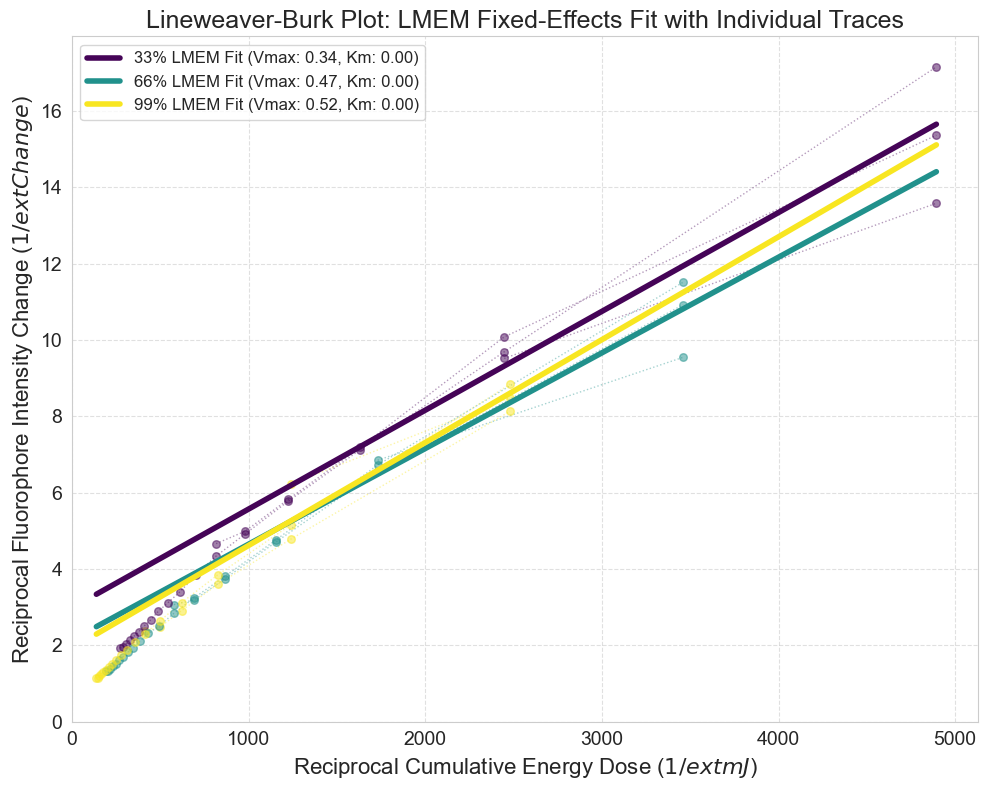

In [ ]:
# Double Reciprocal Plot of LMEM Fixed-Effects
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd 

# --- WARNING: Ensure Code Block 1 was run immediately before this block. ---

# --- Plotting Setup ---
cmap_box = cm.get_cmap('viridis')
box_plot_colors = {
    '33': cmap_box(0.01),
    '66': cmap_box(0.5),
    '99': cmap_box(0.99)
}
intensity_groups_plot = {
    '33': {'color': box_plot_colors['33'], 'label': '33% Intensity'}, 
    '66': {'color': box_plot_colors['66'], 'label': '66% Intensity'},
    '99': {'color': box_plot_colors['99'], 'label': '99% Intensity'}
}

fig, ax = plt.subplots(figsize=(10, 8))

# --- 1. Plot the raw Reciprocal Data Points, connected by ROI (dotted lines) ---
# Assuming df_lm_analysis was created in Block 1
unique_roi_labels = np.unique(df_lm_analysis['ROI_Label'])

for label in unique_roi_labels:
    roi_mask = (df_lm_analysis['ROI_Label'] == label)
    roi_data = df_lm_analysis[roi_mask].copy() 
    roi_data.sort_values(by='Reciprocal_Dose', inplace=True)
    roi_intensity_str = roi_data['Intensity_Group'].iloc[0]
    
    # Plot individual points
    ax.scatter(roi_data['Reciprocal_Dose'],
               roi_data['Reciprocal_Change'],
               color=box_plot_colors[roi_intensity_str], alpha=0.5, marker='o', s=30, label=None,
               zorder=3) 

    # Plot dotted line connecting points for this ROI
    ax.plot(roi_data['Reciprocal_Dose'],
            roi_data['Reciprocal_Change'],
            color=box_plot_colors[roi_intensity_str], linestyle=':', linewidth=1, alpha=0.4, label=None,
            zorder=2) 

# --- 2. Generate and Plot the Fixed-Effects LMEM Lines (solid lines) ---
x_fit = np.linspace(df_lm_analysis['Reciprocal_Dose'].min(), 
                     df_lm_analysis['Reciprocal_Dose'].max(), 100)

# The following variables are now read dynamically from Block 1:
group_fits = {
    '33': {'intercept': lm_intercept, 'slope': lm_slope_base},
    '66': {'intercept': lm_intercept + lm_intercept_T66, 'slope': lm_slope_base + lm_slope_T66},
    '99': {'intercept': lm_intercept + lm_intercept_T99, 'slope': lm_slope_base + lm_slope_T99}
}

# Plot the LMEM lines
for group_str, fit_params in group_fits.items():
    y_fit = fit_params['intercept'] + fit_params['slope'] * x_fit
    
    # Calculate the Vmax and Km derived from the LMEM coefficients (for reporting)
    Vmax_lm = 1 / fit_params['intercept']
    Km_lm = fit_params['slope'] / fit_params['intercept']
    
    ax.plot(x_fit, y_fit, 
            color=box_plot_colors[group_str], 
            linewidth=4, 
            label=(f"{group_str}% LMEM Fit (Vmax: {Vmax_lm:.2f}, Km: {Km_lm:.2f})"),
            zorder=4) 


# Set plot labels and title
ax.set_xlabel("Reciprocal Cumulative Energy Dose ($1/\text{mJ}$)", fontsize=16)
ax.set_ylabel("Reciprocal Fluorophore Intensity Change ($1/\text{Change}$)", fontsize=16)
ax.set_title("Lineweaver-Burk Plot: LMEM Fixed-Effects Fit with Individual Traces", fontsize=18)
ax.grid(True, linestyle='--', alpha=0.6, zorder=1)
ax.legend(loc='upper left', fontsize=12)
ax.tick_params(axis='both', which='major', labelsize=14)
ax.set_ylim(bottom=0) 
ax.set_xlim(left=0) 

plt.tight_layout()
output_file_lmem_plot_traces = "dose_response_LMEM_fixed_effects_with_traces_plot.svg"
plt.savefig(output_file_lmem_plot_traces, format="svg")
print(f"\nLMEM Fixed-Effects Plot with traces saved successfully as {output_file_lmem_plot_traces}")

# Report the derived Vmax and Km for reference
print("\n--- Derived Vmax and Km from LMEM Fixed Effects ---")
for group_str, fit_params in group_fits.items():
    Vmax_lm = 1 / fit_params['intercept']
    Km_lm = fit_params['slope'] / fit_params['intercept']
    print(f"{group_str}% Intensity: Vmax = {Vmax_lm:.3f}, Km = {Km_lm:.3f}")

## - (Other) ROI area, comparison of ROI stim area compared to full FOV


--- ROI Area Analysis (Pixel Counts) ---
ROI Label 1 : Area = 136900 pixels
ROI Label 2 : Area = 136900 pixels
ROI Label 3 : Area = 136900 pixels
ROI Label 4 : Area = 136900 pixels
ROI Label 5 : Area = 136900 pixels
ROI Label 6 : Area = 136900 pixels
ROI Label 7 : Area = 136900 pixels
ROI Label 8 : Area = 136900 pixels
ROI Label 9 : Area = 136900 pixels
ROI Label 10: Area = 138375 pixels
-----------------------------------
Total Pixels in all 9 ROIs: 1370475
--- ROI Area Analysis Complete ---


/var/folders/3r/1wbh9pvd00n8_v35hpkny39w0000gn/T/ipykernel_37367/2652844129.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('turbo', num_colors)


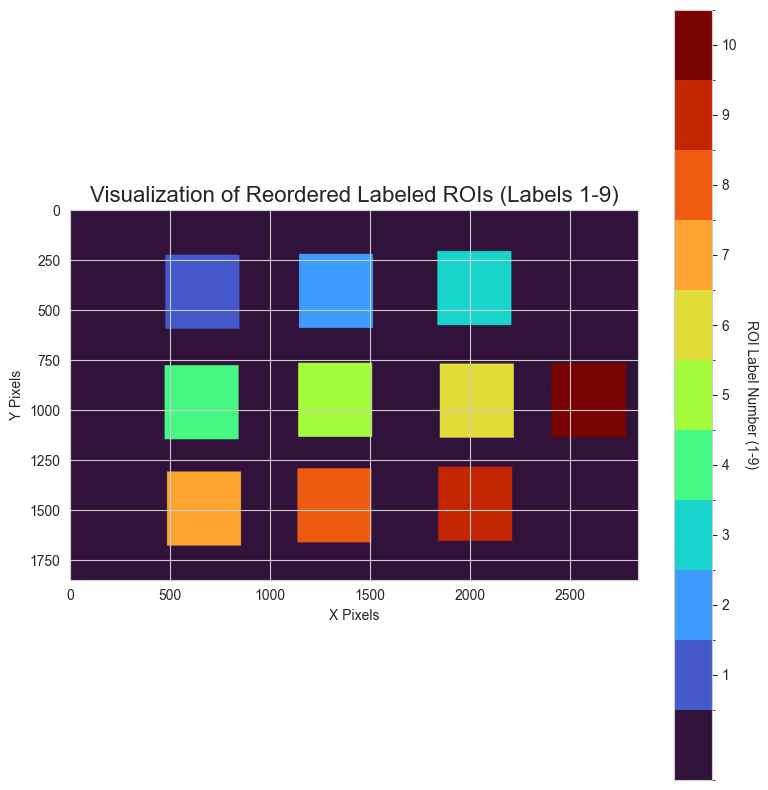


--- ROI Visualization Complete ---


In [170]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors # Needed for customized color map

# --- 🎯 Part 1: PREREQUISITE CHECK ---

# Assume reordered_labeled_mask is available from the main script
try:
    if 'reordered_labeled_mask' not in locals() and 'reordered_labeled_mask' not in globals():
        print("ERROR: 'reordered_labeled_mask' variable not found in the environment.")
        print("Please ensure the mask data is loaded or defined.")
        exit()
    mask = reordered_labeled_mask
    mask_labels = np.unique(mask[mask > 0]) # Get unique labels > 0 (1 through 9)
    if len(mask_labels) == 0:
        print("ERROR: 'reordered_labeled_mask' contains no positive ROI labels (1-9).")
        exit()

except Exception as e:
    print(f"CRITICAL ERROR: Failed to access or process reordered_labeled_mask. {e}")
    exit()

# --- 🎯 Part 2: CALCULATE AND PRINT ROI AREAS ---

roi_areas = {}
total_roi_area = 0

print("\n--- ROI Area Analysis (Pixel Counts) ---")

for label in mask_labels:
    # Count pixels matching the current label
    area = np.sum(mask == label)
    roi_areas[label] = area
    total_roi_area += area
    print(f"ROI Label {int(label):<2}: Area = {area} pixels")

print("-" * 35)
print(f"Total Pixels in all 9 ROIs: {total_roi_area}")
print("--- ROI Area Analysis Complete ---")


# --- 🎯 Part 3: VISUALIZE ROI MASK ---

# 1. Setup Colormap and Normalization
# Define a discrete colormap for labels 1 to 9 (plus 0 for background)
num_colors = len(mask_labels) + 1
# Use a distinct colormap (e.g., 'turbo', 'gist_ncar')
cmap = plt.cm.get_cmap('turbo', num_colors) 
# Normalize the colors so each integer label gets a unique color
norm = colors.BoundaryNorm(np.arange(num_colors + 1) - 0.5, num_colors) 

fig_mask, ax_mask = plt.subplots(figsize=(8, 8))

# 2. Display the Mask
im = ax_mask.imshow(mask, cmap=cmap, norm=norm) 

# 3. Add Labels and Title
ax_mask.set_title("Visualization of Reordered Labeled ROIs (Labels 1-9)", fontsize=16)
ax_mask.set_xlabel("X Pixels")
ax_mask.set_ylabel("Y Pixels")

# 4. Create a Colorbar
# The colorbar helps identify which color corresponds to which label.
cbar = fig_mask.colorbar(im, ax=ax_mask, ticks=mask_labels)
cbar.set_label('ROI Label Number (1-9)', rotation=270, labelpad=15)
cbar.ax.set_yticklabels([str(int(l)) for l in mask_labels])

plt.tight_layout()
plt.show()

print("\n--- ROI Visualization Complete ---")

Loaded 'full_dmd_roi_image' from: /Users/kos-mos/Documents/EntireDMD_ROI_2.tif

Displaying ROI masks side-by-side with relativistic height preserved...


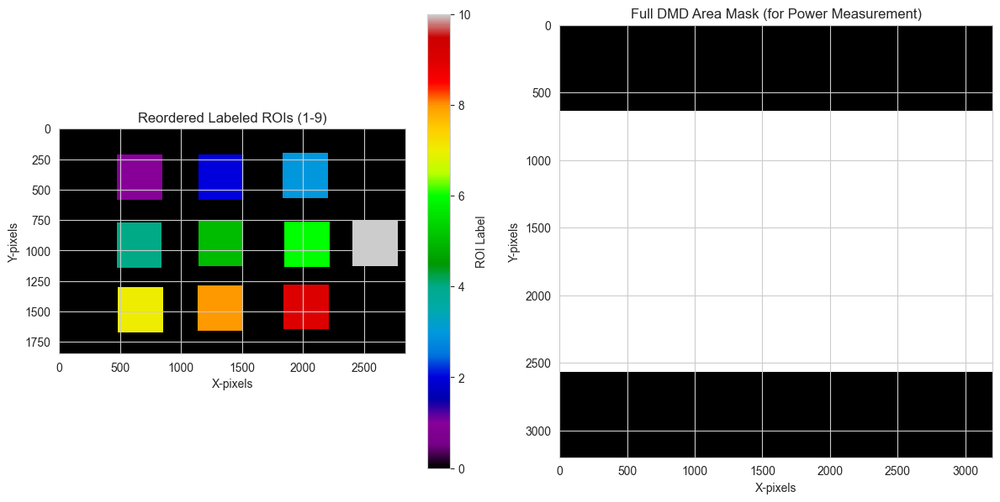


--- ROI Mask Visualization Complete ---


In [171]:
import numpy as np
import matplotlib.pyplot as plt
import tifffile # For loading TIF files
import os # For checking file paths

# --- ASSUMED VARIABLES FROM YOUR ENVIRONMENT ---
# reordered_labeled_mask: The 2D array representing your 9 stimulated ROIs (labeled 1-9).
# full_dmd_roi_image: The 2D array representing the full DMD area used for power measurements.
# roi_image_path: Path to the TIF file for full_dmd_roi_image.

# --- Load the images (assuming they are in the specified path or already loaded) ---
# If you didn't load `reordered_labeled_mask` from a file, replace this with your actual loading method.
try:
    # Attempt to load full_dmd_roi_image
    full_dmd_roi_image = tifffile.imread(roi_image_path)
    print(f"Loaded 'full_dmd_roi_image' from: {roi_image_path}")
except FileNotFoundError:
    print(f"WARNING: TIF file for 'full_dmd_roi_image' not found at {roi_image_path}. Assuming it's pre-loaded or created.")
    # If not found, you might need to create a dummy or ensure it's loaded elsewhere
    if 'full_dmd_roi_image' not in locals():
        print("ERROR: 'full_dmd_roi_image' is neither found nor pre-loaded. Cannot display.")
        exit()

# Assuming 'reordered_labeled_mask' is already loaded or will be loaded similarly
if 'reordered_labeled_mask' not in locals():
    print("ERROR: 'reordered_labeled_mask' is not defined. Please ensure it's loaded or created.")
    exit()

# --- Display the images side-by-side ---

print("\nDisplaying ROI masks side-by-side with relativistic height preserved...")

fig, axes = plt.subplots(1, 2, figsize=(12, 6)) # 1 row, 2 columns, adjust figsize as needed

# Plot reordered_labeled_mask
im1 = axes[0].imshow(reordered_labeled_mask, cmap='nipy_spectral', interpolation='nearest')
axes[0].set_title('Reordered Labeled ROIs (1-9)')
axes[0].set_xlabel('X-pixels')
axes[0].set_ylabel('Y-pixels')
# Add a colorbar for the labeled mask
fig.colorbar(im1, ax=axes[0], orientation='vertical', label='ROI Label')


# Plot full_dmd_roi_image
# Use a simple binary colormap or grayscale if it's a mask
im2 = axes[1].imshow(full_dmd_roi_image, cmap='gray', interpolation='nearest') 
axes[1].set_title('Full DMD Area Mask (for Power Measurement)')
axes[1].set_xlabel('X-pixels')
axes[1].set_ylabel('Y-pixels')
# Add a colorbar for the binary mask (optional, as it's typically 0 or 1)
# fig.colorbar(im2, ax=axes[1], orientation='vertical', label='Intensity/Mask Value')


# Ensure aspect ratio is equal to preserve relativistic height
axes[0].set_aspect('equal', adjustable='box')
axes[1].set_aspect('equal', adjustable='box')

plt.tight_layout()
plt.show()

print("\n--- ROI Mask Visualization Complete ---")